# Random Forest Model Development

This notebook goes through model development for a Random Forest (RF) regressor designed for high-resolution nutrient prediction in the Southern Ocean. The RF model is trained on data from ocean autonomous profilers, called Argo floats and Seagliders, which take measurements of ocean properties as they are carried by the currents. (This is a gross oversimplification, and further detail is provided in Song et al. (2024) [in progress, AIES].)

Here,  go through the major steps of 
(1) Data Processing,
(2) 

The next notebook, '../Analysis_RandomForest.ipnyb' will use this output to analyze the performance.

# Introduction: Random Forest Background

Random Forest (RF) regression is a supervised machine learning method that averages the results over a "forest" of $n$ decision trees for final prediction. Each decision tree determines a series of conditions at each node based on a set of observed variables, referred to as features. For regression, the trees find conditions that best separate the target observations into branches with the least variance. 

Formally, observations are sorted into $j$ regions of predictor space ($R_j$) during training. Following the notation in \citet{james2013_Introduction}, each node in the tree considers a split into two new regions based on a condition $s$ for a predictor $X_j$:
\begin{equation}
\begin{split}
R_1(j,s) = \{X|X_j < s\} \text{ and } R_2(j,s) = \{X|X_j \ge s\}, \\
\end{split}
\end{equation}
and each region is assigned a prediction value that is the average of all target variable values ($\hat{y}_{R_j}$ ) within $R_j$. The condition $s$ is chosen to minimize the residual sum of squares in the resulting bins:
\begin{equation}
\begin{split}
\sum_{i: \: x_i \in \: R_1(j,s)}{} (y_i-\hat{y}_{R_1})^2 \; + \sum_{i: \: x_i \in \: R_2(j,s)}{} (y_i-\hat{y}_{R_2})^2,
\end{split}
\end{equation}
where $y_i$ represents each observed value. During testing, validation, and prediction, RF sorts input observations into the regions and assigns them the value $\hat{y}_{R_j}$. One advantage of RF is that it limits the decision at each node split to a random subset of features. As a result, the trees in Random Forest are less correlated than those in a family of ``bagged'' trees which consider all possible features at all nodes. The RF method is therefore less prone to overfitting, especially on spatiotemporally biased data (Stock et.al (2022), Sharp et al. 2022). 

# 0.1 Import Packages

In [3]:
# Data Structure/Organization Packages
import pandas as pd
import xarray as xr
import numpy as np
import numpy.ma as ma

# Machine Learning/Statistics Packages
import scipy
from scipy.stats import kde
from scipy.stats import iqr
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import preprocessing

from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score

# Plotting Packages
import matplotlib.pyplot as plt
from cmocean import cm as cmo
import seaborn as sns
import matplotlib.patches as patch
from labellines import labelLine, labelLines
from matplotlib.ticker import FormatStrFormatter

# Utility Packages
import random as rand
import os
import math
import itertools
from scipy import interpolate
from tqdm import tqdm

# Oceanography Packages
import gsw
import sgmod_main as sg
import sgmod_L3proc as gproc     # for L3 grid processing
import sgmod_DFproc as dfproc    # for dataframe processing
import sgmod_plotting as sgplot  
import importlib
import geopy.distance


## Data from Ocean Autonomous Profilers

Here, we develop a regional model using GO-SHIP I06 bottle data and observations from six BGC-Argo floats (WMO: 5904469, 5904659, 5905368, 5905996, 5906031, 5906207), which provided coverage of the Antarctic Southern Zone (ASZ) bounded by the Polar Front and Sea Ice Edge. 

In [9]:
# Input glider data, which has already been quality controlled. 
sg659 = pd.read_csv('../data/glider/mldata_sg659_tsO2corr.csv')
sg660 = pd.read_csv('../data/glider/mldata_sg660_tsO2corr.csv')

# Dive-averaged glider data
dav_659 = pd.read_csv('../data/glider/sg659_diveavg.csv')  
dav_660 = pd.read_csv('../data/glider/sg660_diveavg.csv')

# Float data: 
sgfloat = pd.read_csv('../data/float/mldata_floatDF_qc.csv')
dav_float = pd.read_csv('../data/float/sgfloat_diveavg')

# Ouput of this notebook: 
# df_659 = pd.read_csv('RFpred_659_modG_split2023.csv')
# df_660 = pd.read_csv('RFpred_660_modG_split2023.csv')

In [10]:
# Use AVISO satellite data to see study bounds. 
aviso = xr.open_dataset('../data/satellite/dataset-duacs-nrt-global-merged-allsat-phy-l4_1637011653931.nc')
aviso['eke'] = np.sqrt(aviso.ugosa**2 + aviso.vgosa**2)

NameError: name 'sgfloat' is not defined

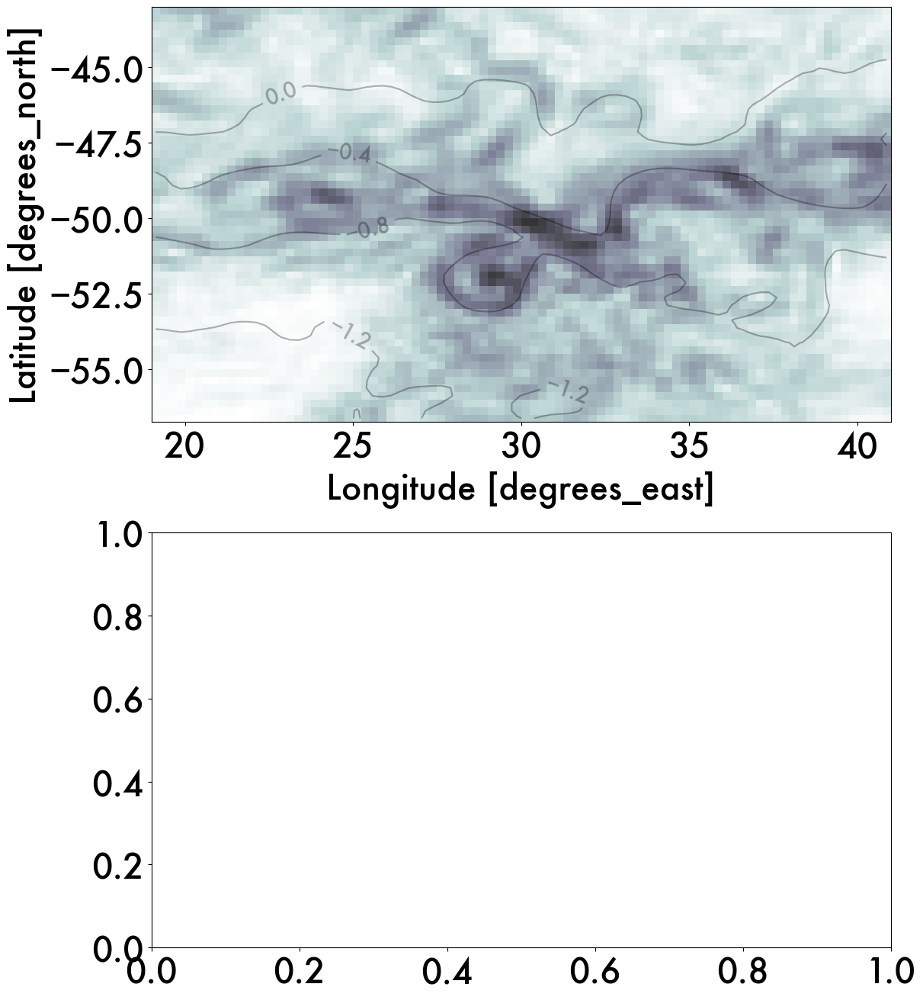

In [11]:
# Map of study region, colored by Eddy Kinetic Energy (EKE)
# Red areas indicate turbulence
fs = (12,13)
fig, axs = plt.subplots(2,1, figsize=fs, layout='constrained')
axs = axs.flatten()

for ax in [axs[0]]:
        datestart='2019-04-30'
        dateend='2019-07-25'
        lat1=-56.8; lat2=-43
        lon1=19; lon2=41
        data_sat = aviso.sel(time=slice(datestart, dateend))
        data_sat = data_sat.sel(latitude=slice(lat1, lat2))
        data_sat = data_sat.sel(longitude=slice(lon1, lon2))
        avg_aviso = data_sat.mean(dim='time')

        # Plot background EKE
        sca = avg_aviso.eke.plot(ax=ax, cmap='bone_r', alpha=0.8, add_colorbar=False, vmin=0.02, vmax=0.58)
        # fig.colorbar(sca, ax=ax, shrink=0.5).set_label('EKE')

        contour = ax.contour(avg_aviso['longitude'], avg_aviso['latitude'], avg_aviso['adt'], 
                                colors='k', alpha=0.3, linestyles='solid', zorder=1, levels=4)
        ax.clabel(contour, inline=True, fontsize=20)  # Add labels to contour lines

        # Plot float
        ax.plot(sgfloat.lon,sgfloat.lat, color =  '#CCBB44', alpha=1, linewidth=4, linestyle='dashed',
                label='float', zorder=3)  # sns.color_palette("Oranges")[3]
        ax.scatter(sgfloat.lon,sgfloat.lat, color =  '#CCBB44', alpha=0.9, s=90, 
                marker='D', edgecolors='k', zorder=3)

        # Gliders
        ax.plot(sg659.lon, sg659.lat, color = glid_colors['sg659'], alpha=0.8, linewidth=6, linestyle='dashed', label='sg659', 
                path_effects=[pe.Stroke(linewidth=8, foreground='k'), pe.Normal()], zorder=3) 

        ax.plot(sg660.lon, sg660.lat, color = glid_colors['sg660'], alpha=0.8, linewidth=4, linestyle='dashed', label='sg660', 
                path_effects=[pe.Stroke(linewidth=6, foreground='w'), pe.Normal()], zorder=3) 

for ax in [axs[1]]:
        datestart='2019-04-30'
        dateend='2019-07-25'
        lat1=-54.7; lat2=-49.2
        lon1=29.5; lon2=39.4
        data_sat = aviso.sel(time=slice(datestart, dateend))
        data_sat = data_sat.sel(latitude=slice(lat1, lat2))
        data_sat = data_sat.sel(longitude=slice(lon1, lon2))
        avg_aviso = data_sat.mean(dim='time')

        # Plot float
        ax.plot(dav_float.lon,dav_float.lat, color =  '#CCBB44', alpha=1, linewidth=4, linestyle='dashed',
        label='float', zorder=3)  # sns.color_palette("Oranges")[3]
        ax.scatter(dav_float.lon.values,dav_float.lat.values, color =  'k', alpha=0.9, s=140, 
                marker='D', edgecolors='k', zorder=3)
        ax.scatter(dav_float.lon.values,dav_float.lat.values, color =  '#CCBB44', alpha=0.9, s=110, 
                marker='D', edgecolors='k', zorder=3)
        
        for ind, day in enumerate([int(x) for x in dav_float.yearday.values]):
                if day in ([120,135,140,150, 160, 170, 185, 205]):
                        ax.text(dav_float.lon.loc[ind]-.3, dav_float.lat.loc[ind]-.4, str(day), 
                                        fontsize=24, color='k',
                        path_effects=[pe.Stroke(linewidth=5, foreground='#CCBB44'), pe.Normal()], zorder=3)

        # Plot Glider
        ax.plot(sg660.lon, sg660.lat, color = glid_colors['sg660'], alpha=0.8, linewidth=3, linestyle='dashed', label='sg660',
                path_effects=[pe.Stroke(linewidth=5, foreground='w'), pe.Normal()], zorder=3) 

        # Plot every 10th glider position
        for day in [120,125,135, 150, 160, 170, 185, 200]:
                i = np.where(dav_660.yearday.round()==day)
                ax.scatter(dav_660.lon.loc[i].values, dav_660.lat.loc[i].values, s=100, color='darkorchid', alpha=0.2, zorder=3)
                ax.text(dav_660.lon.loc[i].values[0]+.04, dav_660.lat.loc[i].values[0]+0.08, str(day), 
                                fontsize=24, color=glid_colors['sg660'],
                        path_effects=[pe.Stroke(linewidth=5, foreground='w'), pe.Normal()], zorder=3)


        # Plot EKE
        sca = avg_aviso.eke.plot(ax=ax, cmap='bone_r', alpha=0.9, add_colorbar=False, zorder=0, vmin=0.02, vmax=0.58)
                        # cbar_kwargs={'label': 'EKE ' + r'$\mathregular{[m^2/s^2]}$'})
        # fig.colorbar(sca, ax=ax).set_label('EKE ' + r'$\mathregular{[m^2/s^2]}$')


        # Plot ADT Contours
        contour = ax.contour(avg_aviso['longitude'], avg_aviso['latitude'], avg_aviso['adt'], 
                        colors='k', alpha=0.3, linestyles='solid', zorder=1, levels=2)
        ax.clabel(contour, inline=True, fontsize=18)  # Add labels to contour lines

fig.colorbar(sca, ax=axs[:], shrink=0.4).set_label('EKE ' + r'$\mathregular{[m^2/s^2]}$')

for ax in axs:
    ax.yaxis.set_major_formatter("{x:1.0f}°S")
    ax.xaxis.set_major_formatter("{x:1.0f}°E")
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_aspect('equal')


# 1.0 Data Setup

In [ ]:
xr.open_dataset('../data/dataset-duacs-nrt-global-merged-allsat-phy-l4_1637011653931.nc')

In [1]:
# Import Packages

#Data Structure/Organization Packages
import pandas as pd
import xarray as xr
import numpy as np
import numpy.ma as ma

# Plotting Packages
import matplotlib.pyplot as plt
from cmocean import cm as cmo
import seaborn as sns
import matplotlib.patches as patch
from labellines import labelLine, labelLines

# Machine Learning/Statistics Packages
import scipy
from scipy.stats import kde
from scipy.stats import iqr
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import preprocessing
# from sklearn import resample

from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_recall_fscore_support as score
# from sklearn.model_selection import cross_val_predict
# from sklearn.model_selection import cross_val_score


# Utility Packages
import random as rand
import os
import math
# import dataframe_image as dfi
import itertools
from scipy import interpolate
from tqdm import tqdm

# Oceanography Packages
import gsw
# import PyCO2SYS as pyco2

import sgmod_main as sg
import sgmod_L3proc as gproc     # for L3 grid processing
import sgmod_DFproc as dfproc    # for dataframe processing
import sgmod_plotting as sgplot  
import importlib

import geopy.distance


In [2]:
plt.style.use('default')

In [3]:
size = 28
params = {'legend.fontsize': size-8, 
          'xtick.labelsize':size, 
          'ytick.labelsize':size, 
          'font.size':size,
          'font.family':'Futura'}
plt.rcParams.update(params)

NameError: name 'df_660' is not defined

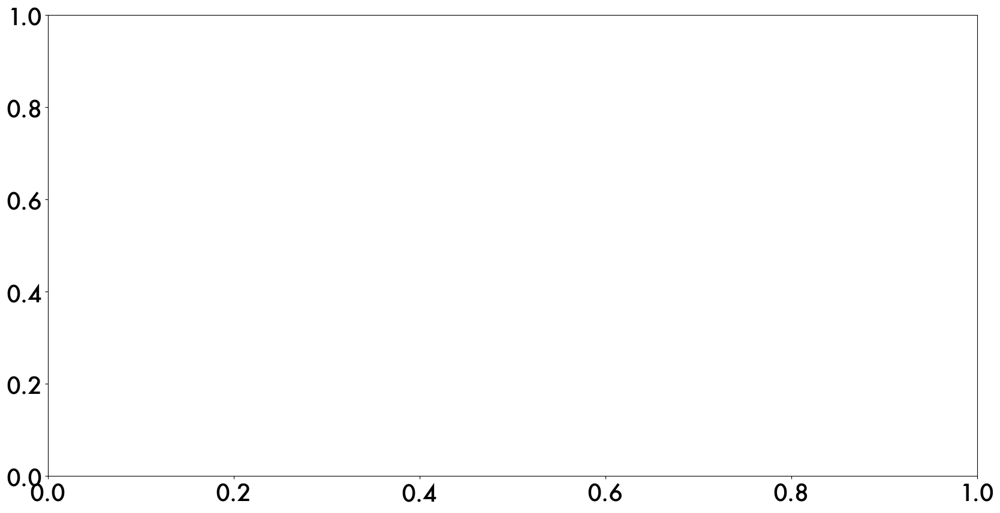

In [4]:
fig = plt.figure(figsize=(20,10))
ax = fig.gca()

tester = df_660[df_660.yearday > 140] 
tester = tester[tester.yearday < 142]
ax.scatter(tester.yearday, tester.pressure, c=tester.CT, cmap=cmo.thermal, marker="s")
ax.set_ylim([700,1000])
# ax.set_ylim([10,20])

### 0.1.1 If rerunning, skip to PART 1

In [5]:
dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/RF-training/'

# floatDF.to_csv(dir + 'mldata_floatDF_' + desc + '.csv')
# shipDF.to_csv(dir + 'mldata_shipDF_' + desc + '.csv')

floatDF = pd.read_csv(dir + 'mldata_floatDF_nov2023.csv')
shipDF = pd.read_csv(dir + 'mldata_shipDF_nov2023.csv')
# wmoids = pd.unique(floatDF.wmoid)

FileNotFoundError: [Errno 2] No such file or directory: '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/RF-training/mldata_floatDF_nov2023.csv'

In [6]:
# Set up WMO color palette
wmoids = pd.unique(floatDF.wmoid)
wmo_colors = dict.fromkeys(wmoids)

wmo_colors[5904469]=sns.color_palette("RdPu")[4]
wmo_colors[5904659]=sns.color_palette("Purples")[4]
wmo_colors[5905368]=sns.color_palette("Paired")[1]
wmo_colors[5905996]=sns.color_palette("YlGn")[3]
wmo_colors[5906030]='k' # sns.color_palette("Reds")[3]  # SOGOS 
wmo_colors[5906031]=sns.color_palette("Blues")[2]
wmo_colors[5906207]=sns.color_palette("Reds")[4]
wmo_colors[5906007]= sns.color_palette("YlOrRd")[3]

NameError: name 'floatDF' is not defined

## 0.2 Load ship and float Files

In [167]:
def print_bounds(DF):
    # print('Bounds of data: \n')
    print('Dates: \t\t' + str(sg.ytd2datetime(DF.yearday.min())) + ' to ' + str(sg.ytd2datetime(DF.yearday.max())))
    print('Latitude:\t' + str(DF.lat.min()) + ' to ' + str(DF.lat.max()))
    print('Longitude:\t' + str(DF.lon.min()) + ' to ' + str(DF.lon.max()))
    
def restrict_DF(data, start_yd, end_yd, lat1, lat2, lon1, lon2):
    data = data[(data.lat > lat1) & (data.lat < lat2)]
    data = data[(data.lon > lon1 ) & (data.lon <lon2)]
    data = data[(data.yearday > start_yd) & (data.yearday < end_yd)]
    return data

In [168]:
# Ship Data (not cut to float bounds yet)
file_path = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/go-ship/'
shipDF = pd.read_csv(file_path + '325020190403_ship_qc_sep2023.csv', index_col=[0])
shipDF = shipDF.reset_index(drop = True)

### 0.2.1 Float Selection

- If floats have already been selected, skip to next section. 

In [191]:
file_path = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/go-bgc/'
# checkDF = pd.read_csv(file_path + 'argo_qc_17float_0917.csv')
checkDF = pd.read_csv('../working-vars/go-bgc/dav_sgfloat_0201.csv', index_col=0)


In [192]:
checkDF[checkDF.wmoid == 5906030][checkDF.yearday<206].profid.unique()

array([5906030000, 5906030001, 5906030002, 5906030003, 5906030004,
       5906030005, 5906030006, 5906030007, 5906030008, 5906030009,
       5906030010, 5906030011, 5906030012, 5906030013, 5906030014,
       5906030015, 5906030016])

In [169]:
# Float Data
file_path = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/go-bgc/'
floatDF = pd.read_csv(file_path + 'argo_qc_17float_0917.csv')
floatDF = floatDF.reset_index(drop = True)

wmoids = pd.unique(floatDF.wmoid)
print(str(len(wmoids)) +  ' floats:')
print(*wmoids)
print_bounds(floatDF)

17 floats:
5904469 5904659 5904847 5905368 5905369 5905370 5905996 5906007 5906008 5906030 5906031 5906033 5906034 5906206 5906207 5906210 5906211
Dates: 		2017-05-08 to 2021-07-17
Latitude:	-67.147 to -45.632
Longitude:	0.0784999999999627 to 69.967


In [170]:
def restrict_DF(data, start_yd, end_yd, lat1, lat2, lon1, lon2):
    data = data[(data.lat > lat1) & (data.lat < lat2)]
    data = data[(data.lon > lon1 ) & (data.lon <lon2)]
    data = data[(data.yearday > start_yd) & (data.yearday < end_yd)]
    return data

In [171]:
# Set up fronts

dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/'
PF = pd.read_csv(dir + 'ACC_fronts_Jade/PF.csv', header=None)
SAF = pd.read_csv(dir + 'ACC_fronts_Jade/SAF.csv', header=None)
SIF = pd.read_csv(dir + 'ACC_fronts_Jade/SIF.csv', header=None)
STF = pd.read_csv(dir + 'ACC_fronts_Jade/STF.csv', header=None)

for csv in [PF, SAF, SIF, STF]:
    csv.columns = ['lon', 'lat']

In [177]:
importlib.reload(dfproc)

<module 'sgmod_DFproc' from '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/scripts/sgmod_DFproc.py'>

In [176]:
# If using fronts, run following (as of jan 2024)
# near final version uses a buffer of 0.5 on either side. (as of feb 2024)
argo_qc = dfproc.between_fronts(floatDF, PF, SIF, buffers=[0.5,0.5])
ship_qc = dfproc.between_fronts(shipDF, PF, SIF, buffers=[0.5,0.5])


# quick trial with buffers of 1, 1 degree instead. --still drops a bunch. not needed.
# argo_qc = dfproc.between_fronts(floatDF, PF, SIF, buffers=[1,1])
# ship_qc = dfproc.between_fronts(shipDF, PF, SIF, buffers=[1,1])

print_bounds(argo_qc)
wmoids = argo_qc.wmoid.unique()
print('Number of floats within bounds: ' + str(len(argo_qc.wmoid.unique())))
print(argo_qc.wmoid.unique())

argo_qc.value_counts('wmoid')

Dates: 		2017-05-08 to 2021-07-14
Latitude:	-59.566 to -49.263
Longitude:	0.0784999999999627 to 69.967
Number of floats within bounds: 10
[5904469 5904659 5905368 5905370 5905996 5906007 5906030 5906031 5906207
 5906211]


wmoid
5906030    4056
5905996    4017
5906007    3784
5906031    3552
5904659    3040
5906207    2777
5905368    1842
5905370    1300
5904469    1103
5906211     592
dtype: int64

In [177]:
# If using fronts , continue to restrict manually (jan 2024)
start_yd = sg.datetime2ytd(np.datetime64('2017-04-20')) # datetime(2019,4,30)  # yd 120
end_yd = sg.datetime2ytd(np.datetime64('2021-07-30')) # datetime(2019,7,19)  # yd 200

lat1 = -65; lat2 = -45
lon1 = 5; lon2 = 65

argo_qc = restrict_DF(argo_qc, start_yd, end_yd, lat1, lat2, lon1, lon2)
ship_qc = restrict_DF(ship_qc, start_yd, end_yd, lat1, lat2, lon1, lon2)

print_bounds(argo_qc)
wmoids = argo_qc.wmoid.unique()
print('Number of floats within bounds: ' + str(len(argo_qc.wmoid.unique())))
# print(argo_qc.wmoid.unique())
argo_qc.value_counts('wmoid')

Dates: 		2017-05-08 to 2021-07-11
Latitude:	-59.566 to -49.263
Longitude:	5.3 to 64.896
Number of floats within bounds: 9


wmoid
5905996    3837
5906007    3725
5906030    3644
5906031    3552
5906207    2777
5904659    2698
5905368    1622
5904469    1103
5906211     592
dtype: int64

In [689]:
# # ORIGINAL: Restrict training data
# start_yd = sg.datetime2ytd(np.datetime64('2017-04-20')) # datetime(2019,4,30)  # yd 120
# end_yd = sg.datetime2ytd(np.datetime64('2021-07-30')) # datetime(2019,7,19)  # yd 200

# lat1 = -61
# lat2 = -45
# lon1 = 5
# lon2 = 65

# argo_qc = restrict_DF(floatDF, start_yd, end_yd, lat1, lat2, lon1, lon2)
# ship_qc = restrict_DF(shipDF, start_yd, end_yd, lat1, lat2, lon1, lon2)

# print_bounds(argo_qc)
# wmoids = argo_qc.wmoid.unique()
# print('Number of floats within bounds: ' + str(len(argo_qc.wmoid.unique())))
# print(argo_qc.wmoid.unique())

Dates: 		2017-05-08 to 2021-07-11
Latitude:	-60.809 to -47.303
Longitude:	5.3 to 64.896
Number of floats within bounds: 12
[5904469 5904659 5904847 5905368 5905996 5906007 5906008 5906030 5906031
 5906206 5906207 5906211]


In [174]:
# Remove any floats that have fewer than 100 obs
newdf = pd.DataFrame()
for wmo in wmoids: 
    flo = argo_qc[argo_qc.wmoid==wmo]
    if len(flo)>100:
        newdf = pd.concat([newdf, flo])
    else:
        print('wmo ' + str(wmo) + ' removed.')
argo_qc = newdf.copy()

wmoids = argo_qc.wmoid.unique()
print('Number of floats within bounds: ' + str(len(argo_qc.wmoid.unique())))
# argo_qc.value_counts('wmoid')
print(argo_qc.wmoid.unique())

Number of floats within bounds: 10
[5904469 5904659 5904847 5905368 5905996 5906007 5906030 5906031 5906207
 5906211]


/opt/homebrew/Caskroom/mambaforge/base/envs/mlsogos/lib/python3.8/site-packages/labellines/core.py:204: UserWarning: The value at position 2 in `xvals` is outside the range of its associated line (xmin=10.274798004088938, xmax=11.089, xval=17.98700623476118). Clipping it into the allowed range.
  warnings.warn(
/opt/homebrew/Caskroom/mambaforge/base/envs/mlsogos/lib/python3.8/site-packages/labellines/core.py:204: UserWarning: The value at position 7 in `xvals` is outside the range of its associated line (xmin=56.495, xmax=64.896, xval=23.814166765813393). Clipping it into the allowed range.
  warnings.warn(


[Text(29.641327296865608, -57.54562140310595, '4469'),
 Text(12.159845703708964, -51.90468288008494, '4659'),
 Text(11.007579800408894, -54.9300651565017, '4847'),
 Text(58.777129952126685, -57.46897229609664, '5368'),
 Text(6.332685172656749, -50.70370349905567, '5996'),
 Text(47.122808890022256, -58.28196376150774, '6007'),
 Text(41.29564835897004, -54.608313734190965, '6031'),
 Text(64.0559, -55.10580084507042, '6207'),
 Text(52.94996942107447, -59.182829104347995, '6211'),
 Text(35.468487827917826, -53.418675649865605, '6030')]

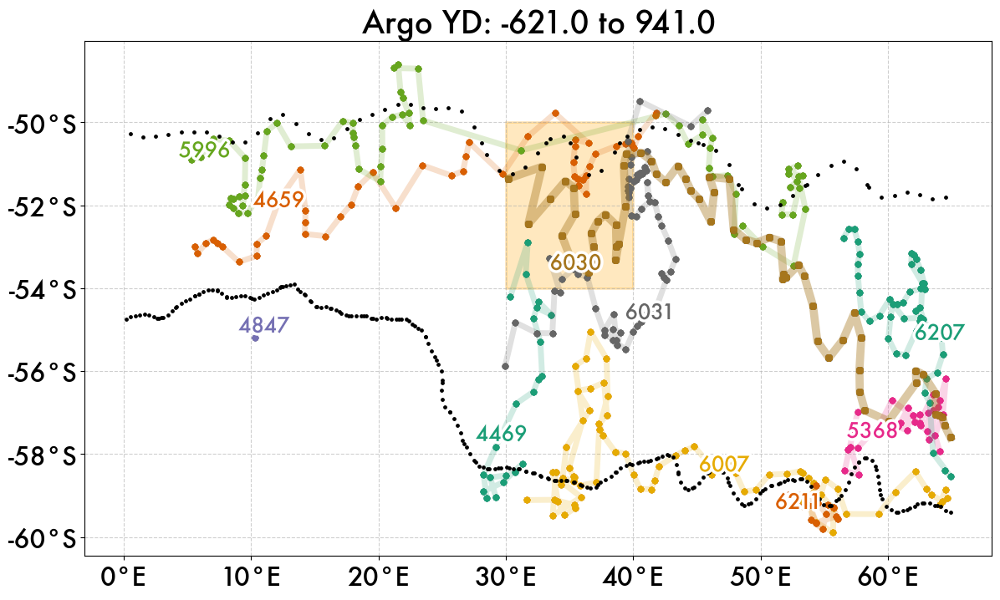

In [175]:
# Reference: Initial matchup map for floats before wmo drop.

# Set up initial WMO color palette
wmo_colors = dict.fromkeys(wmoids)
pal = sns.color_palette('Dark2', len(wmoids))
for i, wmo in enumerate(wmoids):
    wmo_colors[wmo] = pal[i]

fig = plt.figure(figsize=(14,8))
ax=plt.gca()

for wmo in wmoids[wmoids!=5906030]:
    ax.plot(argo_qc[argo_qc.wmoid==wmo].lon,argo_qc[argo_qc.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.2, linewidth=5, label=str(wmo)[3:], zorder=3)
    ax.scatter(argo_qc[argo_qc.wmoid==wmo].lon,argo_qc[argo_qc.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.1, s=20, zorder=3)

for wmo in [5906030]:
    ax.plot(argo_qc[argo_qc.wmoid==wmo].lon,argo_qc[argo_qc.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.4, linewidth=7, label=str(wmo)[3:], zorder=3)
    ax.scatter(argo_qc[argo_qc.wmoid==wmo].lon,argo_qc[argo_qc.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.1, s=30, zorder=3)

plt.title('Argo YD: ' + str(start_yd) + ' to ' + str(end_yd))
rect = patch.Rectangle((30,-54),10,4, fill=True, color="orange", alpha=0.25,linewidth=2, zorder=1)

for front in [SIF, PF]:
     front = front[(front.lon > 0 ) & (front.lon <65)]
     ax.scatter(front.lon, front.lat, color='k', s=6, zorder=3)
     

# ax.legend()
ax.add_patch(rect)
# ax.set_xlim(5,81)
# ax.set_ylim(-60,-30)
# ax.set_aspect('equal')

ax.yaxis.set_major_formatter("{x:1.0f}°S")
ax.xaxis.set_major_formatter("{x:1.0f}°E")

ax.grid(linestyle='dashed', alpha=0.6, zorder=1)

lines = ax.get_lines()
labelLines(lines, align=False, fontsize=18, zorder=3)
# labelLines(lins) # , align=False, fontsize=18)
# plt.plot(shipDF.lon, shipDF.lat, alpha=0.8, linestyle='dashed', c='k', linewidth=5)

In [12]:
# OLD ver21: Decide on final floats here and set up a unique name for this run
# IMPORTANT: UNIQUE NAME
desc = 'RF_25'

# Exclude any last floats
wmo_list = argo_qc.wmoid.unique()

# OLD VERSION:
# exclude = [5904847, 5906007, 5906206, 5906211] + [5906008, 5904469]

# NEW VERSION:
exclude = [5904847,5906008, 5906206, 5906211] + [5904469]
# continue
wmo_list = [x for x in wmo_list if x not in exclude]
floatDF = argo_qc[argo_qc['wmoid'].isin(wmo_list)]
wmoids = floatDF.wmoid.unique()

# Restrict ship data to same bounds as float data
ship_qc = restrict_DF(ship_qc, start_yd, end_yd, floatDF.lat.min(), floatDF.lat.max(), floatDF.lon.min(), floatDF.lon.max())
shipDF = ship_qc.copy()

print(desc)
print('Final float wmoids: ' + str(len(wmoids)))
print(*wmoids)  # looks like 4847 is new from old 0801

print_bounds(floatDF)

RF_25
Final float wmoids: 7
5904659 5905368 5905996 5906007 5906030 5906031 5906207
Dates: 		2018-01-03 to 2021-07-11
Latitude:	-59.312 to -49.263
Longitude:	5.3 to 64.896


In [41]:
# Exclude any last floats, if using fronts
wmo_list = argo_qc.wmoid.unique()
exclude = [5906211, 5904847, 5906007] #5906007
wmo_list = [x for x in wmo_list if x not in exclude]

shipDF = ship_qc.copy()
floatDF = argo_qc[argo_qc['wmoid'].isin(wmo_list)]
wmoids = floatDF.wmoid.unique()

print('Final float wmoids: ' + str(len(wmoids)))
print(*wmoids)  # looks like 4847 is new from old 0801

print_bounds(floatDF)
print(len(floatDF))
print(len(floatDF[floatDF.wmoid==5906030]))


Final float wmoids: 7
5904469 5904659 5905368 5905996 5906030 5906031 5906207
Dates: 		2017-05-08 to 2021-07-11
Latitude:	-58.682 to -49.263
Longitude:	5.3 to 64.896
19233
3644


### Save sogos float with full data before nan drops, for MLD calculation later
- In "sogos_RF_analysis.ipynb"
- 

(array([12.,  9.,  5.,  9., 19.,  4.,  2.,  0.,  1.,  2.]),
 array([ 4.1400003 ,  4.94800027,  5.75600024,  6.56400021,  7.37200018,
         8.18000015,  8.98800012,  9.79600009, 10.60400006, 11.41200003,
        12.22      ]),
 <BarContainer object of 10 artists>)

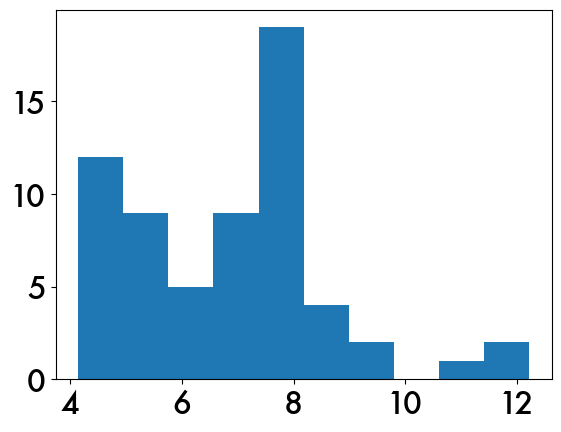

In [49]:
sgfloat = floatDF[floatDF.wmoid==5906030]
list=[]
for prof in sg.list_profile_DFs(sgfloat):
    list.append(prof.pressure.min())
plt.hist(list)

In [103]:
sgfloat

,N_PROF,N_LEVELS,wmoid,profid,yearday,lat,lon,pressure,CT,SA,...,juld_qc,position_qc,pressure_qc,temperature_qc,salinity_qc,oxygen_qc,nitrate_qc,buoyancy,AOU,o2sat
27318,0,4,5906030,5906030000,120.374294,-51.355,30.208,10.990001,3.641234,34.000570,...,1,1,1,8,8,1,1,-3.478176e-07,-6.542866,320.354076
27319,0,8,5906030,5906030000,120.374294,-51.355,30.208,17.040000,3.642714,34.001173,...,1,1,1,8,8,1,1,-3.478176e-07,-6.187954,320.340916
27320,0,10,5906030,5906030000,120.374294,-51.355,30.208,19.560000,3.643680,34.001146,...,1,1,1,8,8,1,1,-3.331466e-07,-6.092379,320.333403
27321,0,13,5906030,5906030000,120.374294,-51.355,30.208,23.930000,3.643639,34.001095,...,1,1,1,8,8,1,1,-2.824271e-07,-6.099598,320.333751
27322,0,17,5906030,5906030000,120.374294,-51.355,30.208,28.880001,3.646084,34.001056,...,1,1,1,8,8,1,1,-4.032751e-07,-6.108191,320.314691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31369,70,428,5906030,5906030070,764.174549,-57.892,68.516,752.060000,2.219941,34.852065,...,1,1,1,8,8,1,1,2.553776e-06,153.238285,329.585041
31370,70,454,5906030,5906030070,764.174549,-57.892,68.516,801.440000,2.178574,34.863873,...,1,1,1,8,8,1,1,2.226008e-06,151.286315,329.895293
31371,70,480,5906030,5906030070,764.174549,-57.892,68.516,852.060000,2.117296,34.867580,...,1,1,1,8,8,1,1,2.200855e-06,151.037212,330.391353
31372,70,506,5906030,5906030070,764.174549,-57.892,68.516,902.050000,2.091844,34.881374,...,1,1,1,8,8,1,1,2.568593e-06,148.054538,330.566227


In [102]:
dav_float, blank = dfproc.make_diveav(sgfloat, thresh=0.025, mld_lim=[5,15])
dav_float = dav_float[dav_float.yearday<210]
dav_float

number of profiles with no 10m data:  0
approx # of obs within profile that were averaged for final mlp:  2.857142857142857
number of nan mlds even where 10m exists:  9


,profid,yearday,lat,lon,mld
0,5906030000,120.374294,-51.355,30.208,111.146667
1,5906030001,125.159699,-51.074,32.828,90.886666
2,5906030003,135.173252,-52.452,31.764,86.583330
3,5906030004,140.063449,-51.856,33.445,70.994286
4,5906030005,145.180833,-51.417,34.669,76.725000
5,5906030006,150.053704,-51.576,35.332,101.159996
6,5906030007,155.181458,-52.204,35.413,111.853338
7,5906030008,160.070995,-52.743,34.407,121.350000
8,5906030009,165.173206,-53.360,35.171,162.020000
9,5906030010,170.072199,-53.617,36.474,151.613333


In [65]:
sgfloat = sgfloat[sgfloat.yearday<210]
sgfloat.to_csv('../working-vars/go-bgc/nodrop_DF_sgfloat.csv')
print('saved SOGOS float DF without nans dropped yet, for MLDF calc')


saved SOGOS float DF without nans dropped yet, for MLDF calc


In [75]:
importlib.reload(dfproc)

<module 'sgmod_DFproc' from '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/scripts/sgmod_DFproc.py'>

In [182]:
# sgfloat=pd.read_csv('../working-vars/go-bgc/nodrop_DF_sgfloat.csv')

In [78]:
dav_float, nomld_float = dfproc.make_diveav(sgfloat, thresh=0.025, mld_lim=[5,15])

# dav_float.to_csv('../working-vars/go-bgc/dav_sgfloat.csv')
print('\nsaved SOGOS float dive averaged DF')

number of profiles with no 10m data:  0
approx # of obs within profile that were averaged for final mlp:  3.5625
number of nan mlds even where 10m exists:  0

saved SOGOS float dive averaged DF


In [67]:
dav_float.iloc[7]

profid     5.906030e+09
yearday    1.600710e+02
lat       -5.274300e+01
lon        3.440700e+01
mld        1.213500e+02
Name: 7, dtype: float64

In [68]:
# Set up WMO color palette

wmo_colors = dict.fromkeys(wmoids)

# palette = sns.color_palette('Dark2', len(wmoids))
# for k, wmo in enumerate(wmoids):
#     wmo_colors[wmo] = palette[k]

wmo_colors[5904469]=sns.color_palette("RdPu")[4]
wmo_colors[5904659]=sns.color_palette("Purples")[4]
wmo_colors[5905368]=sns.color_palette("Paired")[1]
wmo_colors[5905996]=sns.color_palette("YlGn")[5]
wmo_colors[5906030]='k' # sns.color_palette("Reds")[3]  # SOGOS 
wmo_colors[5906031]=sns.color_palette("Oranges")[3]
wmo_colors[5906207]=sns.color_palette("Reds")[4]
wmo_colors[5906007]= sns.color_palette("YlOrRd")[3]

In [363]:
!pip install basemap-data
!pip install basemap-data-hires
!pip install basemap
from mpl_toolkits.basemap import Basemap

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


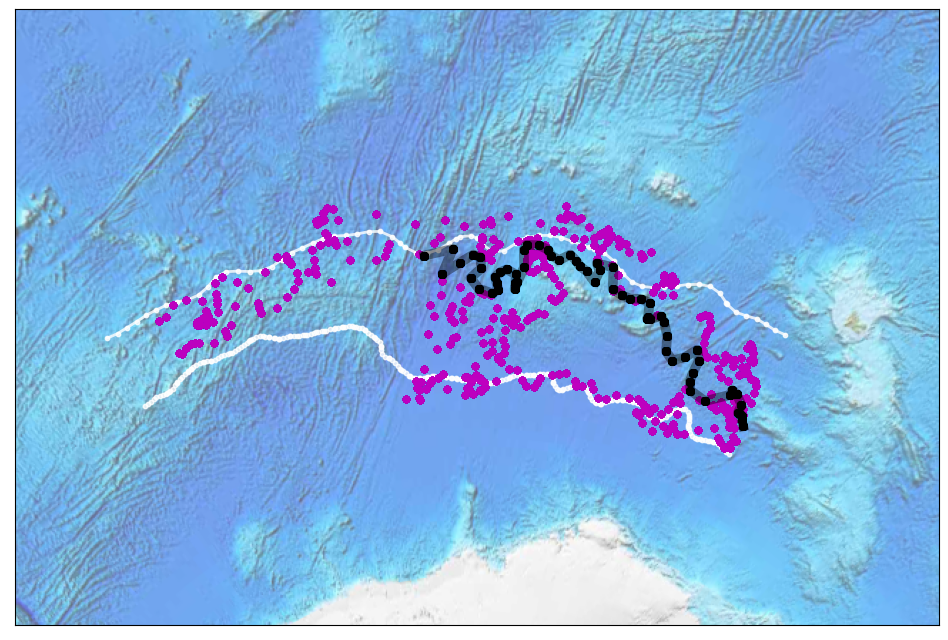

In [107]:
from mpl_toolkits.basemap import Basemap
fig = plt.figure(figsize=(14,8))
m = Basemap(width=6000000,height=4000000,projection='lcc',
            resolution='c',lat_1=-65.,lat_0=-55, lon_1 = 70, lon_0=35.)

# fig = plt.figure(figsize=(14, 7), edgecolor='w')
# m = Basemap(projection='cyl', resolution=None,
#             llcrnrlat=-65, urcrnrlat=-40,
#             llcrnrlon=0, urcrnrlon=70)

m.etopo(scale=0.8, alpha=0.6)

for wmo in wmoids[wmoids!=5906030]:
    wmodat = floatDF[floatDF.wmoid==wmo]
    lon = wmodat.lon.values
    lat = wmodat.lat.values

    xpt, ypt=m(lon,lat)
    # m.plot(xpt, ypt, color = 'w', linewidth=5, alpha=0.2, label=str(wmo)[3:], zorder=3) # wmo_colors[wmo]
    m.scatter(xpt, ypt , color = 'm', alpha=0.3, s=20, zorder=3)

for front in [SIF]:
     front = front[(front.lon > 0 ) & (front.lon <65)]
     lon = front.lon.values
     lat = front.lat.values
     xpt, ypt = m(lon, lat)
     m.scatter(xpt, ypt, color='w', alpha=0.8, s=10, zorder=2)
#      ax.plot(front.lon, front.lat, color='k', alpha=0.1, linewidth=2, zorder=3)

for front in [PF]:
     front = front[(front.lon > 0 ) & (front.lon <65)]
     lon = front.lon.values
     lat = front.lat.values
     xpt, ypt = m(lon, lat)
     m.scatter(xpt, ypt, color='w', alpha=0.8, s=10, zorder=2)
     m.plot(xpt, ypt, color='w', alpha=0.8, linewidth=2, zorder=2)

sgfloat = floatDF[floatDF.wmoid==5906030]
lon = sgfloat.lon.values
lat = sgfloat.lat.values
xpt, ypt=m(lon,lat)

m.plot(xpt, ypt, color = 'k', alpha=0.4, linewidth=7, label=str(5906030)[3:], zorder=3)
m.scatter(xpt, ypt , color = 'k', alpha=0.1, s=30, zorder=3)


plt.show()

NameError: name 'SIF' is not defined

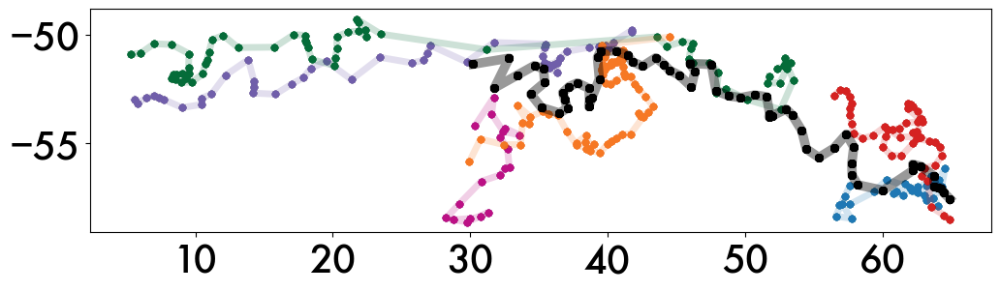

In [69]:
# Reference: Full matchup map for floats

save = False

# fig = plt.figure(figsize=(14,8))
fig = plt.figure(figsize=(12,3))
ax=plt.gca()

for wmo in wmoids[wmoids!=5906030]:
    ax.plot(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.2, linewidth=5, label=str(wmo)[3:], zorder=3)
    ax.scatter(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.1, s=20, zorder=3)

for wmo in [5906030]:
    ax.plot(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.4, linewidth=7, label=str(wmo)[3:], zorder=3)
    ax.scatter(floatDF[floatDF.wmoid==wmo].lon,floatDF[floatDF.wmoid==wmo].lat,
            color = wmo_colors[wmo], alpha=0.1, s=30, zorder=3)

for front in [SIF, PF]:
     front = front[(front.lon > 0 ) & (front.lon <65)]
     ax.scatter(front.lon, front.lat, color='k', alpha=0.2, s=4, zorder=3)
#      ax.plot(front.lon, front.lat, color='k', alpha=0.1, linewidth=2, zorder=3)

# plt.title('BGC-Argo Training Data')
# plt.title('Argo Yeardays: ' + str(start_yd) + ' to ' + str(end_yd))
rect = patch.Rectangle((30,-54),10,4, fill=True, color="orange", alpha=0.3,linewidth=2, zorder=1)

# ax.legend()
ax.add_patch(rect)
# ax.set_xlim(5,81)
# ax.set_ylim(-60,-30)
# ax.set_aspect('equal')

ax.yaxis.set_major_formatter("{x:1.0f}°S")
ax.xaxis.set_major_formatter("{x:1.0f}°E")

ax.grid(linestyle='dashed', alpha=0.6, zorder=1)

lines = ax.get_lines()
labelLines(lines, align=False, fontsize=18, zorder=3)
# labelLines(lins) # , align=False, fontsize=18)
plt.plot(shipDF.lon, shipDF.lat, alpha=0.8, linestyle='dashed', c='k', linewidth=5)

if save:
        plt.savefig('../figures/Argo_simple_region_map.png', dpi=300)

In [ ]:
# fig = plt.figure(figsize=(14,8))
# m = Basemap(width=6000000,height=4000000,projection='lcc',
#             resolution='c',lat_1=-61.,lat_2=-45,lat_0=-52,lon_0=30.)

fig = plt.figure(figsize=(14, 7), edgecolor='w')
m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-65, urcrnrlat=-40,
            llcrnrlon=0, urcrnrlon=70)


m.etopo(scale=0.8, alpha=0.5)

for wmo in wmoids[wmoids!=5906030]:
    wmodat = floatDF[floatDF.wmoid==wmo]
    lon = wmodat.lon.values
    lat = wmodat.lat.values

    xpt, ypt=m(lon,lat)
    m.plot(xpt, ypt, color = wmo_colors[wmo], linewidth=5, alpha=0.2, label=str(wmo)[3:], zorder=3)
    m.scatter(xpt, ypt , color = wmo_colors[wmo], alpha=0.1, s=20, zorder=3)

sgfloat = floatDF[floatDF.wmoid==5906030]
lon = sgfloat.lon.values
lat = sgfloat.lat.values
xpt, ypt=m(lon,lat)

m.plot(xpt, ypt, color = 'k', alpha=0.4, linewidth=7, label=str(5906030)[3:], zorder=3)
m.scatter(xpt, ypt , color = 'k', alpha=0.1, s=30, zorder=3)


plt.show()

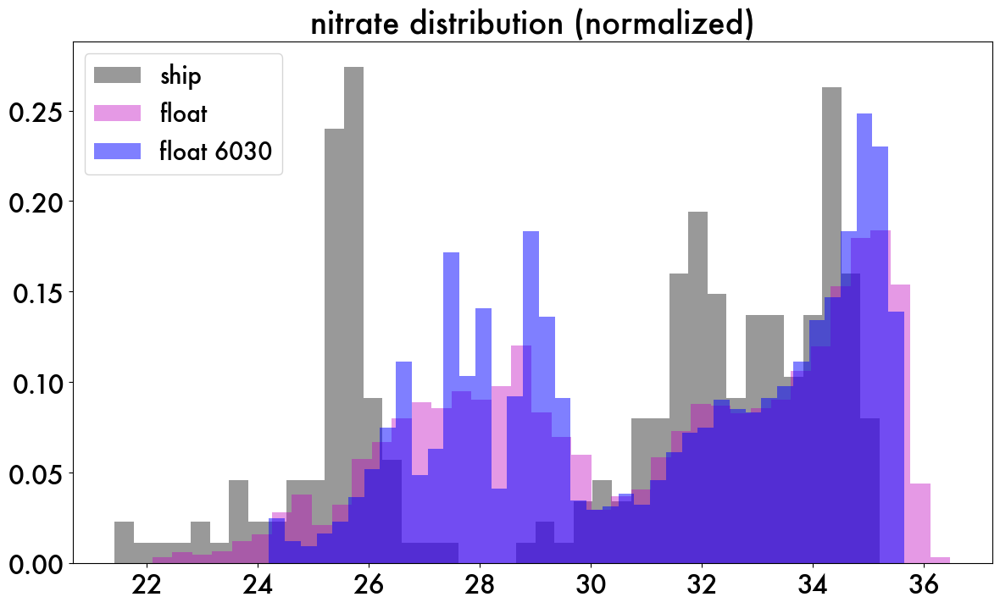

In [659]:
# Compare distributions 

threshold = 1000

dship = shipDF[shipDF.pressure<threshold]
dfloat = floatDF[floatDF.pressure<threshold]
# dfloat = floatDF[(floatDF.wmoid == 5906030) & (floatDF.pressure<threshold)]

# dglider = df_660[df_660.pressure<threshold]
# dglider_659 = df_659[df_659.pressure<threshold]

fig = plt.figure(figsize=(14,8))
plt.hist(dship.nitrate, bins=40, color='k', alpha=0.4, label="ship", density=True)
plt.hist(dfloat.nitrate, bins=40, color='m', alpha=0.4, label="float", density=True)


# plt.hist(dfloat[dfloat.wmoid == 5905996].nitrate, bins=40, color='orange', alpha=0.5, label="float 5596", density=True)
# plt.hist(floatDF[~floatDF.wmoid.isin([5906007])].nitrate, bins=40, color='c', alpha=0.5, label="all but", density=True)
plt.hist(dfloat[dfloat.wmoid == 5906030].nitrate, bins=40, color='b', alpha=0.5, label="float 6030", density=True)

plt.title('nitrate distribution (normalized)')

# plt.hist(dglider.nitrate, bins=40, color='c', alpha=0.7, label="sg660", density=True)
# plt.hist(dglider_659.nitrate, bins=40, color='yellow', alpha=0.4, label="sg659", density=True)
# plt.hist(shipDF.nitrate, bins=40, color='k', alpha=0.4, label="ship")

# plt.hist(df_660.nitrate[200:70000:40], bins=40, color='k', alpha=0.9, label="glider (subset)")

plt.legend()

Text(0.5, 0, 'Yearday (0 = Jan 1 2019)')

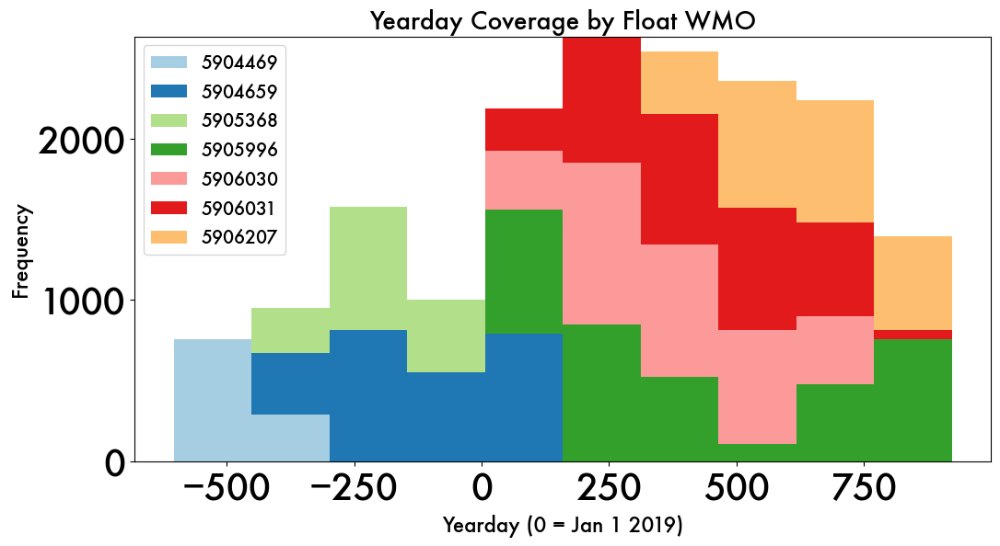

In [70]:
# argo_qc.pivot(columns='wmoid').yearday.plot(kind = 'hist', stacked=True)
pal = sns.color_palette("Paired")
sns.set_palette(pal)

fig = plt.figure(figsize=(12,6))
ax = plt.gca()
pd.DataFrame({k: v for k, v in floatDF.groupby('wmoid').yearday}).plot.hist(stacked=True, ax=ax) 
ax.legend(loc='upper left', fontsize=14)
ax.set_title('Yearday Coverage by Float WMO')
ax.set_xlabel('Yearday (0 = Jan 1 2019)')

# PART 1: Prepare ship and float training data.

In [114]:
vertag = 'final24'

In [115]:
dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/RF-training/'

floatDF = pd.read_csv(dir + 'mldata_floatDF_split2023.csv')
shipDF = pd.read_csv(dir + 'mldata_shipDF_split2023.csv')
wmoids = pd.unique(floatDF.wmoid)


# mltraining = pd.read_csv(dir + 'mldata_training_split2023.csv')
# mlvalidation = pd.read_csv(dir + 'mldata_validation_split2023.csv')
# mltest = pd.read_csv(dir + 'mldata_testing_split2023.csv')

## 1.0 Set up dataframes with training variables

In [22]:
# OUTDATED: Before fixing seasonal variable
# # def add_month_sines(DF):
#     mn_list = [sg.get_month_number(x) for x in DF.yearday.values]
#     DF = DF.copy()
#     DF['month'] = mn_list
#     DF['mnsin'] = np.sin(2*np.pi*np.array(mn_list)/12)
#     DF['mncos'] = np.cos(2*np.pi*np.array(mn_list)/12)
#     return DF

# floatDF = add_month_sines(floatDF)
# shipDF = add_month_sines(shipDF)

In [116]:
def add_yd_sinusoids(DF):
    DF['ydcos'] = [sg.get_ydsines(x)[0] for x in DF.yearday.values]
    DF['ydsin'] = [sg.get_ydsines(x)[1] for x in DF.yearday.values]

    return DF

floatDF = add_yd_sinusoids(floatDF)
shipDF = add_yd_sinusoids(shipDF)

Drop pressure values below 1000m to match that of gliders

In [118]:
floatDF = floatDF[floatDF["pressure"] < 1001]
shipDF = shipDF[shipDF["pressure"] < 1001]

# floatDF['log_buoyancy'] = np.log(floatDF['buoyancy'])
# shipDF['log_buoyancy'] = np.log(shipDF['buoyancy'])

floatDF= dfproc.add_dist2maxb(floatDF)
shipDF= dfproc.add_dist2maxb(shipDF)

floatDF = add_month_sines(floatDF)
shipDF = add_month_sines(shipDF)

In [119]:
# Add last variables and set up final training data
tvars = ['yearday','lat','lon','pressure','CT', 'SA','oxygen', 'sigma0', 'log_buoyancy', 
         'spice','o2sat', 'ydcos', 'ydsin'] # , 'AOU', 'dist_maxb'] 
pvars = ['nitrate']  # predict variable

# Take variables of interest
floatDF = floatDF[tvars + pvars + ['wmoid', 'profid', 'dist_maxb']].dropna()
shipDF = shipDF[tvars + pvars + ['profid', 'dist_maxb']].dropna() # dont drop on wmoid yet

print('# Ship observations (without NaNs): \t', shipDF.shape[0])
print('# Float observations (without NaNs ): \t', floatDF.shape[0])
print('# 5906030 observations (without NaNs): \t', floatDF[floatDF.wmoid==5906030].shape[0])
print()

# Ship observations (without NaNs): 	 242
# Float observations (without NaNs ): 	 17644
# 5906030 observations (without NaNs): 	 3308



## 1.1 Preliminary check of variable correlations and distributions. 

- Use all float and ship observations here. More detailed data sampling is used before model training

Text(0.5, 1.0, 'Correlation Heatmap')

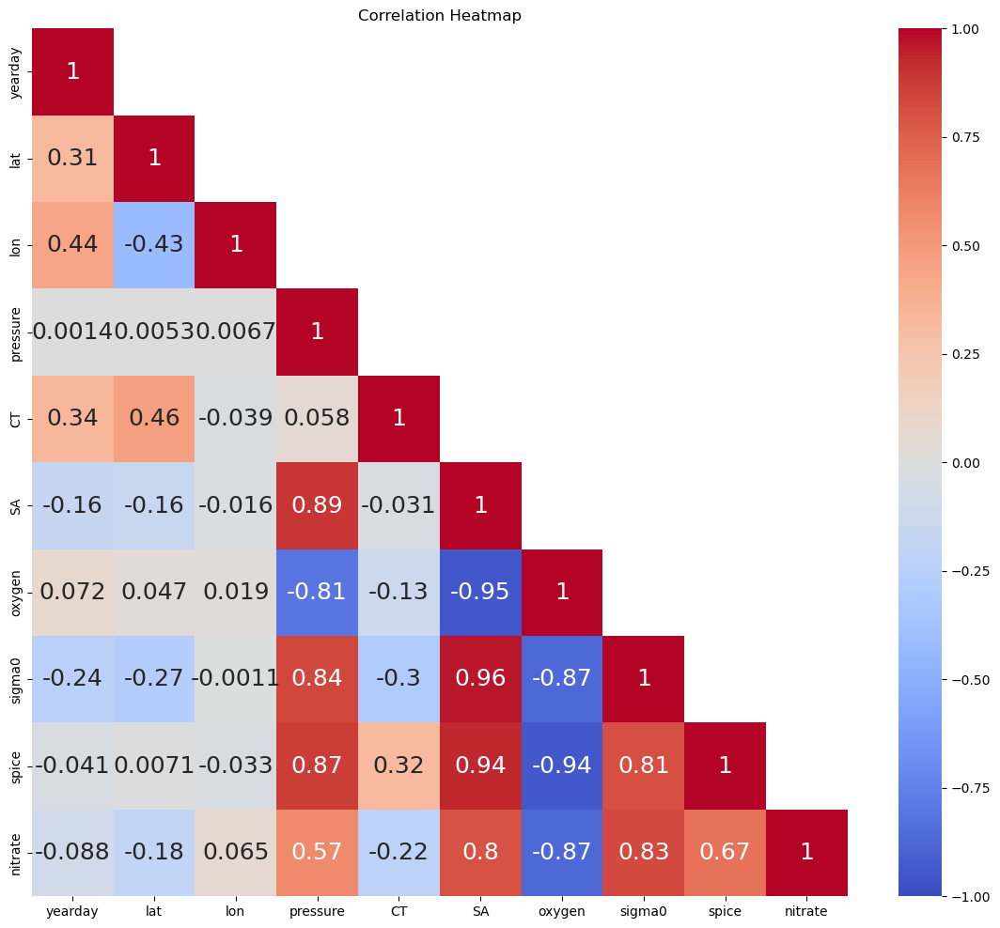

In [116]:
dfcorr = floatDF.drop({'log_buoyancy', 'wmoid', 'mncos', 'mnsin', 'profid', 'month', 'dist_maxb', 'o2sat'},axis=1).corr()
# plot a heatmap with annotation

plt.figure(figsize=(14,12))
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(dfcorr, dtype=bool),k=1)
hm = sns.heatmap(dfcorr, mask=mask, annot=True, cmap='coolwarm', annot_kws={"size": 18}, center=0, vmin=-1, vmax=1)
plt.title('Correlation Heatmap')

In [119]:
float6030 = floatDF[floatDF.wmoid==5906030]
others = floatDF[floatDF.wmoid!=5906030]

In [84]:
dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/nitrate-prediction/'
df_659 = pd.read_csv(dir + 'RFpred_659_modG_dec2023.csv')
df_660 = pd.read_csv(dir + 'RFpred_660_modG_dec2023.csv')


In [86]:
df_659

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,o2sat,mncos,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate_G
0,2,119.583376,-51.4952,30.0472,6.053,3.580758,33.991030,329.153605,26.903886,-12.661607,...,320.849539,-0.500000,0.866025,4,6590000,NaN,0.000498,0.000221,0.4514,24.247593
1,3,119.583405,-51.4952,30.0472,7.062,3.581758,33.992030,329.761488,26.904582,-12.765639,...,320.839220,-0.500000,0.866025,4,6590000,NaN,0.000492,0.000220,0.4636,24.262415
2,7,119.583521,-51.4952,30.0473,11.097,3.582758,33.992030,330.174395,26.904486,-12.483247,...,320.831313,-0.500000,0.866025,4,6590000,NaN,0.000492,0.000223,0.4636,24.261172
3,8,119.583550,-51.4952,30.0473,12.106,3.582758,33.993034,330.180972,26.905281,-13.902866,...,320.828796,-0.500000,0.866025,4,6590000,NaN,0.000469,0.000243,0.4514,24.266591
4,10,119.583666,-51.4951,30.0475,14.123,3.573758,33.992030,330.380022,26.905347,-10.944908,...,320.901524,-0.500000,0.866025,4,6590000,NaN,0.000489,0.000234,0.5063,24.272033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
653303,862034,205.974042,-51.7062,38.9821,957.539,2.163758,34.875034,180.973612,27.730886,-12.060429,...,329.988004,-0.866025,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.198749
653304,862035,205.973926,-51.7062,38.9821,958.553,2.162758,34.876034,181.023786,27.731762,-12.368915,...,329.993675,-0.866025,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.154794
653305,862036,205.973810,-51.7062,38.9821,959.566,2.162758,34.876034,181.070580,27.731762,-12.368983,...,329.993678,-0.866025,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.153545
653306,862037,205.973694,-51.7062,38.9821,960.580,2.161758,34.877033,181.114731,27.732639,-12.368983,...,329.999349,-0.866025,-0.500000,7,6590911,NaN,NaN,NaN,NaN,32.143275


In [87]:
df_659 = df_659.rename(columns={'nitrate_G':'nitrate'})
df_660 = df_660.rename(columns={'nitrate_G':'nitrate'})

In [90]:
plt.style.use('default')

(array([5.8117e+04, 9.2550e+04, 6.2389e+04, 4.4560e+04, 3.4193e+04,
        2.7037e+04, 1.9114e+04, 1.3001e+04, 9.7030e+03, 8.4220e+03,
        8.1950e+03, 7.5500e+03, 7.2450e+03, 7.0660e+03, 6.4350e+03,
        6.1640e+03, 5.8800e+03, 5.4520e+03, 5.6210e+03, 5.5150e+03,
        5.2390e+03, 5.1190e+03, 5.0740e+03, 4.8280e+03, 4.6230e+03,
        4.4710e+03, 4.1280e+03, 3.9880e+03, 3.8760e+03, 3.7470e+03,
        3.5900e+03, 3.5990e+03, 3.4320e+03, 3.4260e+03, 3.2640e+03,
        3.2500e+03, 3.2800e+03, 3.2880e+03, 3.1400e+03, 2.9050e+03,
        2.8340e+03, 2.7630e+03, 2.6910e+03, 2.5580e+03, 2.6330e+03,
        2.5810e+03, 2.4910e+03, 2.4680e+03, 2.3770e+03, 2.3170e+03,
        2.0960e+03, 2.1130e+03, 2.1210e+03, 2.0930e+03, 1.9960e+03,
        1.9560e+03, 1.9030e+03, 1.8610e+03, 1.8220e+03, 1.8730e+03,
        1.8290e+03, 1.7820e+03, 1.8180e+03, 1.9840e+03, 2.0100e+03,
        2.1430e+03, 2.5140e+03, 3.2980e+03, 5.4760e+03, 1.3566e+04,
        2.1199e+04, 2.3692e+04, 1.3176e+04, 4.52

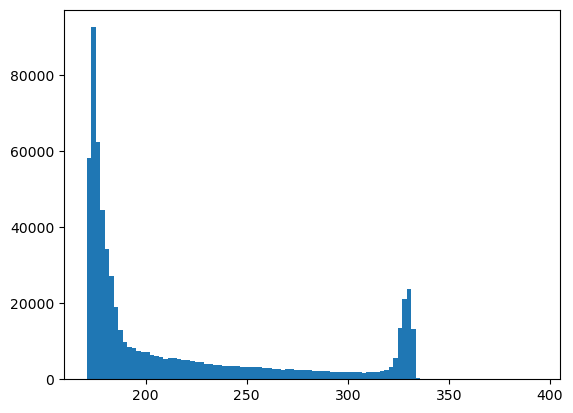

In [125]:
plt.hist(df_659.oxygen, bins=100)

In [129]:
df_659[df_659.oxygen>360]

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,o2sat,mncos,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate
16265,21800,122.297080,-51.0906,31.9448,4.035,3.595758,33.961033,361.612372,26.878697,-10.874265,...,320.806578,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.366000,24.381584
16266,21801,122.297138,-51.0906,31.9449,5.044,3.595758,33.967033,364.354389,26.883448,-10.874265,...,320.791623,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.366000,24.406797
16267,21802,122.297167,-51.0906,31.9449,6.053,3.595758,33.968033,365.724051,26.884239,-11.428905,...,320.789107,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.366000,24.406846
16268,21803,122.297196,-51.0906,31.9449,7.061,3.596758,33.970030,366.788961,26.885726,-11.428913,...,320.776302,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.382267,24.405901
16269,21804,122.297254,-51.0907,31.9450,8.070,3.596758,33.971030,364.163923,26.886518,-11.387268,...,320.773787,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.398533,24.407246
16270,21805,122.297282,-51.0907,31.9450,9.079,3.596758,33.973034,362.058826,26.888103,-11.387274,...,320.768776,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.414800,24.419185
16271,21806,122.297311,-51.0907,31.9450,10.088,3.596758,33.974033,362.621128,26.888895,-11.429012,...,320.766260,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.390400,24.409138
16272,21807,122.297369,-51.0907,31.9450,11.096,3.597758,33.976032,364.496825,26.890382,-11.387744,...,320.753459,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.366000,24.396757
16273,21808,122.297427,-51.0907,31.9450,12.105,3.596758,33.977030,362.978055,26.891269,-11.070051,...,320.758748,-0.866025,0.5,5,6590030,NaN,NaN,NaN,0.390400,24.391346
17800,23772,122.520622,-51.0917,32.0492,4.035,3.638758,33.982033,362.510956,26.891193,-11.079260,...,320.419118,-0.866025,0.5,5,6590032,NaN,0.001617,0.001620,0.427000,24.380495


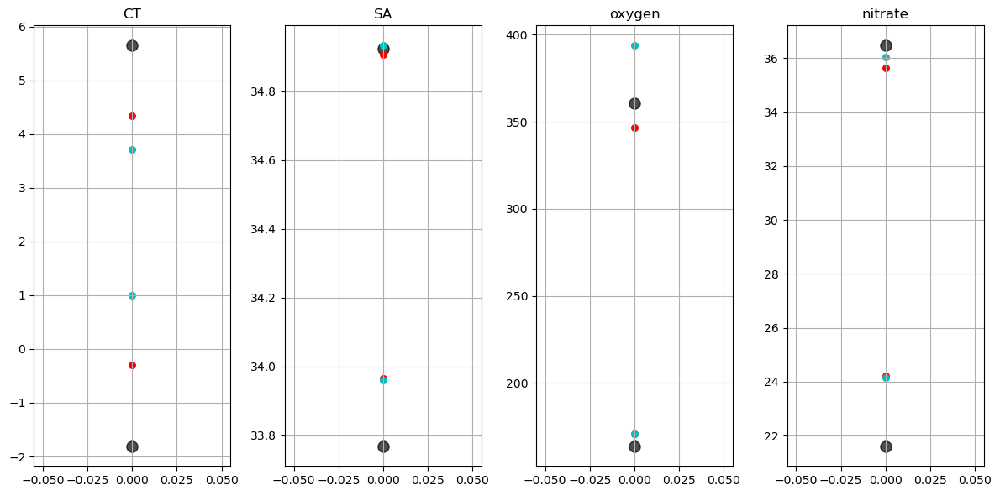

In [127]:
fig, axs = plt.subplots(1,4, figsize=(12,6), layout='tight')   
axs = axs.flatten()

for i, var in enumerate(['CT' , 'SA', 'oxygen', 'nitrate']):
    minval = others[var].min()
    maxval = others[var].max()
    axs[i].scatter([0,0], [minval, maxval], c='k', alpha=0.7, s=90, label='others')
    axs[i].scatter([0,0], [float6030[var].min(), float6030[var].max()], c='r', s=30, label='sogos')

    axs[i].scatter([0,0], [df_659[var].min(), df_659[var].max()], c='c', s=30, label='sg660')
    axs[i].set_title(var)
    axs[i].grid()


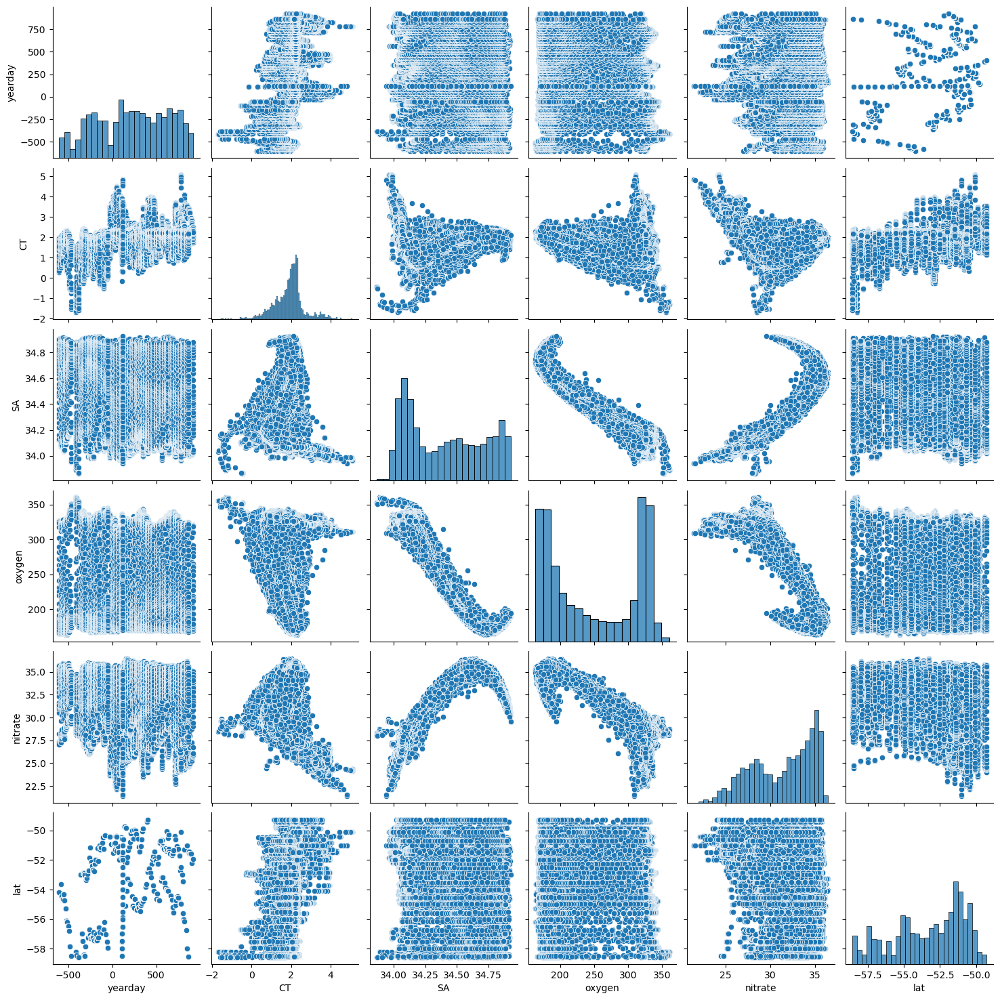

In [122]:
# Pair Wise Plots
PWDF = training[['yearday','CT','SA','oxygen','nitrate', 'lat']]
sns.pairplot(PWDF)
# plt.savefig("PairPlot.png")
plt.show()

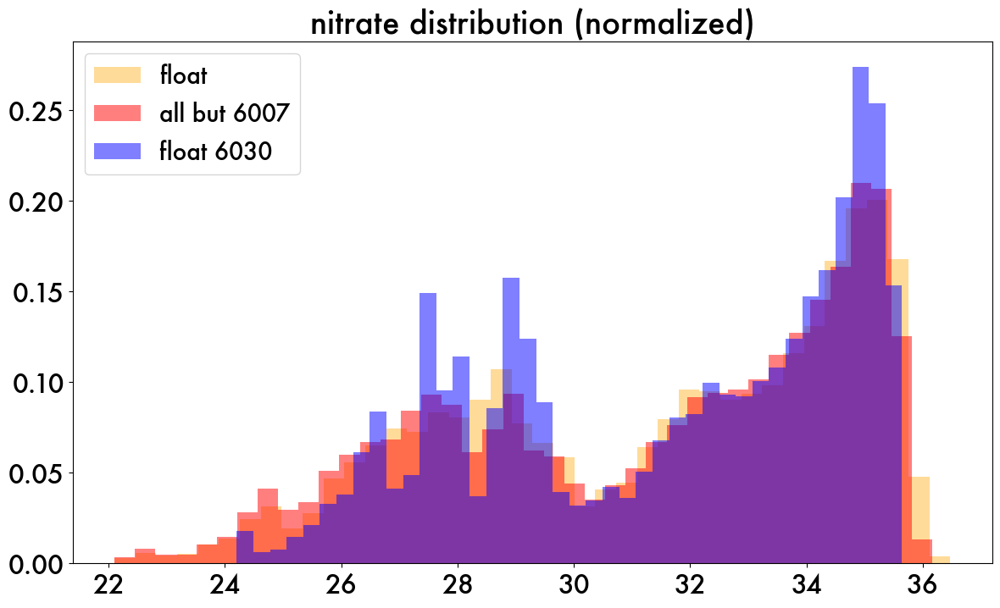

In [662]:
# Compare distributions 

threshold = 1000

dship = shipDF[shipDF.pressure<threshold]
dfloat = floatDF[floatDF.pressure<threshold]
# dfloat = floatDF[(floatDF.wmoid == 5906030) & (floatDF.pressure<threshold)]

# dglider = df_660[df_660.pressure<threshold]
# dglider_659 = df_659[df_659.pressure<threshold]

fig = plt.figure(figsize=(14,8))
# plt.hist(dship.nitrate, bins=40, color='k', alpha=0.4, label="ship", density=True)
plt.hist(dfloat.nitrate, bins=40, color='orange', alpha=0.4, label="float", density=True)


# plt.hist(dfloat[dfloat.wmoid == 5905996].nitrate, bins=40, color='c', alpha=0.5, label="float 5596", density=True)
plt.hist(dfloat[~dfloat.wmoid.isin([5906031, 5906007])].nitrate, bins=40, color='r', alpha=0.5, label="all but 6007", density=True)
plt.hist(dfloat[dfloat.wmoid == 5906030].nitrate, bins=40, color='b', alpha=0.5, label="float 6030", density=True)

plt.title('nitrate distribution (normalized)')

# plt.hist(dglider.nitrate, bins=40, color='c', alpha=0.7, label="sg660", density=True)
# plt.hist(dglider_659.nitrate, bins=40, color='yellow', alpha=0.4, label="sg659", density=True)
# plt.hist(shipDF.nitrate, bins=40, color='k', alpha=0.4, label="ship")

# plt.hist(df_660.nitrate[200:70000:40], bins=40, color='k', alpha=0.9, label="glider (subset)")

plt.legend()

# PART 2: Split data and scale.

## 2.0 Methods

In [30]:
def split_ship(shipDF, test_split = False):
    """ 
    Split ship data into training and validation sets
    Stations are kept together (by index). 
    @param test_split: whether to split the 20% remaining into 10% test and 10% validation
    """
    ind = shipDF.index.values
    np.random.seed(42)
    
    training_ind = np.random.choice(ind, int(np.floor(0.8*len(ind))), replace=False)
    training_data = shipDF[shipDF.index.isin(training_ind)]

    if test_split == False:
        validation_ind = [x for x in ind if x not in training_ind]
        validation_data = shipDF[shipDF.index.isin(validation_ind)]
        test_data = [] # will become sogos float
    else:
        ind_vt = [x for x in ind if x not in training_ind]
        validation_ind = np.random.choice(ind_vt, int(np.floor(0.5*len(ind_vt))), replace=False)
        validation_data = shipDF[shipDF.index.isin(validation_ind)]
        
        test_ind = [x for x in ind_vt if x not in validation_ind]
        test_data = shipDF[shipDF.index.isin(test_ind)]
    
    return training_data, validation_data, test_data

In [31]:
def split_profiles(floatDF, test_split = False):
    """ 
    @param floatDF: scaled dataframe with all float profiles
    @return: 
        training_data: training data (80% of profiles) with ship added
        validation_data: validation data (20% of profiles)
    
    This method treats a float profile like the smallest discrete "unit" upon which to train and validate the model.
    Our goal is to predict a water column (profile) rather than a discrete observation, so profiles are kept together while splitting.
    Note that test data will be all profiles from the SOGOS float when test_split is set as False by default.

    """

    # Create list of unique profile ID's and select random 80% for training
    profs = pd.unique(floatDF.profid)
    if 5906030 in profs:
        print('Warning: SOGOS float is in training data.')

    np.random.seed(42) 
    training_profid = np.random.choice(profs, int(np.floor(0.8*len(profs))), replace=False)
    training_data = floatDF[floatDF['profid'].isin(training_profid)]

    if test_split == False:
        # Take remaining profiles that were not in training set, for validation
        validation_profid = [x for x in profs if x not in training_profid]
        validation_data = floatDF[floatDF['profid'].isin(validation_profid)]
        test_data = [] # will become SOGOS data

    else:
        # Take HALF of remaining profiles that were not in training set, for validation (10% of total)
        profs_vt = [x for x in profs if x not in training_profid]  # remaining profiles after training data removed
        validation_profid= np.random.choice(profs_vt, int(np.floor(0.5*len(profs_vt))), replace=False)
        validation_data = floatDF[floatDF['profid'].isin(validation_profid)]

        test_profid = [x for x in profs_vt if x not in  validation_profid]
        test_data = floatDF[floatDF['profid'].isin(test_profid)]

    return training_data, validation_data, test_data


## 2.1 Split data into training, validation, and test sets

In [120]:
description = 'RF final fronts, leaf split, with ydsines instead of month'
desc = 'RF_ydsines'

In [122]:
# 2.1.1 **Preferred** To split remaining float data (all but #5906030) into only training and validation,
# Using SOGOS float # 5906030 as test data

[training_float, validation_float, empty] = split_profiles(floatDF[floatDF.wmoid!=5906030], test_split = False)
[training_ship, validation_ship, empty] = split_ship(shipDF, test_split = False)

training = pd.concat([training_float, training_ship], ignore_index=True)
validation = pd.concat([validation_float, validation_ship], ignore_index=True)
test = floatDF[floatDF.wmoid==5906030] # set SOGOS 

# To retrive just ship data, select wmoids Nan
# training[training['wmoid'].isna()]

print(description)
print('wmoids: ' + str(wmoids))
print('# training observations: \t' + str(len(training)))
print('# validation observations: \t' + str(len(validation)))
print('# test observations: \t\t' + str(len(test)))

RF final fronts, leaf split, with ydsines instead of month
wmoids: [5904469 5904659 5905368 5905996 5906030 5906031 5906207]
# training observations: 	11645
# validation observations: 	2933
# test observations: 		3308


Comment on notation: 

We use `training` for unscaled and `training_scaled` for scaled observations.

In [125]:
desc='fin24'

In [126]:
# Save the three datasets
file_path = '../working-vars/RF-training/'

# training.to_csv(file_path + 'mldata_training_' + desc + '.csv') 
# validation.to_csv(file_path + 'mldata_validation_' + desc + '.csv')
# test.to_csv(file_path + 'mldata_testing_' + desc + '.csv')

In [127]:
# floatDF.to_csv(file_path + 'mldata_floatDF_' + desc + '.csv')
# shipDF.to_csv(file_path + 'mldata_shipDF_' + desc + '.csv')

### Any additions:

In [37]:
# Outdated: add nitrate gradient 
def add_nitrate_grad(predDF, test_pred= True):
    """
    Specifically for getting nitrate gradient of the test prediction from each model. 
    Calculate nitrate gradient dNO3/dZ using derivative of Pchip interpolator 
    @param      predDF: dataframe with argo profiles 
    @return     list of dataframes, each dataframe is a profile with a dN/dZ column added    
    """
    new_DF = pd.DataFrame()

    # profids = pd.unique(predDF.profid) # list of profile ids
    # profile_DFs = []
    # for i in range(len(profids)):
    #     profile_DFs.append(predDF[predDF['profid'] == profids[i]].copy())

    profile_DFs = sg.list_profile_DFs(predDF)

    if test_pred:
        tag = 'test_prediction'
    else:
        tag = 'nitrate'

    for profile in profile_DFs:

        if np.isnan(profile[tag]).all():
            nans = np.empty(len(profile['pressure'])); nans[:] = np.NaN
            profile.loc[:, 'grad_nitrate'] = nans
        else:
            f = scipy.interpolate.PchipInterpolator(x=profile.pressure.values, y=profile[tag].values, extrapolate = False)
            devf = f.derivative()
            grad_nitrate = devf(profile["pressure"].values)
            # 
            
            profile.loc[:, 'grad_nitrate'] = grad_nitrate
        
        # Take vert N2 and find the maximum in the profile. 
        
        new_DF = pd.concat([new_DF, profile])

    return new_DF

## Scaling 

In [38]:
def scale_features(df, training, type='StandardScaler'):
    """ Scale down glider dataset.
    @param: df: dataframe to scale
            type: type of scaler to use, 'StandardScaler' or 'MinMaxScaler'
    """

    cols_nonan = [col for col in df.columns if col not in ['profid', 'wmoid', 'AOU','dist_maxb']] # all columns to remove nans
    newdf = df.dropna(axis=0, subset=cols_nonan).copy()
    training_nonan = training.dropna(axis=0, subset=cols_nonan).copy()

    # Drop NaNs *EXCEPT* in the wmoid column, or else ship data is removed

    if type == 'StandardScaler':
        sca = preprocessing.StandardScaler().fit(training_nonan[cols_nonan])

    elif type == 'MinMaxScaler':
        sca = preprocessing.MinMaxScaler().fit(training_nonan[cols_nonan])

    df_scaled =  pd.DataFrame(sca.transform(newdf[cols_nonan]), columns=newdf[cols_nonan].columns)
    df_scaled['profid'] = newdf['profid'].values
    df_scaled['wmoid'] = newdf['wmoid'].values

    return df_scaled

In [41]:
def scale_down_tvt(training, validation, test, type='StandardScaler'):
    """ 
    Scale features using 
    @param: df: dataframe to scale
            type: type of scaler to use, 'StandardScaler' or 'MinMaxScaler'
    """
    # Don't remove NaNs in wmoid since ship will have empty field
    cols_nonan = [col for col in training.columns if col not in ['profid', 'wmoid', 'AOU','dist_maxb']] # all columns to remove nans

    training_nonan = training.dropna(axis=0, subset=cols_nonan).copy()
    validation_nonan = validation.dropna(axis=0, subset=cols_nonan).copy()
    test_nonan = test.dropna(axis=0, subset=cols_nonan).copy()

 
    # Scaler is built *USING TRAINING DATA* and applied to all
    if type == 'StandardScaler':
        sca = preprocessing.StandardScaler().fit(training_nonan[cols_nonan])

    elif type == 'MinMaxScaler':
        sca = preprocessing.MinMaxScaler().fit(training_nonan[cols_nonan])

    # Scale down all using the training scaler
    training_scaled = pd.DataFrame(sca.transform(training_nonan[cols_nonan]), columns=training_nonan[cols_nonan].columns)
    validation_scaled = pd.DataFrame(sca.transform(validation_nonan[cols_nonan]), columns=validation_nonan[cols_nonan].columns)
    test_scaled = pd.DataFrame(sca.transform(test_nonan[cols_nonan]), columns=test_nonan[cols_nonan].columns)

    # Add back profid, wmoids
    training_scaled['profid'] = training_nonan['profid'].values
    validation_scaled['profid'] = validation_nonan['profid'].values
    test_scaled['profid'] = test_nonan['profid'].values

    training_scaled['wmoid'] = training_nonan['wmoid'].values
    validation_scaled['wmoid'] = validation_nonan['wmoid'].values
    test_scaled['wmoid'] = test_nonan['wmoid'].values

    # Leave nitrate out of the scaler
    training_scaled['nitrate'] = training_nonan['nitrate'].values
    validation_scaled['nitrate'] = validation_nonan['nitrate'].values
    test_scaled['nitrate'] = test_nonan['nitrate'].values

    return training_scaled, validation_scaled, test_scaled

# def rescale_target(scaled_pred, unscaled_obs, type='Standard Scaler'):
#     "Rescale values to the original range of the data"
#     unscaled_obs =np.array(unscaled_obs).reshape(-1,1)
#     scaled_pred = np.array(scaled_pred).reshape(-1,1)

#     if type == 'StandardScaler':
#         scaler = preprocessing.StandardScaler().fit(unscaled_obs)
#     elif type == 'MinMaxScaler':
#         scaler = preprocessing.MinMaxScaler().fit(unscaled_obs)

#     temp = scaler.inverse_transform(scaled_pred)
#     rescaled = [y.item() for y in temp]
 
#     return rescaled

In [40]:
# obsolete: we scale down within the RF method, so this is for troubleshooting
#  training_scaled = scale_features(training[tvars + pvars])
# validation_scaled = scale_features(validation[tvars + pvars])
# test_scaled = scale_features(test[tvars + pvars])

TypeError: scale_features() missing 1 required positional argument: 'training'

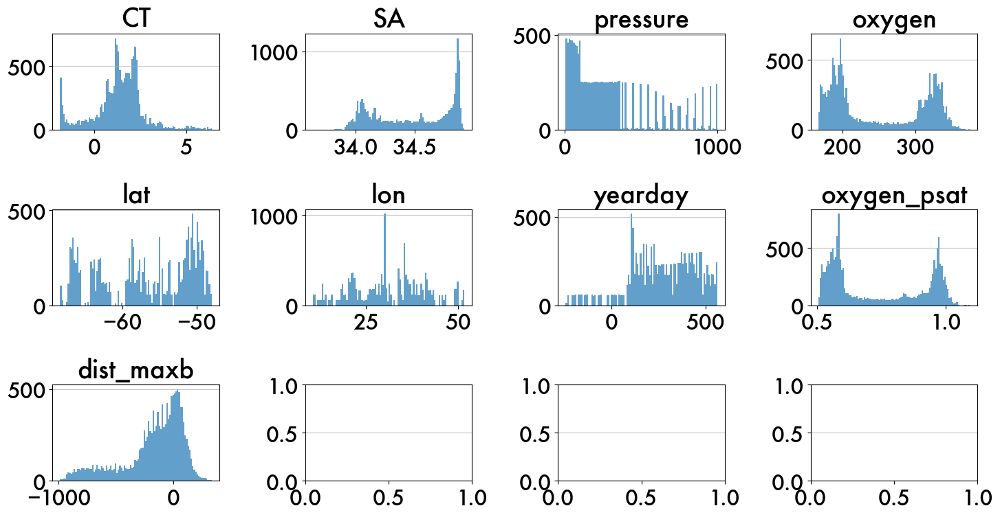

In [ ]:
# Plot distributions of each variable, unscaled.

nbins = 100
fig, axs = plt.subplots(3, 4, figsize=(15, 8), tight_layout=True)

axs = axs.flatten()
for c, var in enumerate(allvars):
    axs[c].hist(x=training[var].values, bins=nbins, alpha=0.7)
    axs[c].set_title(var)

for ax in axs:
    ax.grid(axis='y', alpha=0.75)

# PART 3: Random Forest Model Training / Feature Selection

## 3.0 Methods to prepare for RF.


## 3.1 Set up variable feature lists.

In [128]:
# 3.3.1 Initialize variables to train the different models on 

var_list = {
            'Model_A': ['spice', 'sigma0'],
            'Model_B': ['CT', 'SA', 'pressure'], 
            'Model_C': ["CT", "SA", "pressure", 'oxygen'],
            'Model_D': ["CT", "SA", "pressure", "oxygen", 'lat', 'lon', 'yearday'],
            'Model_E': ["CT", "SA", 'pressure', 'oxygen', 'lat', 'lon', 'yearday', 'o2sat'],
            'Model_F': ["CT", "SA", 'pressure', 'oxygen', 'lat', 'lon', 'yearday', 'log_buoyancy'],
            'Model_G': ["CT", "SA", 'pressure', 'oxygen', 'lat', 'lon', 'yearday', 'ydcos', 'ydsin']
            }

model_list = list(var_list.keys())

# Create dictionary of features
allvars = []
for k in var_list.keys():
    allvars = allvars + var_list[str(k)]
allvars = pd.unique(allvars)

In [129]:
# Make Model palettes
pal = sns.color_palette('Set2', n_colors = len(model_list))
model_palettes = {k:v for k, v in zip(model_list, pal)}

model_palettes['Model_C'] = sns.color_palette('Purples')[3]
model_palettes['Model_D'] = sns.color_palette('Reds')[3]
model_palettes['Model_F'] = sns.color_palette('Blues')[3]
model_palettes['Model_G'] = sns.color_palette('RdPu')[5]
# model_palettes['Model_H'] = sns.color_palette('Oranges')[5]

### 3.1.1 Scaling check

IndexError: index 12 is out of bounds for axis 0 with size 12

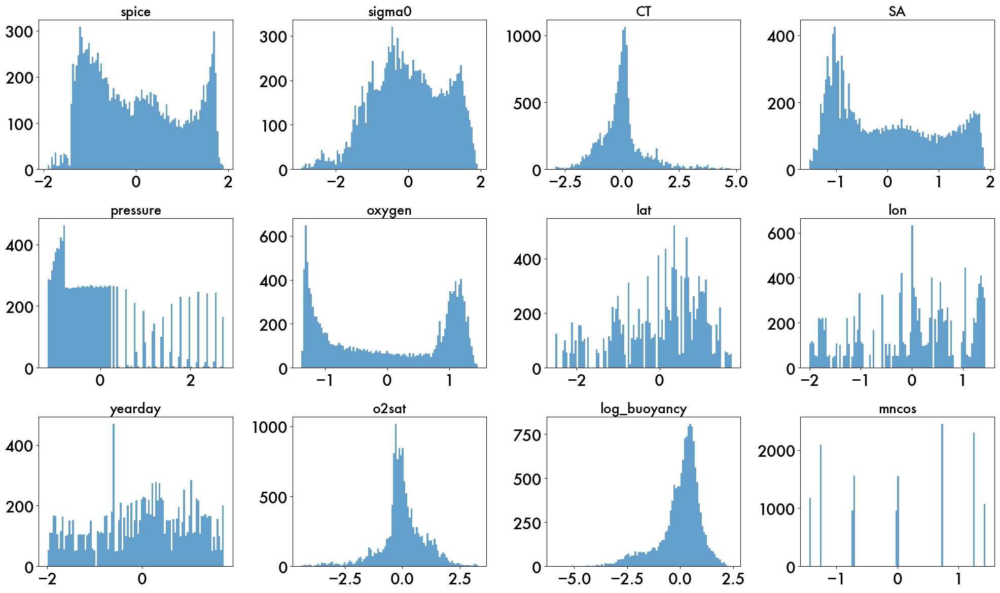

In [16]:
training_scaled = scale_features(training, training, type='StandardScaler')

nbins = 100
fig, axs = plt.subplots(3, 4, figsize=(20,12), tight_layout=True)

axs = axs.flatten()
for c, var in enumerate(allvars):
    axs[c].hist(x=training_scaled[var].values, bins=nbins, alpha=0.7)
    axs[c].set_title(var)

for ax in axs:
    ax.grid(axis='y', alpha=0.75)

## 3.2 Main Training Method

In [63]:
# MAIN METHOD: Train RF model.
var_predict = 'nitrate'

def train_RF(var_list, training, validation, test, ntrees=1000, max_feats = 1/3, scaler='StandardScaler', min_samples_split=5):
    """ 
    Main method to train the RF model.
    Scaling of datasets to between 0 and 1 is done internally within the method.
    @param: 
        var_list: list of variables to use in the model
        training: training data unscaled, i.e. original range of values
        validation: validation data unscaled
        test: test data unscaled 
        ntrees: 1000 trees by default.

    @return:
        Mdl: trained RF model
        Mdl_MAE: Rescaled mean absolute error for training, validation, and test sets
        Mdl_IQR: Rescaled IQR for training, validation, and test sets
        DF_with_error: Rescaled dataframe with error metrics for the *TEST* set

    """

    Mdl = RandomForestRegressor(ntrees, max_features = max_feats, random_state = 0, bootstrap=False, min_samples_split=min_samples_split)
        #  max_features: use at most X features at each split (m~sqrt(total features)). ISSR.
        #  bootstrapping: *** Should be FALSE for geospatial data.

    # Drop NaN's without profid or wmoid
    cols_na = [col for col in training.columns if col not in ['profid', 'wmoid', 'AOU', 'dist_maxb']]
    training_nona = training.dropna(axis=0, subset=cols_na)  # makes same length as training_scaled
    validation_nona = validation.dropna(axis=0, subset=cols_na)
    test_nona = test.dropna(axis=0, subset=cols_na)

    # Scale features using the specified 'type' for each subset of data
    # Method drops Nan's
    # Note that scaler will NOT scale the target variable nitrate.
    [training_scaled, validation_scaled, test_scaled] = scale_down_tvt(training_nona, validation_nona, test_nona, type=scaler)

   
    # Create X Variables for each subset of data. Scale down. 
    X_training = training_scaled[var_list].to_numpy()
    X_validation = validation_scaled[var_list].to_numpy()
    X_test = test_scaled[var_list].to_numpy()

    # USE UNSCALED NITRATE
    Y_training = training_nona[var_predict].to_numpy()
    Y_validation = validation_nona[var_predict].to_numpy()
    Y_test = test_nona[var_predict].to_numpy()

    # Old: Using scaled nitrate
    # Y_training = training_scaled[var_predict].to_numpy()
    # Y_validation = validation_scaled[var_predict].to_numpy()
    # Y_test = test_scaled[var_predict].to_numpy()    ### Can also leave target nitrate unscaled. change test_scaled to test

    # Train the model
    Mdl.fit(X_training, Y_training)

    # Estimate
    Y_pred_training = Mdl.predict(X_training)
    Y_pred_validation = Mdl.predict(X_validation)
    Y_pred_test = Mdl.predict(X_test)

    
    # Notice the second variable, training_nona is used to rescale the target. 
    # Y_pred_training = rescale_target(Y_pred_training, training_nona[var_predict], type=scaler) # Rescale the predicted nitrate
    # Y_pred_validation = rescale_target(Y_pred_validation, training_nona[var_predict], type=scaler) # Rescale the predicted nitrate
    # Y_pred_test = rescale_target(Y_pred_test, training_nona[var_predict], type=scaler) # Rescale the predicted nitrate
    #     # changed from rescale_var to rescale_target for using only the training scaler. 


    # Create dataframe for the test set with depth --> 
    DF_with_error = test_nona.copy(); 
    DF_with_error = DF_with_error.reset_index(drop=True)
    observed_nitrate = DF_with_error[var_predict].to_numpy()

    # Save new dataframe with test results
    DF_with_error['test_prediction'] = Y_pred_test
    DF_with_error['test_error'] = DF_with_error['test_prediction'] - observed_nitrate
    DF_with_error['test_relative_error'] = DF_with_error['test_error']/observed_nitrate

    # Error metrics
    AE_RF_training = np.abs(Y_pred_training - training_nona[var_predict])
    IQR_RF_training = iqr(abs(AE_RF_training))
    r2_RF_training = r2_score(training_nona[var_predict], Y_pred_training)

    # Return validation metrics
    AE_RF_validation = np.abs(Y_pred_validation - validation_nona[var_predict])
    IQR_RF_validation = iqr(abs(AE_RF_validation))
    r2_RF_validation = r2_score(validation_nona[var_predict], Y_pred_validation)

    validation_error = validation_nona.copy() #pd.DataFrame()
    validation_error['val_error'] = Y_pred_validation - validation_nona[var_predict]
    validation_error['val_relative_error'] = validation_error['val_error']/validation_nona[var_predict]

    AE_RF_test = np.abs(Y_pred_test - test_nona[var_predict]) # same as DF_with_error['test_error']
    IQR_RF_test = iqr(abs(AE_RF_test))
    r2_RF_test = r2_score(test_nona[var_predict], Y_pred_test)

    Mdl_MAE = [np.nanmedian(abs(AE_RF_training)), np.nanmedian(abs(AE_RF_validation)), np.nanmedian(abs(AE_RF_test))]
    Mdl_IQR = [IQR_RF_training, IQR_RF_validation, IQR_RF_test]
    Mdl_r2 = [r2_RF_training, r2_RF_validation, r2_RF_test]

    return [Mdl, Mdl_MAE, Mdl_IQR, Mdl_r2, DF_with_error, validation_error]


## 3.4 Run the model

In [130]:
# WARNING: running this will erase any existing model training runs
# Code block to set up all model dictionaries with errors.

models = dict.fromkeys(model_list)
models_MAE = dict.fromkeys(model_list)
models_IQR = dict.fromkeys(model_list)
models_r2 = dict.fromkeys(model_list)
models_DF_err = dict.fromkeys(model_list)
models_val_err = dict.fromkeys(model_list)


In [131]:
# Train the models with chosen lists.
# Set parameters
ntrees=1000
max_feats = 1/3
min_samples_split = 5
scaler = 'StandardScaler'

# Bootstrap always False.

description = 'ntrees=' + str(ntrees) + ', max_features=' + str(max_feats) + ', scaler=' + str(scaler)

print(description + '\n')
for k in tqdm(model_list): # ['Model_G']): 
    [models[k], models_MAE[k], models_IQR[k], models_r2[k], models_DF_err[k], models_val_err[k]] = train_RF(var_list[k], training, validation, test, 
                                                                                         ntrees = ntrees, max_feats = max_feats, scaler=scaler, 
                                                                                         min_samples_split=min_samples_split)

ntrees=1000, max_features=0.3333333333333333, scaler=StandardScaler



100%|██████████| 7/7 [02:06<00:00, 18.06s/it]


In [594]:
# TRY RESTRICTING TO ONLY THE WINTER MONTHS
training_winter =  training[training.month.isin([5,6,7,8])]
validation_winter = validation[validation.month.isin([5,6,7,8])]
test_winter = test[test.month.isin([5,6,7,8])]

ntrees=1000
max_feats = 1/3
scaler = 'StandardScaler'

description = 'ntrees=' + str(ntrees) + ', max_features=' + str(max_feats) + ', scaler=' + str(scaler)
print(description + '\n')
for k in tqdm(model_list[3:]): # model_list): # [
    newk = k + '_winter'
    [models[newk], models_MAE[newk], models_IQR[newk], models_r2[newk], models_DF_err[newk], models_val_err[newk]] = train_RF(var_list[k], training_winter, validation_winter, test_winter, 
                                                                                         ntrees = ntrees, max_feats = max_feats, scaler=scaler)

ntrees=1000, max_features=0.3333333333333333, scaler=StandardScaler



100%|██████████| 4/4 [00:30<00:00,  7.60s/it]


In [132]:
# Save the model into a list
# RF_split = [models, models_MAE, models_IQR, models_r2, models_DF_err, models_val_err]
RF_fin24 = [models, models_MAE, models_IQR, models_r2, models_DF_err, models_val_err]

In [133]:
# Choose the most current RF_ver to plot, if you are making multiple runs
# RF_ver = RF_split.copy()
RF_ver = RF_fin24.copy()

### Save test float with all model test predictions

In [134]:
float_6030 = test.copy()
for k in ['Model_A', 'Model_B', 'Model_C', 'Model_D', 'Model_E', 'Model_F', 'Model_G']:
    temp = RF_ver[4][k]['test_prediction'].values
    float_6030[k] = temp

# Save
float_6030.describe()
float_6030.to_csv('../working-vars/RF-training/mlresult_wmo5906030_allpreds_' + desc + '.csv')

# PLOTTING PARAMETERS

In [135]:
size = 22
params = {'legend.fontsize': size-2, 
          'xtick.labelsize':size, 
          'ytick.labelsize':size, 
          'font.size':size,
          'font.family':'Futura'}
plt.rcParams.update(params)


# Make Model palettes
# pal = sns.color_palette('Dark2', n_colors = len(model_list))
# model_palettes = {k:v for k, v in zip(model_list, pal)}

# Palette for plotting feature importance comparisons
pal = sns.color_palette('Set3', n_colors = 9)
dict = {'spice' : pal[2],
        'sigma0' : pal[3],
        'lat' : pal[0],
        'lon' : pal[8],
        # 'yearday' : pal[1],
        'oxygen' : pal[5],
        'CT' : pal[6],
        'SA' : pal[7],
        'pressure' : pal[4]}
        
pal = sns.color_palette('Set1', n_colors = 48)
pald= {k:v for k, v in zip(model_list, pal)}
# pal[0:2], *other = pal

# PART 4: Feature Importances


## 4.0 Calculate Feature Importance Dictionary

In [136]:
# Make total feature importance dictionary for plotting
dict = dict.fromkeys(allvars)
feat_imps = pd.DataFrame()

# Fill in feature importance
for ind, vkey in enumerate(model_list):
    for var in var_list[vkey]:
        feat_imps.at[ind, var] = models[vkey].feature_importances_[var_list[vkey].index(var)]

# feat_imps = feat_imps.set_index('Mdl').fillna(np.nan)
feat_imps['Mdl'] = model_list
feat_imps = feat_imps.set_index('Mdl').fillna(np.nan)
feat_imps

,spice,sigma0,CT,SA,pressure,oxygen,lat,lon,yearday,o2sat,log_buoyancy,ydcos,ydsin
Mdl,,,,,,,,,,,,,
Model_A,0.417271,0.582729,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model_B,NaN,NaN,0.169404,0.476596,0.354000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model_C,NaN,NaN,0.122787,0.321268,0.266088,0.289856,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model_D,NaN,NaN,0.095765,0.365912,0.220721,0.285151,0.013100,0.009825,0.009526,NaN,NaN,NaN,NaN
Model_E,NaN,NaN,0.079077,0.345466,0.216605,0.263456,0.010386,0.008815,0.008143,0.068051,NaN,NaN,NaN
Model_F,NaN,NaN,0.093799,0.337971,0.214502,0.263391,0.013022,0.010245,0.009863,NaN,0.057209,NaN,NaN
Model_G,NaN,NaN,0.083373,0.401470,0.200605,0.280240,0.010943,0.007427,0.006611,NaN,NaN,0.003991,0.00534


In [137]:
# Instead of varaible list, save feature importance dataframe 
# feat_imps.to_csv('../working-vars/RF-training/mlresult_feat_imps_' + desc + '.csv')

## 4.1 Feature Importance Plots

In [87]:
def plot_feat_importance(Mdl, var_list, save=False):
    Mdl.feature_importances_
    plt.figure(figsize=(10,5))
    ax = plt.gca()
    ax.bar(var_list, Mdl.feature_importances_, zorder=3)
    ax.set_title("Random Forest Feature Importance")
    ax.set_xlabel("Feature")
    ax.set_ylabel("Out of Bag Feature Importance")
    ax.grid(zorder=1)
    print('sum of feature importances: ' + str(sum(Mdl.feature_importances_)))
    
    if save:
        plt.savefig("RFFeatureImportancepH.png")
    return 


# plot_feat_importance(Mdl_16B, var_list['Mdl_16B'], save=False)

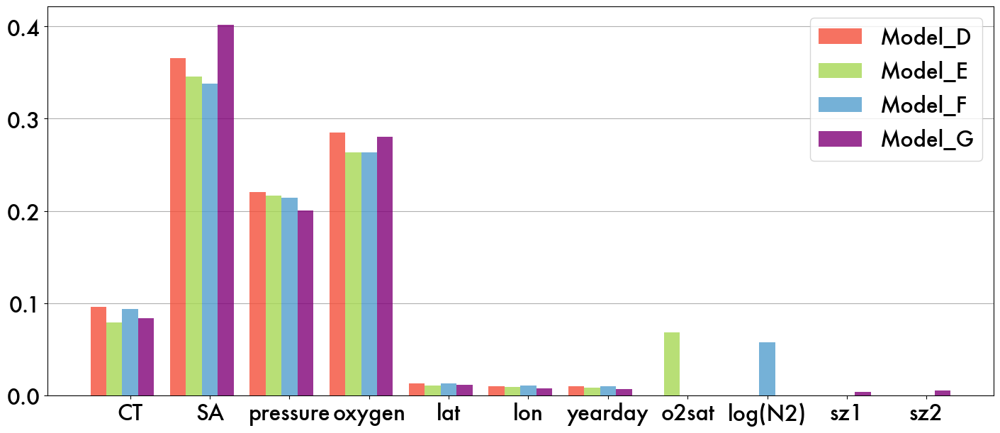

In [139]:
# CURRENT: Make side by side comp between model (grouped by variable)
save=True
fig = plt.figure(figsize=(14,6), layout='constrained')
ax = fig.gca()

barwidth=.8

# plot the simple ones
# modlist = model_list[:4]
# varslist = allvars[:-4]
# xlabel = ['spice', 'sigma0', 'CT', 'SA', 'pressure', 'oxygen', 'lat', 'lon', 'yearday']

# plot the complex ones
modlist = model_list[3:]
varslist = allvars[2:]
xlabel = ['CT', 'SA', 'pressure', 'oxygen', 'lat', 'lon', 'yearday',
                    'o2sat','log(N2)', 'sz1', 'sz2']

# Result of plot method
xind = dict.fromkeys(modlist)
xind[modlist[0]] = np.arange(len(varslist))*len(modlist)

for i in range(len(modlist)-1):
    xind[modlist[i+1]] = [x + barwidth for x in xind[modlist[i]]]

for modtag in modlist:
    ax.bar(xind[modtag], feat_imps[varslist].loc[modtag].to_numpy(), color = model_palettes[modtag], alpha=0.8, label = modtag, zorder=3)

ax.grid(axis='y', zorder=0)
ax.legend(loc='upper right', fontsize=22)


ax.set_xticks(xind[modlist[2]])
ax.set_xticklabels(varslist)
ax.set_xticklabels(xlabel)

        # 'o2sat','log(N2)', 'mncos', 'mnsin'])
# ax.set_title('Feature Importances')

if save:
    plt.savefig('../figures/FeatureImportance_complexmodels.png')
    # plt.savefig('../figures/FeatureImportance_simplemodels.png')

Text(0.5, 1.0, 'Feature Importances')

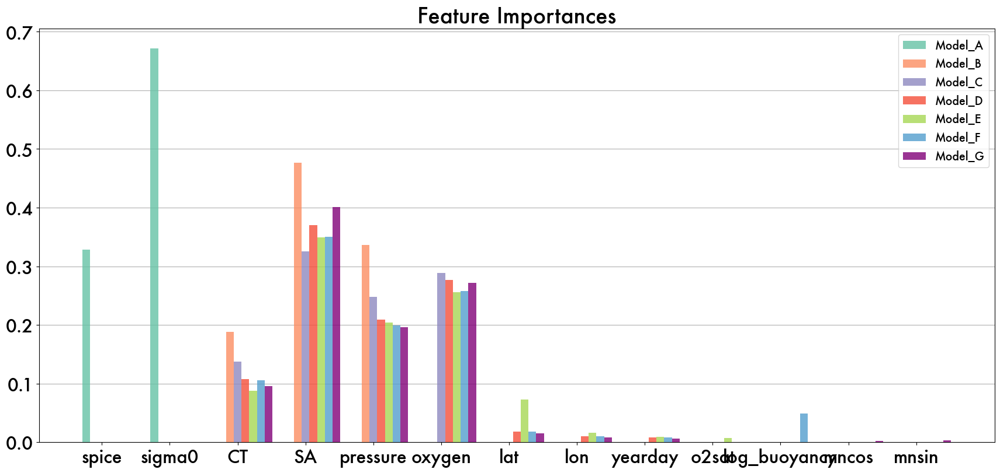

In [560]:
# (Crowded): For all models, make side by side comp between model (grouped by variable)
fig = plt.figure(figsize=(17,8), layout='constrained')
ax = fig.gca()

barwidth=.8
xind = dict.fromkeys(model_list)
xind[model_list[0]] = np.arange(len(allvars))*len(model_list)
for i in range(len(model_list)-1):
    xind[model_list[i+1]] = [x + barwidth for x in xind[model_list[i]]]

for modtag in model_list:
    ax.bar(xind[modtag], feat_imps.loc[modtag].to_numpy(), color = model_palettes[modtag], alpha=0.8, label = modtag, zorder=3)

ax.grid(axis='y', zorder=0)
ax.legend(loc='upper right')


ax.set_xticks(xind[model_list[2]])
ax.set_xticklabels(allvars)
ax.set_title('Feature Importances')

# PART 5: RF Error Analysis

## 4.1 Make error dictionaries

In [140]:
def get_model_metrics(resultlist, mod_list=model_list):
    """ 
    resultlist: typically list of [models, models_MAE, models_IQR, models_r2, models_DF_err]"""
    models_MAE=resultlist[1]
    models_IQR=resultlist[2]
    models_r2=resultlist[3]

    model_metrics = pd.DataFrame()
    model_metrics['validation_MAE'] = [x[1][1].item() for x in models_MAE.items()]
    model_metrics['validation_IQR'] = [x[1][1].item() for x in models_IQR.items()]
    model_metrics['validation_r2'] = [x[1][1].item() for x in models_r2.items()]

    model_metrics['test_MAE'] = [x[1][2].item() for x in models_MAE.items()]
    model_metrics['test_IQR'] = [x[1][2].item() for x in models_IQR.items()]
    model_metrics['test_r2'] = [x[1][2].item() for x in models_r2.items()]

    model_metrics['model'] = mod_list
    model_metrics.set_index('model', inplace=True)
    
    return model_metrics

In [90]:
# Method to print MAE dictionaries
def print_dict(dict):
    print("\n".join("{}  \t{}".format(k, v) for k, v in dict.items()))

def print_sorted(dict):
    print("\n".join("{}  \t{}".format(k, v) for k, v in sorted(dict.items(), key=lambda x:x[1]))) 

In [91]:
# Error printing methods
def get_95_bounds(data):
    mean = np.mean(data); std_dev = np.std(data)
    low = mean - 2 * std_dev
    high = mean + 2 * std_dev

    return [low, high]

def print_error_bounds(data, var='test_error'):
    err = data[var]

    print('Errors:')
    # print('median error:   \t' + str(err.median()))
    # print('mean error      \t' + str(err.mean()))
    print('median abs error: \t' + str(np.abs(err).median()))
    print('mean abs error \t\t' + str(np.abs(err).mean()))

    err = data[data.yearday <200][var]
    print('\nDuring SOGOS (yd<200):')
    # print('median error:   \t' + str(err.median()))
    # print('mean error      \t' + str(err.mean()))

    print('median abs error: \t' + str(np.abs(err).median()))
    print('mean abs error \t\t' + str(np.abs(err).mean()) + '\n\n')

    # Bounds 95
    err = data[var]
    [low, high] = get_95_bounds(err)
    print('95% of errors fall between:')
    print(str(low.round(5)) + ' to ' + str(high.round(5)) )

    err = data[data.yearday <200][var]
    [low, high] = get_95_bounds(err)
    print("\nDuring SOGOS:")
    print('95% of errors fall between:')
    print(str(low.round(5)) + ' to ' + str(high.round(5)) )




In [92]:
# Method to print errors restricted to depth 
def print_error_depths(data, var='test_error', pres_lim = [0,1000]):
   data = data[(data.pressure > pres_lim[0]) & (data.pressure < pres_lim[1])]
   err = data[var]

   print('Errors between depths ' + str(pres_lim[0]) + ' to ' + str(pres_lim[1]) + ':')
   print('median abs error: \t' + str(np.abs(err).median()))
   print('mean abs error \t\t' + str(np.abs(err).mean()))

   # Bounds 95
   [low, high] = get_95_bounds(err)
   print('\n95% of errors fall between:')
   print(str(low.round(5)) + ' to ' + str(high.round(5)) )

   err = data[data.yearday <200][var]
   [low, high] = get_95_bounds(err)
   print("\nDuring SOGOS between depths " + str(pres_lim[0]) + ' to ' + str(pres_lim[1]) + ':')
   print('95% of errors fall between:')
   print(str(low.round(5)) + ' to ' + str(high.round(5)) )


In [34]:
# dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/RF-training/'

# # Import data output from RF training
# RF_validation = dict.fromkeys(model_list)
# RF_test = dict.fromkeys(model_list)

# for modtag in model_list:
#     filename = 'mlresult_' + modtag + '_test_error_' + desc + '.csv'
#     RF_test[modtag] = pd.read_csv(dir + filename)

#     filename = 'mlresult_' + modtag + '_val_error_' + desc + '.csv'
#     RF_validation[modtag] = pd.read_csv(dir + filename)

In [244]:
# dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/RF-training/'

# pd.read_csv(dir + 'mlresult_model_metrics_' + desc + '.csv')

,model,validation_MAE,validation_IQR,validation_r2,test_MAE,test_IQR,test_r2
0,Model_G,0.144533,0.209915,0.993329,0.208487,0.305499,0.986024
1,Model_D,0.147837,0.220458,0.992903,0.226598,0.328850,0.984117
2,Model_E,0.148036,0.226574,0.992915,0.219228,0.336902,0.984581
3,Model_F,0.156274,0.226210,0.992537,0.224073,0.328142,0.984402
4,Model_C,0.251523,0.360497,0.983936,0.243815,0.343168,0.977654
5,Model_B,0.268641,0.376193,0.978951,0.274993,0.340538,0.978868
6,Model_A,0.307056,0.447194,0.968067,0.290812,0.340269,0.976139


In [141]:
# Show model metrics
# Can sort by 'validation_MAE' or 'test_MAE'
print('RF Parameters: ' + description + desc + '\n')

# mod_list = model_list + [x + '_winter' for x in model_list[3:]]
model_metrics = get_model_metrics(RF_ver, mod_list = RF_ver[1].keys()).sort_values(by='validation_MAE')
model_metrics

RF Parameters: ntrees=1000, max_features=0.3333333333333333, scaler=StandardScalerfin24



,validation_MAE,validation_IQR,validation_r2,test_MAE,test_IQR,test_r2
model,,,,,,
Model_G,0.137654,0.203892,0.993602,0.204366,0.288493,0.986793
Model_E,0.141166,0.214329,0.993572,0.222752,0.338766,0.984422
Model_D,0.142544,0.211059,0.993413,0.226967,0.328232,0.984299
Model_F,0.147535,0.215698,0.993030,0.223896,0.326229,0.984479
Model_C,0.244489,0.354628,0.984262,0.244219,0.349177,0.975991
Model_B,0.266096,0.388199,0.978109,0.291118,0.350973,0.976983
Model_A,0.315131,0.463727,0.965829,0.309733,0.371379,0.969968


In [110]:
print('Model_G') # leaf size: 5
# print_error_bounds(RF_ver[4]['Model_G'], var='test_relative_error')
print_error_depths(RF_ver[4]['Model_G'], var='test_relative_error', pres_lim = [0,1000])

Model_G
Errors between depths 0 to 1000:
median abs error: 	0.006683610713555133
mean abs error 		0.008987826108470147

95% of errors fall between:
-0.02198 to 0.02558

During SOGOS between depths 0 to 1000:
95% of errors fall between:
-0.02754 to 0.03669


In [143]:
# TRY WITH YDSPLIT 
print('Model_G') # leaf size: 5
# print_error_bounds(RF_ver[4]['Model_H'], var='test_relative_error')
print_error_depths(RF_ver[4]['Model_G'], var='test_relative_error', pres_lim = [0,1000])

Model_G
Errors between depths 0 to 1000:
median abs error: 	0.0064816826836161315
mean abs error 		0.008659518789473275

95% of errors fall between:
-0.02063 to 0.02474

During SOGOS between depths 0 to 1000:
95% of errors fall between:
-0.02338 to 0.03424


In [97]:
RF_ver[4]['Model_G'].test_error.mean()

0.07146499337474939

In [144]:
# Save the MAE and metrics
# model_metrics.to_csv('../working-vars/RF-training/mlresult_model_metrics_' + desc + '.csv')

## 4.2 RF Error Distribution (Histograms) Plots

In [149]:
# Save the final test and validation errors for our chosen model (model G)
for modtag in model_list:
    RF_ver[4][modtag].to_csv('../working-vars/RF-training/mlresult_' + modtag + '_test_error_' + desc + '.csv')
    RF_ver[5][modtag].to_csv('../working-vars/RF-training/mlresult_' + modtag + '_val_error_' + desc + '.csv')

In [147]:
# Make Model palettes
pal = sns.color_palette('Set2', n_colors = len(model_list))
model_palettes = {k:v for k, v in zip(model_list, pal)}

model_palettes['Model_C'] = sns.color_palette('Purples')[3]
model_palettes['Model_D'] = sns.color_palette('Reds')[3]
model_palettes['Model_F'] = sns.color_palette('Blues')[3]
model_palettes['Model_G'] = sns.color_palette('RdPu')[5]

Text(0.5, 0, 'Relative Error %')

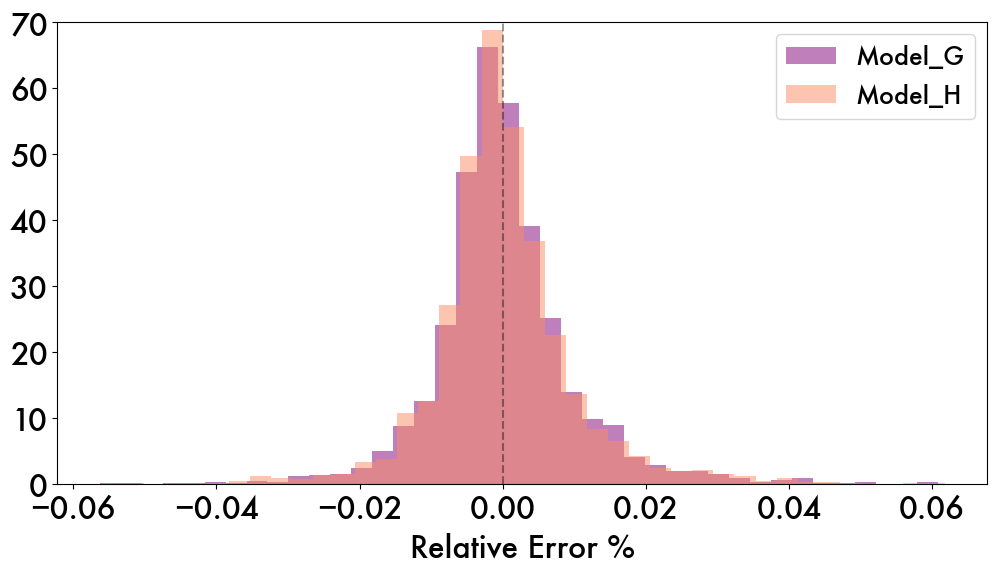

In [100]:
# Plot histogram of test or validation errors
which = 'val'

if which == 'val':
    tag = 'Model Validation Errors'
    var = 'val_relative_error'
    dat = RF_ver[5]
    ymax=70
else:
    tag = 'Model Test Errors'
    var = 'test_relative_error'
    dat = RF_ver[4]
    ymax=52

fig = plt.figure(figsize=(12, 6))
ax = fig.gca()

for mod in model_list[-4:]:
    RF = dat[mod][var]
    ax.hist(RF, bins=40, alpha=0.5, color= model_palettes[mod], label=mod, density=True)

ax.vlines(0, ymin=0, ymax=ymax, colors='k', alpha=0.4, linestyles='dashed')
ax.set_ylim([0,ymax])

plt.legend(fontsize=18)
ax.set_xlabel('Relative Error %')
# plt.title(tag)

# if save:
#     plt.savefig('../figures/RF_' + which + '_error_distribution.png', dpi=300)

In [148]:
var_list

{'Model_A': ['spice', 'sigma0'],
 'Model_B': ['CT', 'SA', 'pressure'],
 'Model_C': ['CT', 'SA', 'pressure', 'oxygen'],
 'Model_D': ['CT', 'SA', 'pressure', 'oxygen', 'lat', 'lon', 'yearday'],
 'Model_E': ['CT',
  'SA',
  'pressure',
  'oxygen',
  'lat',
  'lon',
  'yearday',
  'o2sat'],
 'Model_F': ['CT',
  'SA',
  'pressure',
  'oxygen',
  'lat',
  'lon',
  'yearday',
  'log_buoyancy'],
 'Model_G': ['CT',
  'SA',
  'pressure',
  'oxygen',
  'lat',
  'lon',
  'yearday',
  'ydcos',
  'ydsin']}

In [1109]:
# Plot val errors successively, adding one model at a time
# Good for presentations

dat = RF_ver[5]
tag = 'Model Validation Errors'
save = True
vartag = 'val_error'

# dat = RF_ver[4]
# tag = 'Model Test Errors'
# save = True
# vartag = 'test_error'

for i in range(len(model_list)):

    fig = plt.figure(figsize=(12, 6), layout='tight')
    ax = fig.gca()

    for mod in model_list[:i+1]:
        # RF = list(dat[mod]['test_relative_error'])
        RF = dat[mod][vartag]
        ax.hist(RF, bins=50, alpha=0.5, color= model_palettes[mod], label=mod, density=True)


    histmax = 2.4
    ax.vlines(0, ymin=0, ymax=histmax, colors='k', alpha=0.3, linestyles='dashed')

    if vartag == 'test_error':
        ax.set_ylim([0,1.5])
    if vartag == 'val_error':
        ax.set_ylim([0,histmax])
    plt.legend(fontsize=18)

    # ax.set_xlabel('Relative Error %')
    ax.set_xlabel('Error (umol/kg)')
    # plt.title(tag)

    if save:
        plt.savefig('../figures/RFvalidation_' + vartag + '_' + str(i) + '.png', dpi=300, bbox_inches='tight')
        plt.close()

Text(0.5, 1.0, 'Nitrate distributions')

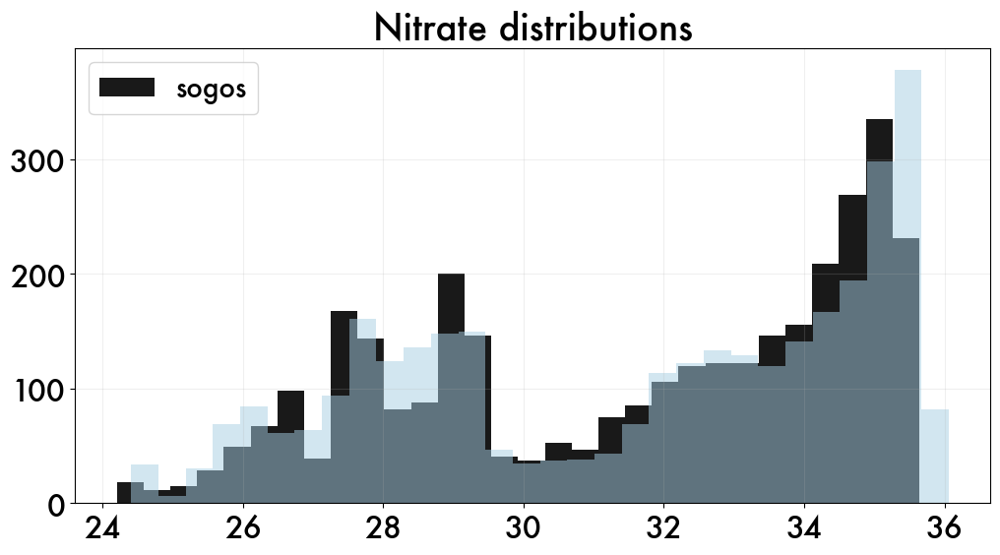

In [1031]:
# Plot nitrate distributions
tag = 'Nitrate distributions'
dat = RF_ver[4]


fig = plt.figure(figsize=(12,6))
ax = fig.gca()


obs_nitrate = dat['Model_G']['nitrate']
ax.grid(zorder=0, alpha=0.2)
plt.hist(obs_nitrate, bins=30, alpha=0.9, label='sogos', color='k', zorder=1)
plt.hist(dat['Model_G'].test_prediction, bins=30, alpha=0.5) #, bins=30, alpha=0.5, label='Model_G', color=model_palettes[mod], zorder=3)


# for mod in model_list[-1]:
#     RF = np.array(dat[mod]['test_prediction'])
#     plt.hist(RF, bins=30, alpha=0.5, label=mod, color=model_palettes[mod], zorder=3)
    
plt.legend()
ax.set_title(tag)

## 5.3 Plot Error Profile Maps

(950.0, 0.0)

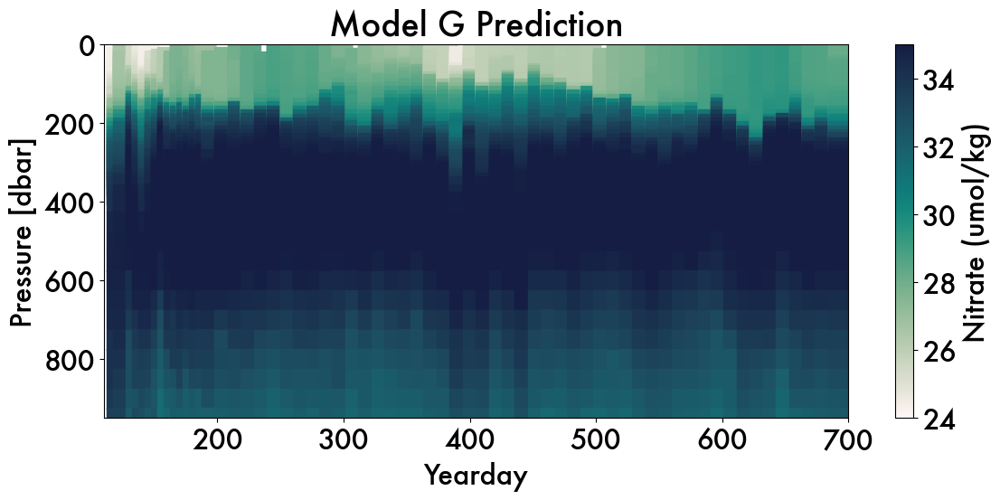

In [54]:
# SOGOS Float Model G Prediction Profile Map

dat = RF_ver[4]['Model_G']
# tag = 'SOGOS Observation'
tag = 'Model G Prediction'


fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.test_prediction, cmap=cmo.tempo, s=250, marker='s', vmin=24, vmax=35)
# sca = ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.tempo, s=250, marker='s', vmin=24, vmax=35)

ax.set_title(tag) # + ' Error (Pred - Obs), Fixed Standard')
plt.colorbar(sca, ax=ax).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')

ax.set_xlim([110,700])
ax.set_ylim([950,0])

# plt.savefig('../figures/ModelG_observation_profmap.png', dpi=300, bbox_inches='tight')

(950.0, 0.0)

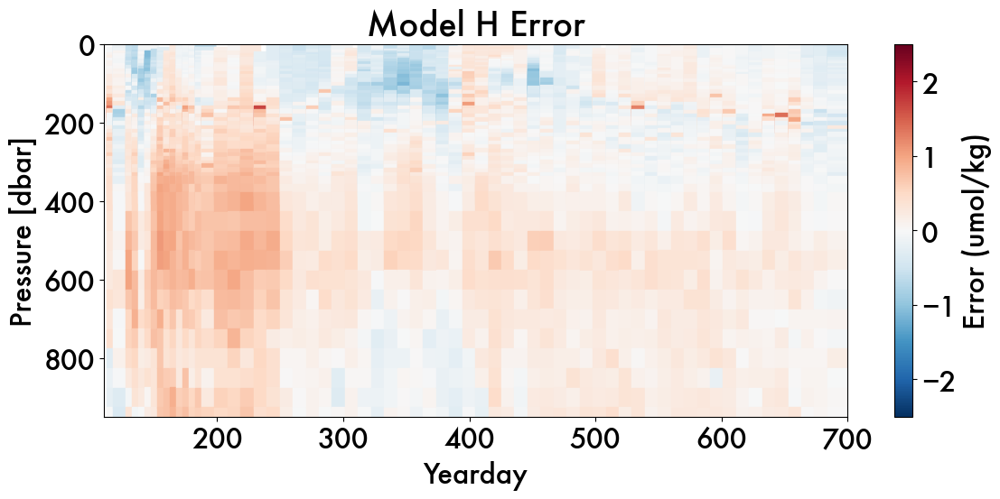

In [101]:
# SINGLE ERROR PROFILE
dat = RF_ver[4]['Model_H']
# dat = olddat
tag = 'Model H Error'


fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.test_error, cmap='RdBu_r', s=250, marker='s' , vmin=-2.5, vmax=2.5)
ax.set_title(tag) # + ' Error (Pred - Obs), Fixed Standard')

plt.colorbar(sca, ax=ax).set_label('Error (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')

ax.set_xlim([110,700])
ax.set_ylim([950,0])

# plt.savefig('../figures/ModelG_error_profmap.png', dpi=300, bbox_inches='tight')

In [56]:
oldRF = dict.fromkeys(model_list)

for modtag in model_list:
    filename = 'mlresult_' + modtag + '_test_error_nov2023.csv'
    oldRF[modtag] = pd.read_csv(dir + filename)

In [60]:
oldRF['Model_G']

,Unnamed: 0,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,...,mncos,mnsin,month,nitrate,wmoid,profid,dist_maxb,test_prediction,test_error,test_relative_error
0,0,120.374294,-51.355,30.208,33.059998,3.646815,34.001027,326.35095,26.900994,-19.750025,...,-0.866025,0.5,5,24.327644,5906030,5906030000,117.879992,24.474262,0.146618,0.006027
1,1,120.374294,-51.355,30.208,35.230000,3.646676,34.001041,326.34912,26.901019,-15.410772,...,-0.866025,0.5,5,24.310630,5906030,5906030000,115.709990,24.475295,0.164665,0.006773
2,2,120.374294,-51.355,30.208,36.670000,3.646283,34.001036,326.32490,26.901053,-15.336909,...,-0.866025,0.5,5,24.337334,5906030,5906030000,114.269990,24.478431,0.141097,0.005798
3,3,120.374294,-51.355,30.208,46.730000,3.648244,34.001074,326.13754,26.900892,-13.446538,...,-0.866025,0.5,5,24.227932,5906030,5906030000,104.209990,24.479584,0.251652,0.010387
4,4,120.374294,-51.355,30.208,52.360000,3.639289,34.002073,326.04580,26.902555,-13.096893,...,-0.866025,0.5,5,24.203530,5906030,5906030000,98.579990,24.495305,0.291775,0.012055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3303,3303,691.905764,-57.596,64.892,801.720030,2.179182,34.840148,175.33665,27.698522,-13.153399,...,0.866025,-0.5,11,33.055695,5906030,5906030063,-552.340030,33.240971,0.185276,0.005605
3304,3304,691.905764,-57.596,64.892,851.370000,2.156246,34.848747,176.85205,27.707240,-13.061677,...,0.866025,-0.5,11,32.948257,5906030,5906030063,-601.990000,32.931416,-0.016841,-0.000511
3305,3305,691.905764,-57.596,64.892,902.080000,2.134686,34.862375,178.92215,27.719843,-13.003560,...,0.866025,-0.5,11,32.480873,5906030,5906030063,-652.700000,32.537161,0.056288,0.001733
3306,3306,691.905764,-57.596,64.892,951.700000,2.086429,34.869113,180.15717,27.729116,-13.068774,...,0.866025,-0.5,11,32.307697,5906030,5906030063,-702.320000,32.348495,0.040798,0.001263


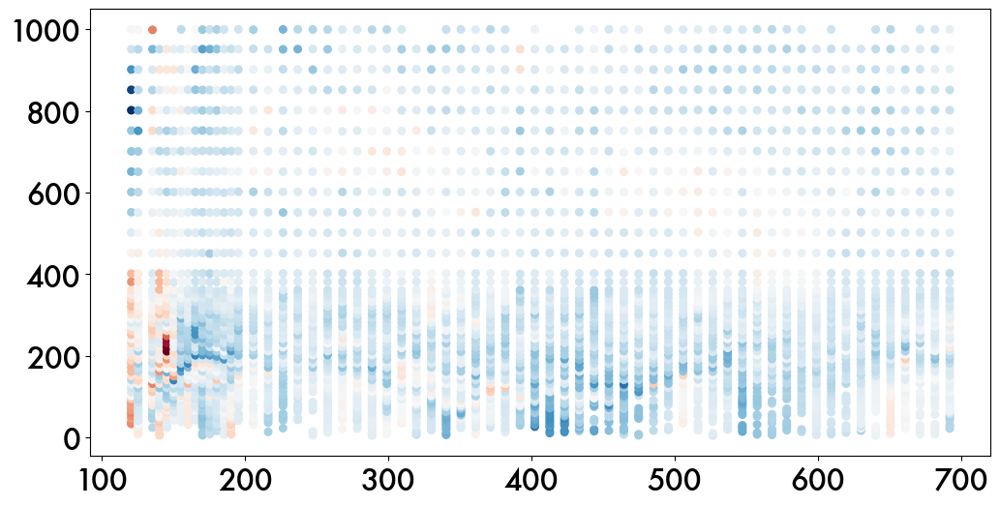

In [61]:
old = oldRF['Model_G'].copy()
old['difference'] = old['test_prediction'] - RF_ver[4]['Model_G']['test_prediction']

fig = plt.figure(figsize=(12,6))
ax = plt.gca()
ax.scatter(old.yearday, old.pressure, c=old.difference, cmap='RdBu_r', s=30)

Many of these plots have moved to sogos_RF_analysis.ipynb

Text(0.5, 0, 'Yearday (0 = Jan 1 2019)')

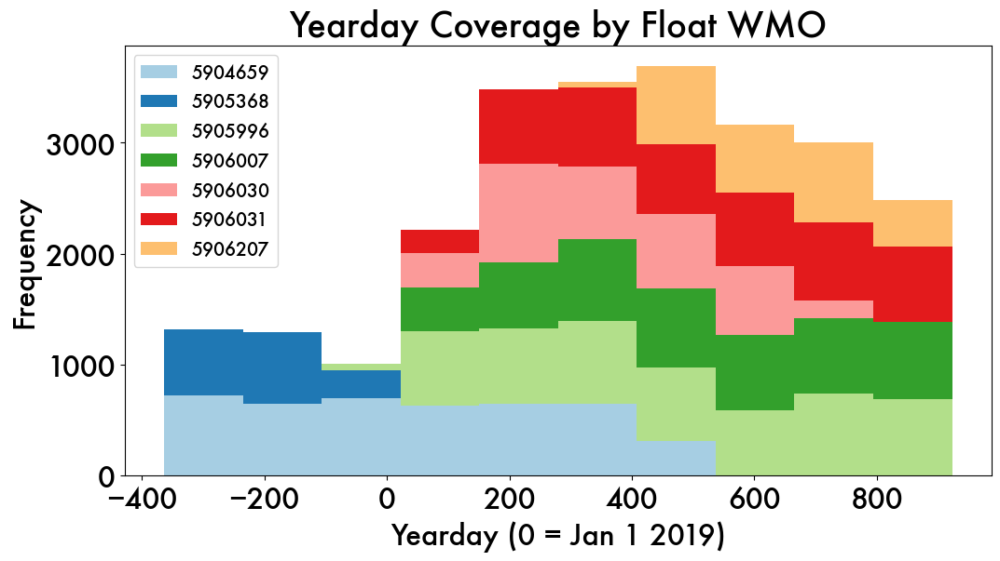

In [568]:
# argo_qc.pivot(columns='wmoid').yearday.plot(kind = 'hist', stacked=True)
pal = sns.color_palette("Paired")
sns.set_palette(pal)

fig = plt.figure(figsize=(12,6))
ax = plt.gca()
pd.DataFrame({k: v for k, v in floatDF.groupby('wmoid').yearday}).plot.hist(stacked=True, ax=ax) 
ax.legend(loc='upper left', fontsize=14)
ax.set_title('Yearday Coverage by Float WMO')
ax.set_xlabel('Yearday (0 = Jan 1 2019)')

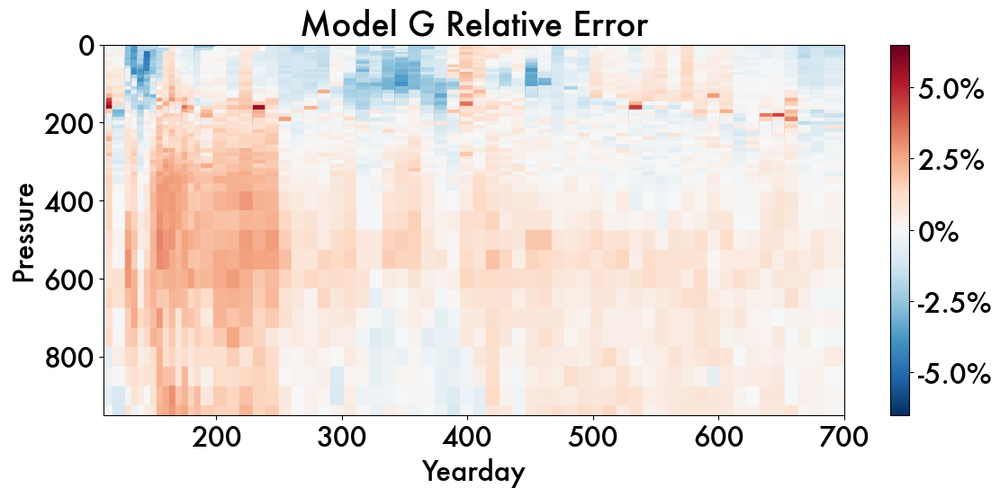

In [62]:
# SINGLE TEST RELATIVE ERROR PROFILE
# dat = RF_verE[4]['Mdl_13t']
# tag = 'RF_verE, model 13t'

dat = RF_ver[4]['Model_G']
tag = 'Model G'
# dat = RF_18_05t
# tag = 'RF_ver18, Mdl 05t'

fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.test_relative_error, cmap='RdBu_r', s=250, marker='s', vmin=-.065, vmax=.065) #vmin=-0.065, vmax=0.065) #, vmin=-2.5, vmax=2.5) # , , vmin = 24, vmax=35.0
ax.set_title(tag + ' Relative Error')


# ticklist = [-0.04, -0.02, 0, 0.02, 0.04] 
ticklist = [-0.05, -0.025, 0, 0.025, 0.05]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist) # [-0.28, -0.025, 0, 0.025, 0.28]
cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])  # Setting tick labels here
# cbar.set_label('Relative Error') 

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
# ax.set_xlim([120, 550])
# ax.set_ylim([600,0])

ax.set_xlim([110,700])
ax.set_ylim([950,0])

plt.savefig('../figures/ModelG_relerror_profmap.png', dpi=300, bbox_inches='tight')

## 5.4 Plot comparisons of error profile maps (subplots)

Text(0.5, 0, 'Yearday')

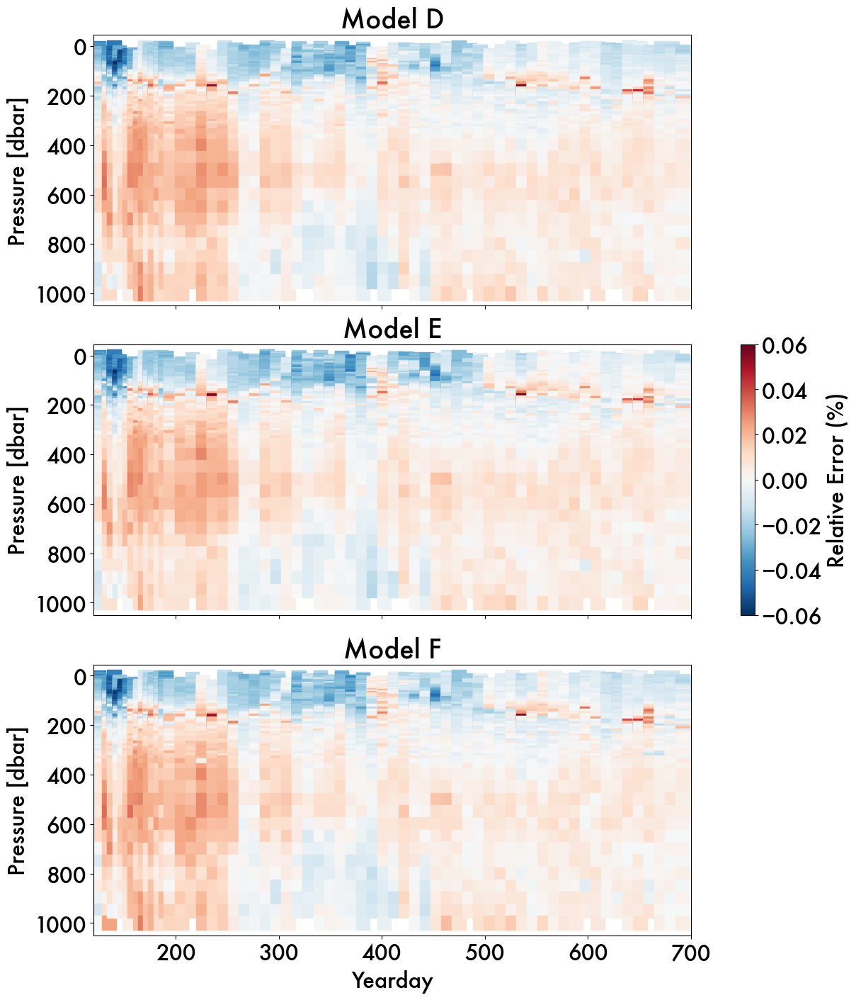

In [761]:
# * Compare errors between models
dat = RF_ver[4]['Model_D']
tag = 'D'

dat1 = RF_ver[4]['Model_E']
tag1 = 'E'

dat2 = RF_ver[4]['Model_F']
tag2 = 'F'

fig, axs = plt.subplots(3,1, figsize=(12,14), layout='constrained', sharex=True)
axs = axs.flatten()

sca0 = axs[0].scatter(dat.yearday, dat.pressure, c=dat.test_relative_error, cmap='RdBu_r', s=200, marker='s', vmin=-.06, vmax=.06) #, vmin=0, vmax=0.005
axs[0].set_title('Model ' + tag)

sca1 = axs[1].scatter(dat1.yearday, dat1.pressure, c=dat1.test_relative_error, cmap='RdBu_r', s=200, marker='s', vmin=-.06, vmax=.06) #, vmin=0, vmax=0.005
axs[1].set_title('Model ' + tag1)

sca2 = axs[2].scatter(dat2.yearday, dat2.pressure, c=dat2.test_relative_error, cmap='RdBu_r', s=200, marker='s', vmin=-.06, vmax=.06)
axs[2].set_title('Model ' + tag2)


# fig.colorbar(sca0, ax=axs[0:2], shrink=0.5).set_label('Nitrate (umol/kg)')
# fig.colorbar(sca1, ax=axs[1]).set_label('Nitrate (umol/kg)')
fig.colorbar(sca2, ax=axs[1]).set_label('Relative Error (%)')

for ax in axs:
    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([120,700])

axs[2].set_xlabel('Yearday')


Text(0.5, 0, 'Yearday')

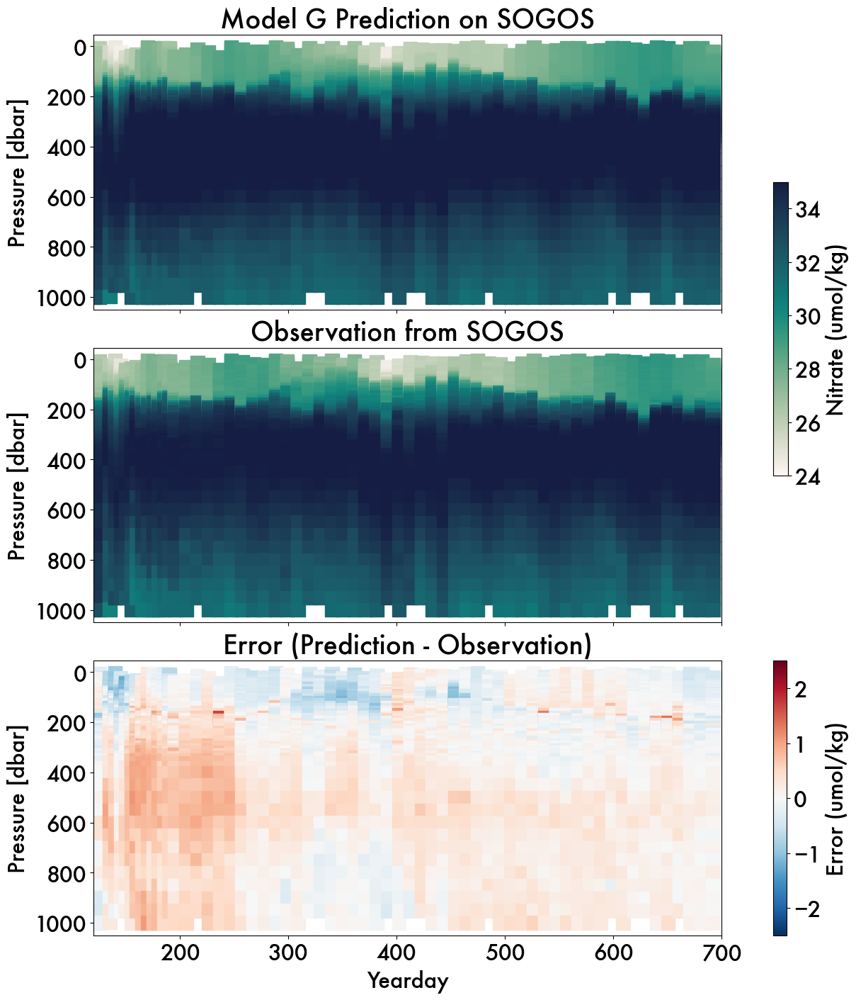

In [64]:
# * (Absolute, 3 subplots) Prediction, Obs, and Error Profiles
dat = RF_ver[4]['Model_G']
tag = 'Model G'

fig, axs = plt.subplots(3,1, figsize=(12,14), layout='constrained', sharex=True)
axs = axs.flatten()

sca0 = axs[0].scatter(dat.yearday, dat.pressure, c=dat.test_prediction, cmap=cmo.tempo, s=200, marker='s', vmin=24, vmax=35) #, vmin=0, vmax=0.005
axs[0].set_title(tag + ' Prediction on SOGOS')

sca1 = axs[1].scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.tempo, s=200, marker='s', vmin=24, vmax=35) #, vmin=0, vmax=0.005
axs[1].set_title('Observation from SOGOS') 

sca2 = axs[2].scatter(dat.yearday, dat.pressure, c=dat.test_error, cmap='RdBu_r', s=200, marker='s', vmin=-2.5, vmax=2.5)
axs[2].set_title('Error (Prediction - Observation)')


fig.colorbar(sca0, ax=axs[0:2], shrink=0.5).set_label('Nitrate (umol/kg)')
# fig.colorbar(sca1, ax=axs[1]).set_label('Nitrate (umol/kg)')
fig.colorbar(sca2, ax=axs[2]).set_label('Error (umol/kg)')

for ax in axs:
    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([120,700])

axs[2].set_xlabel('Yearday')

# plt.savefig('../figures/ModelG_combined_3_profmap.png', dpi=300, bbox_inches='tight')

/var/folders/nt/sjynqxjj7cz9r15fkd5d4r_40000gn/T/ipykernel_14031/1615707310.py:23: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[2].set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])


Text(0.5, 0, 'Yearday')

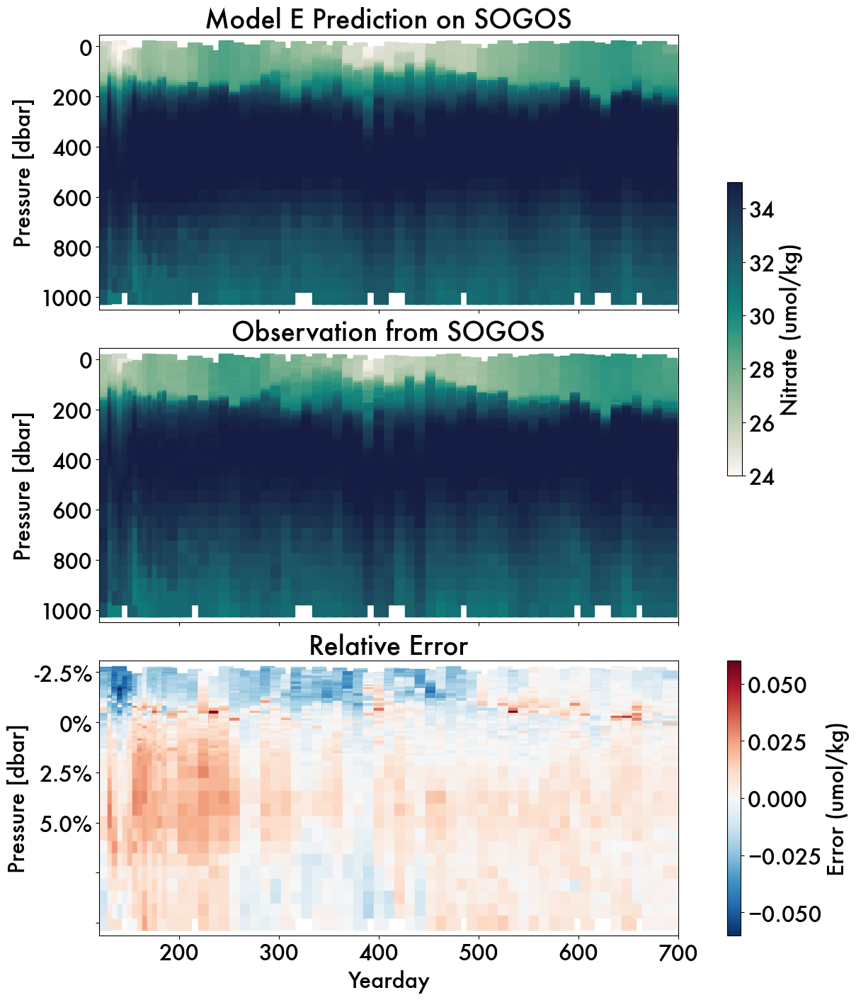

In [764]:
# * RELATIVE: Preidction, Obs, and Error Profiles
dat = RF_ver[4]['Model_E']
tag = 'Model E'

fig, axs = plt.subplots(3,1, figsize=(12,14), layout='constrained', sharex=True)
axs = axs.flatten()

sca0 = axs[0].scatter(dat.yearday, dat.pressure, c=dat.test_prediction, cmap=cmo.tempo, s=200, marker='s', vmin=24, vmax=35) #, vmin=0, vmax=0.005
axs[0].set_title(tag + ' Prediction on SOGOS')

sca1 = axs[1].scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.tempo, s=200, marker='s', vmin=24, vmax=35) #, vmin=0, vmax=0.005
axs[1].set_title('Observation from SOGOS') 

sca2 = axs[2].scatter(dat.yearday, dat.pressure, c=dat.test_relative_error, cmap='RdBu_r', s=200, marker='s', vmin=-.06, vmax=.06)
axs[2].set_title('Relative Error')


fig.colorbar(sca0, ax=axs[0:2], shrink=0.5).set_label('Nitrate (umol/kg)')
# fig.colorbar(sca1, ax=axs[1]).set_label('Nitrate (umol/kg)')

ticklist = [-0.05, -0.025, 0, 0.025, 0.05] 
cbar = plt.colorbar(sca2, ax=axs[2], ticks=ticklist).set_label('Error (umol/kg)')
axs[2].set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])

for ax in axs:
    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([120,700])
axs[2].set_xlabel('Yearday')



# ticklist = [-0.05, -0.025, 0, 0.025, 0.05] # [-0.06, -0.04, -0.02, 0, 0.02, 0.04, 0.06]
# cbar = plt.colorbar(sca, ax=ax, ticks=ticklist)  # [-0.05, -0.025, 0, 0.025, 0.05]
# # cbar.set_label('Relative Error (%)')
# # cbar.ax.set_yticklabels(['-6%', '-4%', '-2%', '0', '2%', '4%', '6%']) #
# cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%']) 




## 5.5 Model Errors by Depth

Text(0.5, 1.0, 'Model E- SOGOS Test Error')

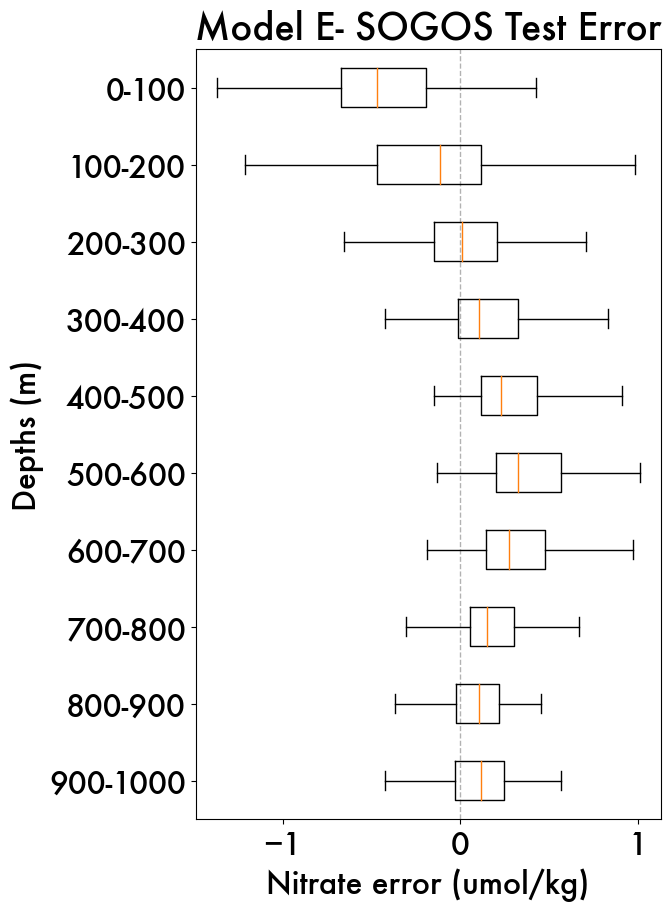

In [72]:
tag = "Model E"
dat = RF_ver19[4]['Model_E']

testerr= {
    "0-100": dat[(dat["pressure"] >= 0) & (dat["pressure"] < 100)]["test_error"].values,
    "100-200": dat[(dat["pressure"] >= 100) & (dat["pressure"] < 200)]["test_error"].values,
    "200-300": dat[(dat["pressure"] >= 200) & (dat["pressure"] < 300)]["test_error"].values,
    "300-400": dat[(dat["pressure"] >= 300) & (dat["pressure"] < 400)]["test_error"].values,
    "400-500": dat[(dat["pressure"] >= 400) & (dat["pressure"] < 500)]["test_error"].values,
    "500-600": dat[(dat["pressure"] >= 500) & (dat["pressure"] < 600)]["test_error"].values,
    "600-700": dat[(dat["pressure"] >= 600) & (dat["pressure"] < 700)]["test_error"].values,
    "700-800": dat[(dat["pressure"] >= 700) & (dat["pressure"] < 800)]["test_error"].values,
    "800-900": dat[(dat["pressure"] >= 800) & (dat["pressure"] < 900)]["test_error"].values,
    "900-1000": dat[(dat["pressure"] >= 900) & (dat["pressure"] < 1000)]["test_error"].values
}

labels, data = testerr.keys(), testerr.values()

fig = plt.figure(figsize=(6,10))
ax = fig.gca()
ax.boxplot(data, vert=False, showfliers=False, widths=0.5)
ax.invert_yaxis()
ax.axvline(x=0, color='k', alpha=0.3, linestyle='--', linewidth=1, zorder=0)


plt.yticks(range(1, len(labels) + 1), labels)
plt.ylabel("Depths (m)")
plt.xlabel("Nitrate error (umol/kg)")
plt.title(tag + "- SOGOS Test Error")
# plt.xlim(-0.025, 0.025)

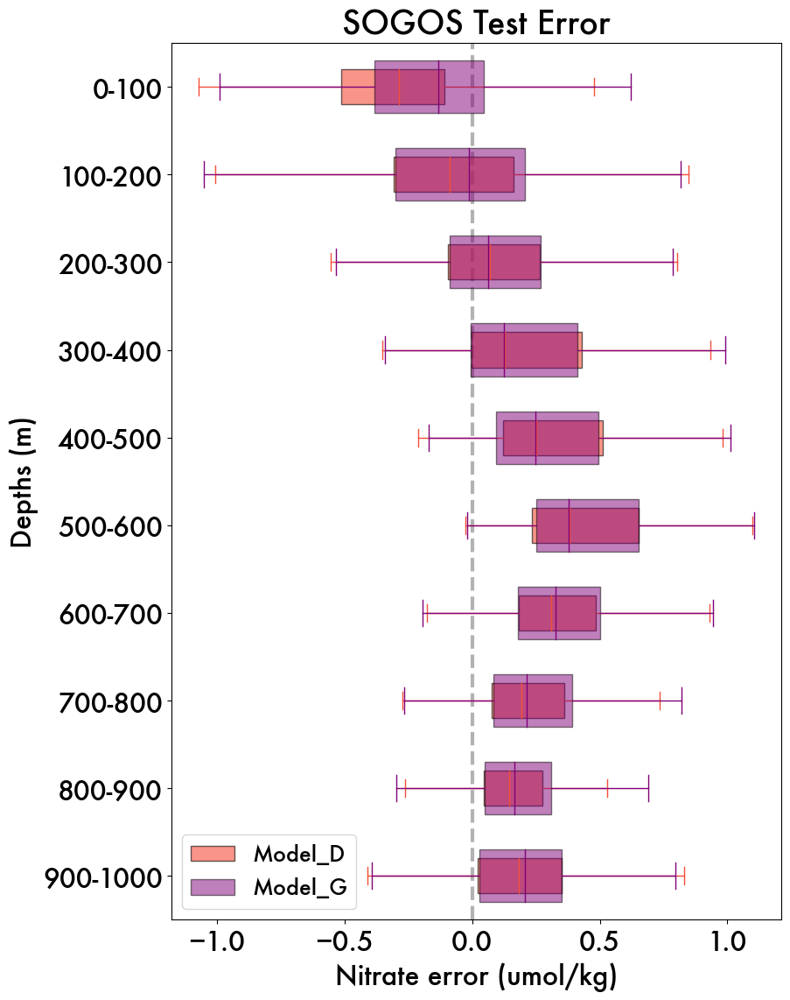

In [65]:
# GOOD VERISON: Compare two models 

mod_one = 'Model_D'
mod_two = 'Model_G'


dat_one = RF_ver[4][mod_one]
testerr_one = {
    "0-100": dat_one[(dat_one["pressure"] >= 0) & (dat_one["pressure"] < 100)]["test_error"].values,
    "100-200": dat_one[(dat_one["pressure"] >= 100) & (dat_one["pressure"] < 200)]["test_error"].values,
    "200-300": dat_one[(dat_one["pressure"] >= 200) & (dat_one["pressure"] < 300)]["test_error"].values,
    "300-400": dat_one[(dat_one["pressure"] >= 300) & (dat_one["pressure"] < 400)]["test_error"].values,
    "400-500": dat_one[(dat_one["pressure"] >= 400) & (dat_one["pressure"] < 500)]["test_error"].values,
    "500-600": dat_one[(dat_one["pressure"] >= 500) & (dat_one["pressure"] < 600)]["test_error"].values,
    "600-700": dat_one[(dat_one["pressure"] >= 600) & (dat_one["pressure"] < 700)]["test_error"].values,
    "700-800": dat_one[(dat_one["pressure"] >= 700) & (dat_one["pressure"] < 800)]["test_error"].values,
    "800-900": dat_one[(dat_one["pressure"] >= 800) & (dat_one["pressure"] < 900)]["test_error"].values,
    "900-1000": dat_one[(dat_one["pressure"] >= 900) & (dat_one["pressure"] < 1000)]["test_error"].values
}

dat_two = RF_ver[4][mod_two]
testerr_two = {
    "0-100": dat_two[(dat_two["pressure"] >= 0) & (dat_two["pressure"] < 100)]["test_error"].values,
    "100-200": dat_two[(dat_two["pressure"] >= 100) & (dat_two["pressure"] < 200)]["test_error"].values,
    "200-300": dat_two[(dat_two["pressure"] >= 200) & (dat_two["pressure"] < 300)]["test_error"].values,
    "300-400": dat_two[(dat_two["pressure"] >= 300) & (dat_two["pressure"] < 400)]["test_error"].values,
    "400-500": dat_two[(dat_two["pressure"] >= 400) & (dat_two["pressure"] < 500)]["test_error"].values,
    "500-600": dat_two[(dat_two["pressure"] >= 500) & (dat_two["pressure"] < 600)]["test_error"].values,
    "600-700": dat_two[(dat_two["pressure"] >= 600) & (dat_two["pressure"] < 700)]["test_error"].values,
    "700-800": dat_two[(dat_two["pressure"] >= 700) & (dat_two["pressure"] < 800)]["test_error"].values,
    "800-900": dat_two[(dat_two["pressure"] >= 800) & (dat_two["pressure"] < 900)]["test_error"].values,
    "900-1000": dat_two[(dat_two["pressure"] >= 900) & (dat_two["pressure"] < 1000)]["test_error"].values
}

color_one = model_palettes['Model_D'] # sns.color_palette("Purples")[3]
color_two = model_palettes['Model_G']

# col_one = {'color':color_one, 'linewidth':1}
col_one = {'color':color_one, 'linewidth':1}
col_two = {'color':color_two, 'linewidth':1}

fig = plt.figure(figsize=(9,13))
# fig = plt.figure(figsize=(13,13))
ax = fig.gca()


bplot_one = ax.boxplot(testerr_one.values(), vert=False, showfliers=False, widths=0.4, 
                    patch_artist=True, boxprops={'facecolor':color_one, 'alpha':0.6},
                    medianprops=col_one,
                    capprops=col_one,
                    whiskerprops=col_one,
                    flierprops=col_one)

bplot_two = ax.boxplot(testerr_two.values(), vert=False, showfliers=False, widths=0.6, 
                    patch_artist=True, boxprops={'facecolor':model_palettes[mod_two], 'alpha':0.5, 'edgecolor':'k'},
                    medianprops= col_two,
                    capprops=col_two,
                    whiskerprops=col_two,
                    flierprops=col_two)



# bplot_two = ax.boxplot(testerr_two.values(), vert=False, showfliers=False, widths=0.5, 
#                     patch_artist=True, boxprops={'facecolor':'m', 'alpha':0.5, 'edgecolor':'k'},
#                     medianprops= col_two,
#                     capprops=col_two,
#                     whiskerprops=col_two,
#                     flierprops=col_two)


ax.invert_yaxis()
ax.axvline(x=0, color='k', linestyle='--', linewidth=3, alpha=0.3, zorder=0)

labels = testerr_one.keys()
plt.yticks(range(1, len(labels) + 1), labels)
plt.ylabel("Depths (m)")
plt.xlabel("Nitrate error (umol/kg)")
plt.title("SOGOS Test Error")

ax.legend([bplot_one["boxes"][0], bplot_two["boxes"][0]], [mod_one, mod_two], loc='lower left', fontsize=18)

plt.savefig('../figures/ModelDvsG_test_error_bydepth.png', dpi=300, bbox_inches='tight')

### Nitrate gradient distirbutions

In [149]:
add_nitrate_grad(training, test_pred=False).grad_nitrate

0        0.070235
1        0.061362
2        0.022951
3        0.000000
4       -0.010035
           ...   
14756    0.012788
14757    0.007465
14758    0.000000
14759   -0.000596
14760   -0.004334
Name: grad_nitrate, Length: 14761, dtype: float64

TypeError: 'float' object is not callable

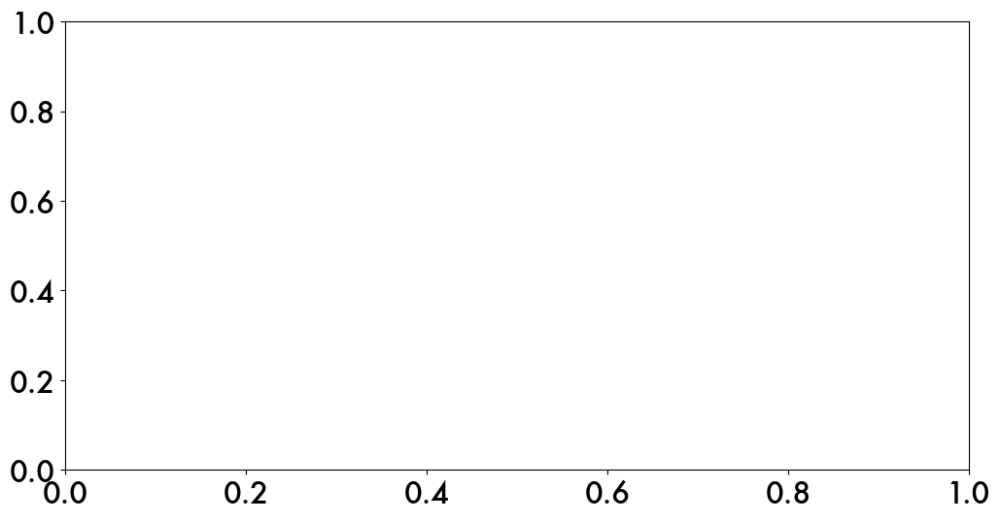

In [831]:
fig = plt.figure(figsize=(12,6))
ax = fig.gca()

test_grad_nitrate = list(add_nitrate_grad(test, test_pred=False).grad_nitrate)
test_grad_nitrate.remove(min(test_grad_nitrate))  # one weird value of -2

ax.hist(test_grad_nitrate, bins=40, color='k', alpha=0.4, density=True, label='SOGOS')

for modtag in model_list:
    ax.hist(models_DF_err_standard[modtag].grad_nitrate, bins=40, alpha=0.4, density=True, color=model_palettes[modtag], label=modtag)

# ax.hist(models_DF_err['Mdl_06t'].grad_nitrate, color='k', bins=20, alpha=0.4)
# ax.hist(models_DF_err['Mdl_23t'].grad_nitrate, color='r', bins=20, alpha=0.4)
ax.set_xlim(-0.05, 0.12)

ax.set_title('Distribution of nitrate gradients (standard)')
plt.legend()

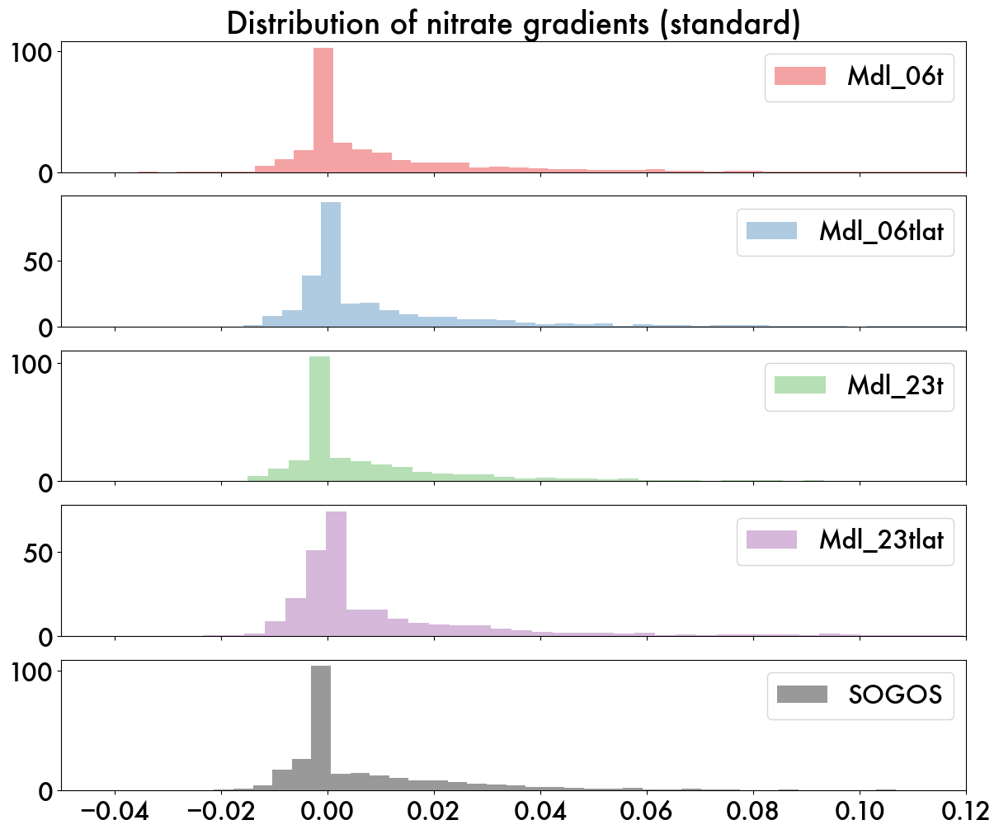

In [196]:
fig, axs = plt.subplots(5,1, figsize=(12,10), layout='constrained', sharex=True)
axs = axs.flatten()

test_grad_nitrate = list(add_nitrate_grad(test, test_pred=False).grad_nitrate)
test_grad_nitrate.remove(min(test_grad_nitrate))

for ind, modtag in enumerate(model_list):
    axs[ind].hist(models_DF_err_standard[modtag].grad_nitrate, bins=80, alpha=0.4, density=True, color=model_palettes[modtag], label=modtag)
    axs[ind].set_xlim(-0.05, 0.12)
    axs[ind].legend()
# ax.hist(models_DF_err['Mdl_06t'].grad_nitrate, color='k', bins=20, alpha=0.4)
# ax.hist(models_DF_err['Mdl_23t'].grad_nitrate, color='r', bins=20, alpha=0.4)
axs[4].hist(test_grad_nitrate, bins=80, color='k', alpha=0.4, density=True, label = 'SOGOS')

axs[0].set_title('Distribution of nitrate gradients (standard)')
plt.legend()

# PART 6: Other Plots

- T-S Space
- Isopycnals

## 6.0 Plotting methods
- Isopycnals

In [ ]:
# Plotting isopycnals
testlist = sg.list_profile_DFs(test)

min = 26.8 # 26.84855129122479
max = 27.8 # 27.7599400854142
isos = np.arange(268, 278, 1)/10
iso_dict = dict.fromkeys(isos)


for val in isos:
    isoline = pd.DataFrame()

    for df in testlist:
        closest_row = df.loc[(df['sigma0'] - val).abs().idxmin()]
        isoline = pd.concat([isoline, closest_row], axis=1)

    isoline = isoline.T
    isoline = isoline[abs(isoline['sigma0'] - val) <= 0.1]
    iso_dict[val] = isoline


In [ ]:
def get_isopycnals(list_DFs, min=26.8, max=27.8, spacing = 0.2, threshold=0.1):
    
    min = min*10 # 26.84855129122479
    max = max*10 # 27.7599400854142
    isos = np.arange(min, max, spacing*10)/10   # use /10 to get single decimal 

    iso_dict = dict.fromkeys(isos)

    for val in isos:
        isoline = pd.DataFrame()

        for df in list_DFs:
            closest_row = df.loc[(df['sigma0'] - val).abs().idxmin()]
            isoline = pd.concat([isoline, closest_row], axis=1)

        isoline = isoline.T
        isoline = isoline[abs(isoline['sigma0'] - val) <= threshold]
        iso_dict[val] = isoline
    
    return iso_dict


# ax2 = ax1.twinx()
# for key, val in iso_dict.items():
#     ax2.plot(val['yearday'], val['pressure'], linewidth=0.8, label=key)

# ax2.legend()

/opt/homebrew/Caskroom/mambaforge/base/envs/mlsogos/lib/python3.8/site-packages/labellines/core.py:204: UserWarning: The value at position 0 in `xvals` is outside the range of its associated line (xmin=391.8555324327615, xmax=391.8555324327615, xval=637.610274272989). Clipping it into the allowed range.
  warnings.warn(


ValueError: x label location is outside data range!

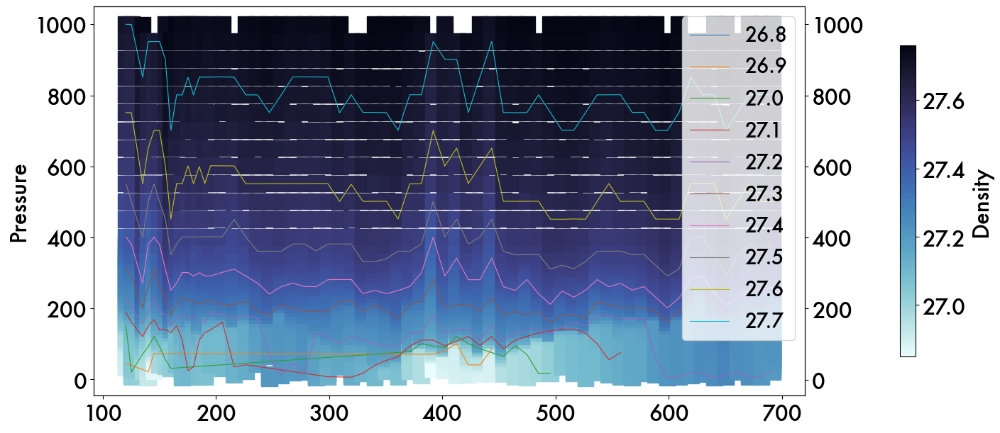

In [ ]:
# Plot density with density contours
mdl = 'Model_G'
df = RF_ver[4][mdl]
# tag = 'scaled target, standard scaler'

iso_dict = get_isopycnals(dfproc.list_profile_DFs(test), min=26.8, max=27.8, spacing=0.1, threshold=0.05)

# Create the scatter plot
fig, ax1 = plt.subplots(figsize=(14,6), layout='constrained')
sca = ax1.scatter(df['yearday'], df.pressure, c=df.sigma0, cmap=cmo.ice_r, s=270, marker='s') #, vmin = 25, vmax=34.8)
ax1.set_ylabel('Pressure')

fig.colorbar(sca, ax=ax1, shrink=0.8).set_label('Density')

ax2 = ax1.twinx()
for key, val in iso_dict.items():
    ax2.plot(val['yearday'], val['pressure'], linewidth=0.8, label=key)

ax2.legend()
labelLines(ax2.get_lines(), align=False, fontsize=18)
for ax in [ax1, ax2]:
    ax.invert_yaxis()

plt.xlabel('Time')
plt.title('SOGOS Sigma0')

# Display the plot
plt.show()




## 6.1 Plotting in T-S Space

Text(0.5, 1.0, 'Test Prediction Errors Model G')

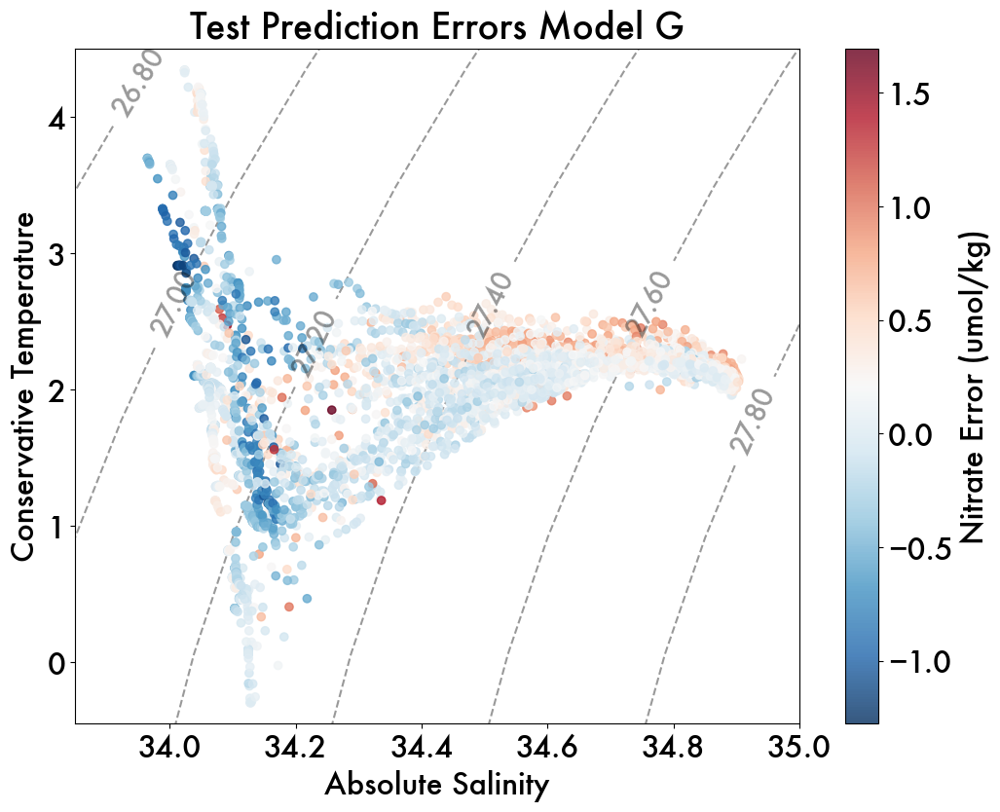

In [66]:
# Errors in TS Space
df = RF_ver[4]['Model_G']
modtag = 'Model G'

fig = plt.figure(figsize=(12,9))
ax = fig.gca()
plt.scatter(df.SA, df.CT, c=df.test_error, cmap='RdBu_r', alpha=0.8, zorder=3)  # , vmin=-5, vmax=5
plt.colorbar().set_label('Nitrate Error (umol/kg)')
plt.show

# Add density contours
# Figure out boudaries (mins and maxs)
smin = df.SA.min() -.3
smax = df.SA.max() +.3

tmin= df.CT.min() - 1.5
tmax = df.CT.max() + 0.9

# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens = np.zeros((ydim,xdim))
 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin

# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        dens[j,i]=gsw.sigma0(si[i],ti[j])

CS = ax.contour(si,ti,dens, linestyles='dashed', colors='k', alpha=0.4, zorder=1)
ax.clabel(CS, fontsize=20, fmt='%1.2f')
ax.set_ylim(-0.45,4.5)
ax.set_xlim(33.85, 35.0)

ax.set_xlabel('Absolute Salinity')
ax.set_ylabel('Conservative Temperature')
ax.set_title('Test Prediction Errors ' + modtag)


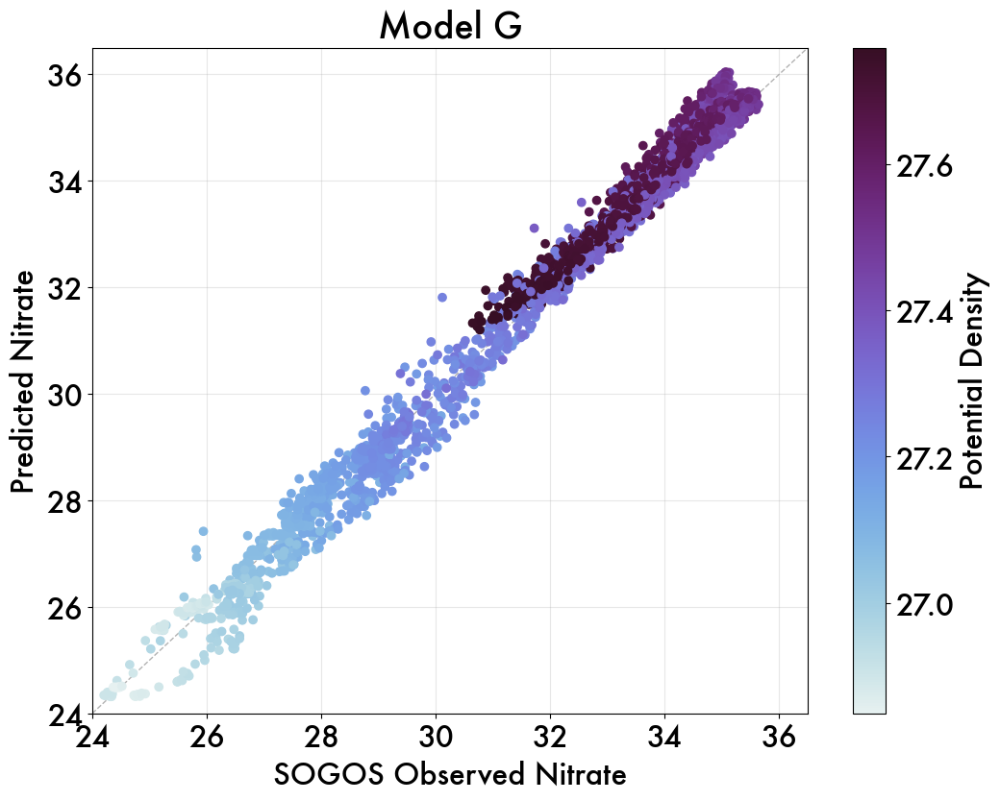

In [67]:
# Prediction Error as function of observed nitrate 1:1
df = RF_ver[4]['Model_G']
tag = 'Model G'


fig = plt.figure(figsize=(12,9))
ax = fig.gca()
plt.scatter(df.nitrate, df.test_prediction, c=df.sigma0, cmap=cmo.dense, zorder=3)
plt.plot([0, 40], [0, 40], 'k--', linewidth=1, alpha=0.3, zorder=0)
cbar = plt.colorbar()
cbar.set_label('Potential Density')
ax.set_xlabel('SOGOS Observed Nitrate')
ax.set_ylabel('Predicted Nitrate')
ax.set_title(tag)
ax.set_ylim(24, 36.5)
ax.set_xlim(24, 36.5)
ax.grid(alpha=0.3, zorder=1)


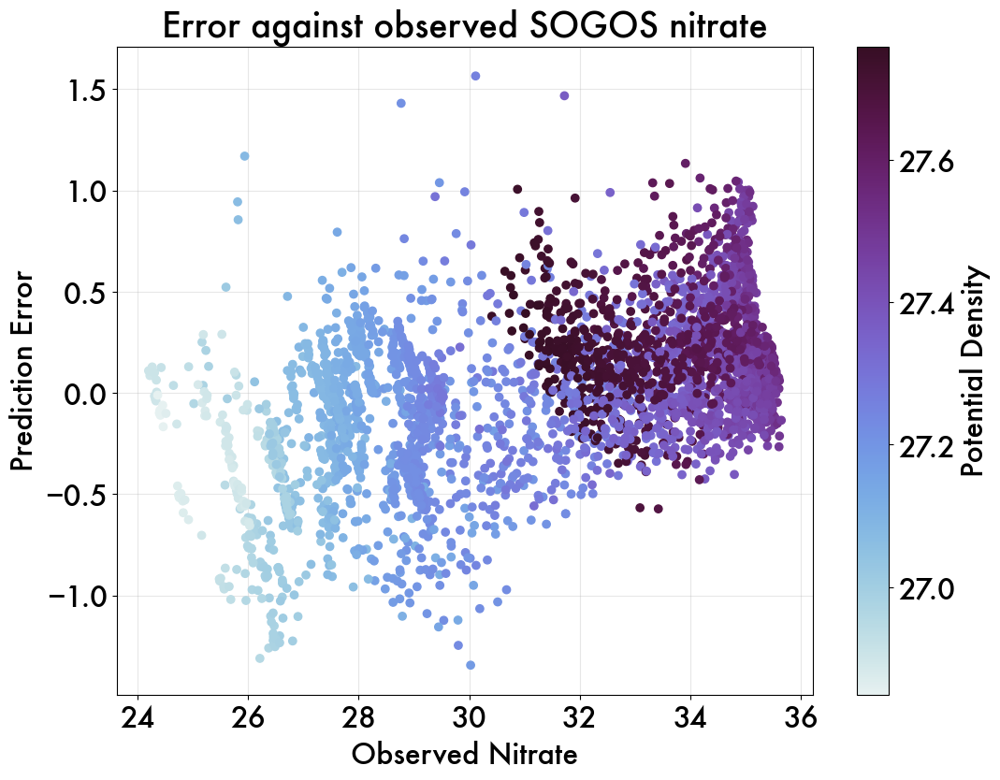

In [608]:
# Error against observed
fig = plt.figure(figsize=(12,9))
ax = fig.gca()
plt.scatter(df.nitrate, df.test_error, c=df.sigma0, cmap=cmo.dense, zorder=3)
cbar = plt.colorbar()
cbar.set_label('Potential Density')
ax.set_xlabel('Observed Nitrate')
ax.set_ylabel('Prediction Error')
ax.set_title('Error against observed SOGOS nitrate')
ax.grid(alpha=0.3, zorder=1)


# fig = plt.figure(figsize=(12,9))
# ax = fig.gca()
# plt.scatter(df.nitrate, df.test_error, c=df.CT, cmap=cmo.thermal, zorder=3)
# cbar = plt.colorbar()
# cbar.set_label('Conservative Temperature')
# ax.set_xlabel('Observed Nitrate')
# ax.set_ylabel('Prediction Error')
# ax.set_title('Error against observed SOGOS nitrate')
# ax.grid(alpha=0.3, zorder=1)


# fig = plt.figure(figsize=(12,9))
# ax = fig.gca()
# plt.scatter(df.nitrate, df.test_error, c=df.SA, cmap=cmo.haline, zorder=3)
# cbar = plt.colorbar()
# cbar.set_label('Absolute Salinity')
# ax.set_xlabel('Observed Nitrate')
# ax.set_ylabel('Prediction Error')
# ax.set_title('Error against observed SOGOS nitrate')
# ax.grid(alpha=0.3, zorder=1)



# PART 7: Cross Validation

## 7.1 K-Fold

In [102]:
def kfold_profiles(platDF, nfolds = 10):
        """
        @param platDF: scaled dataframe with all float and ship profiles
                nfolds: number of folds to split data into. 
                        Each fold will be used for validation once.
        @return folds_training: list of kfold dataframes for training
                folds_validation: list of kfold dataframes for validation

        """
        profs = pd.unique(platDF.profid)

        if 5906030 in profs:
                print('warning: 5906030 is in platDF')

        # Shuffle float profile ID's
        # Each element of fold_profs is a list of profile ID's belonging to the k-th fold
        np.random.seed(42) 
        rng = np.random.default_rng(); rng.shuffle(profs)
        fold_profs = np.array_split(profs, nfolds)

        # Make a dictionary of dataframes for validation and training. 
        # Each fold (1/nth of the total training data) will be used for validation once.
        # All profiles that are not part of that fold are used for training. 
        training_list = []; validation_list = []
        for i in np.arange(0,nfolds):
                df = platDF[platDF['profid'].isin(fold_profs[i])].copy()
                validation_list.append(df)

                df = platDF[~platDF['profid'].isin(fold_profs[i])].copy()
                training_list.append(df)

                
        folds_validation = {k:v for k, v in zip(np.arange(1,nfolds+1), validation_list)}
        folds_training = {k:v for k, v in zip(np.arange(1,nfolds+1), training_list)}

        return folds_training, folds_validation



In [103]:
#ftrain holds a list of kfold dataframes for training.
fdf = pd.concat([shipDF, floatDF])
fdf = fdf[fdf.wmoid!=5906030]
ftrain, fvalidation = kfold_profiles(fdf, nfolds=10)

In [104]:
fold_list = np.arange(1,11)
folds = dict.fromkeys(fold_list)
folds_MAE = dict.fromkeys(fold_list)
folds_IQR = dict.fromkeys(fold_list)
folds_r2 = dict.fromkeys(fold_list)
folds_DF_err = dict.fromkeys(fold_list)
folds_val_err = dict.fromkeys(fold_list)

In [105]:
# Train the folds. 
# Choose which model to cross-validate on k folds.
kfold_mdl = 'Model_H'
training_vars = var_list[kfold_mdl]

# Check hyperparameters
description = 'ntrees=' + str(ntrees) + ', max_features=' + str(max_feats) + ', scaler=' + str(scaler)

print('Training RF k-folds: ' + description)
print('Model: ' + kfold_mdl)
for k in tqdm(fold_list):
    [folds[k], folds_MAE[k], folds_IQR[k], folds_r2[k], folds_DF_err[k], folds_val_err[k]] = train_RF(training_vars, ftrain[k], fvalidation[k], test, 
                                                                                         ntrees = ntrees, max_feats = max_feats, scaler=scaler, min_samples_split= min_samples_split)

Training RF k-folds: ntrees=1000, max_features=0.3333333333333333, scaler=StandardScaler
Model: Model_H


100%|██████████| 10/10 [04:49<00:00, 28.98s/it]


In [106]:
# Make k-fold error dictionaries
fvalidation_MAE = {k:v for k,v in zip(fold_list, [x[1][1].item() for x in folds_MAE.items()])}
fvalidation_IQR = {k:v for k,v in zip(fold_list, [x[1][1].item()  for x in folds_IQR.items()])}
fvalidation_r2 = {k:v for k,v in zip(fold_list, [x[1][1].item()  for x in folds_r2.items()])}

ftest_MAE = {k:v for k,v in zip(fold_list, [x[1][2].item()  for x in folds_MAE.items()])}
ftest_IQR = {k:v for k,v in zip(fold_list, [x[1][2].item()  for x in folds_IQR.items()])}
ftest_r2 = {k:v for k,v in zip(fold_list, [x[1][2].item()  for x in folds_r2.items()])}

# Printing sorted dictionary of VALIDATION errors
print('RF Parameters: ' + description + ' ' + desc + '\n')
print(kfold_mdl + ' k-fold Validation MAE:')
print_sorted(fvalidation_MAE)

print()
print('Mean error: ' + str(np.mean(np.fromiter(fvalidation_MAE.values(), dtype=float))))
print('Standard deviation: ' + str(np.std(np.fromiter(fvalidation_MAE.values(), dtype=float))))


# Printing sorted dictionary of errors
# print('RF Parameters: ' + description + ' ' + desc + '\n')
# print(kfold_mdl + ' k-fold Test MAE:')
# print_sorted(ftest_MAE)

# print()
# print('Mean error: ' + str(np.mean(list(ftest_MAE.values()))))
# print('Standard deviation: ' + str(np.std(list(ftest_MAE.values()))))


RF Parameters: ntrees=1000, max_features=0.3333333333333333, scaler=StandardScaler RF_ydsines

Model_H k-fold Validation MAE:
5  	0.11928085983324443
6  	0.12141470858335168
8  	0.1263026266249785
1  	0.13273254170833226
3  	0.13948820049996868
2  	0.14184853400003306
10  	0.14895953633332937
4  	0.1504354347916781
9  	0.15634203791659473
7  	0.15684608075000384

Mean error: 0.13936505610415145
Standard deviation: 0.0132468921765021


In [150]:
# Save models and errors
print(kfold_mdl)

# for f in fold_list:
#     filename = '../working-vars/RF-training/k-fold/folds10_' + str(mod) + str(datetag) + '.csv'
#     models_DF_err[mod].to_csv(filename)

folds_metrics = pd.DataFrame([fvalidation_MAE, fvalidation_IQR, ftest_MAE, ftest_IQR], index=['fvalidation_MAE', 'fvalidation_IQR', 'ftest_MAE', 'ftest_IQR']).T
folds_metrics.to_csv('../working-vars/RF-training/mlcv_kfold_metrics_modG_' + desc + '.csv')


Model_H


Text(0.5, 1.0, 'Test MAE')

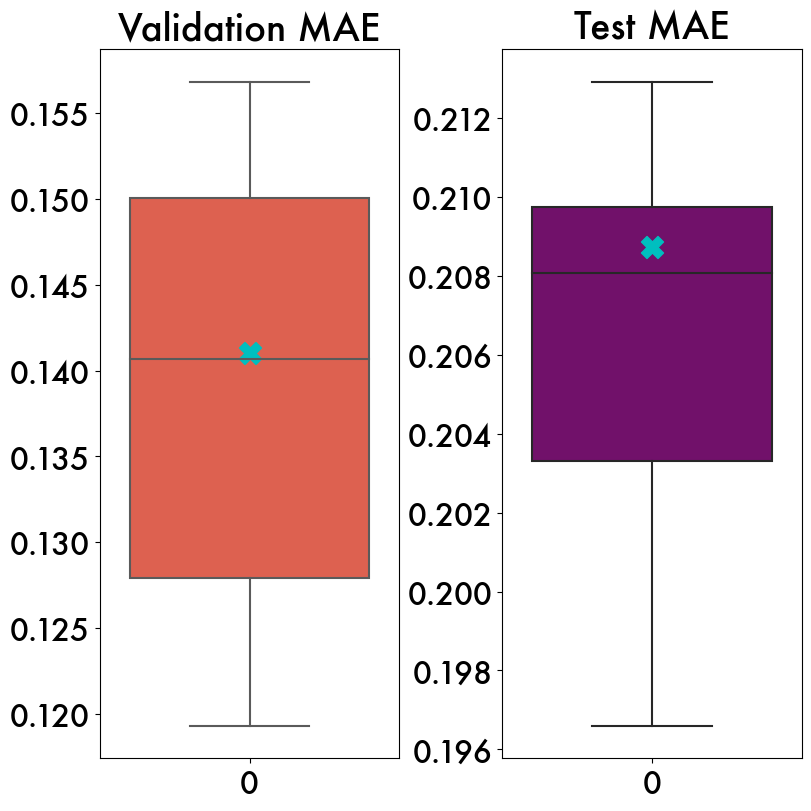

In [164]:
#
fig, axs = plt.subplots(1,2,figsize=(8,8), layout='constrained', sharey=False)
axs = axs.flatten()

sns.boxplot(folds_metrics['fvalidation_MAE'].values, ax=axs[0],color=model_palettes['Model_D'])
axs[0].scatter([0], [0.141022], marker='X', s=250, c='c')
axs[0].set_title('Validation MAE')


sns.boxplot(folds_metrics['ftest_MAE'].values,  ax=axs[1], color=model_palettes['Model_G'])
axs[1].scatter([0], [0.208741], marker='X', s=250, c='c')
axs[1].set_title('Test MAE')


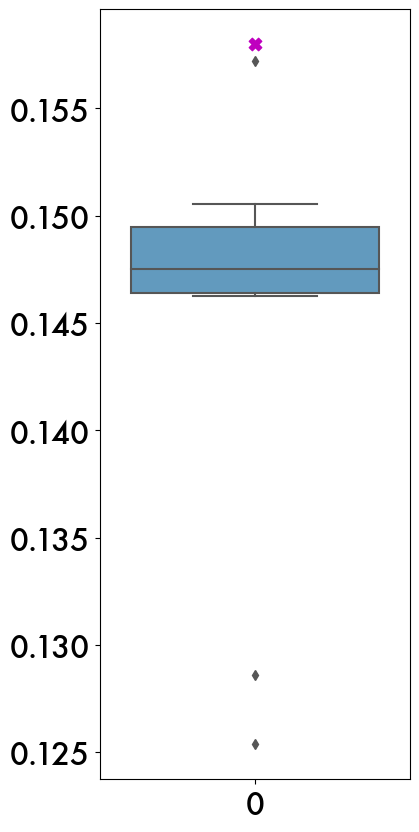

In [796]:
# Temporary boxplot
fig = plt.figure(figsize=(4,10))
ax = plt.gca()

sns.boxplot(folds_metrics['fvalidation_MAE'].values, color=model_palettes['Model_F'])
ax.scatter([0], [0.157987], marker='X', s=80, c='m')

# ax.scatter([0], [0.235285], marker='X', s=130, c='yellow')


# col1 =  model_palettes['Model_F']
# bp = ax.boxplot(folds_metrics['fvalidation_MAE'].values, patch_artist = True) #, labels='validation MAE') #


In [155]:
# notch shape box plot
bplot2 = ax2.boxplot(all_data,
                     notch=True,  # notch shape
                     vert=True,  # vertical box alignment
                     patch_artist=True,  # fill with color
                     labels=labels)  # will be used to label x-ticks
ax2.set_title('Notched box plot')

# fill with colors
colors = ['pink', 'lightblue', 'lightgreen']
for bplot in (bplot1, bplot2):
    for patch, color in zip(bplot['boxes'], colors):
        patch.set_facecolor(color)



## 7.2 LOO Spatial Blocking Validation of Float Data

- To use this section, make sure your training/val/test data is properly defined in section 2.1.2
- Use Leave One Out holdout validation

### Make additional "holdout" datasets for spatial blocking

- The particular training_holdout['5906030'], etc. are essentially the data we will be using to develop the model by running cell block 2.1.2
- That is, we want to make the training and validation from an 80/20 split of all the data except the SOGOS 

In [107]:
# Create holdout dictionaries (wmo id as key means that wmo was withheld as test data)

wmos = [x for x in wmoids if x != 5906030]  # will not rerun for 5906030

training_holdout = dict.fromkeys(wmos)
validation_holdout = dict.fromkeys(wmos)
test_holdout = dict.fromkeys(wmos)

def make_holdout_tvt(floatDF, withheld = 5904659):
    """
    @param: 
        floatDF : full dataframe with profiles from all floats
                    we make a new variable, floatdat, to ensure we never train on the test data.
        withheld: the wmoid of the float to withhold as the test set (make sure this is an integer!)
                    note that the default is the SOGOS float
                    the default is the equivalent of training on all data except sogos and then testing on it
    @return:
        ** note that the returned data is left unscaled!
        training_data: training data (80% of left profiles) with ship added; scaled by split_profiles()
        validation_data: validation data (20% of left profiles) with ship added; scaled by split_profiles()
        test_data: test data (all profiles from the withheld float); scaled manually
    """

    # Training data will never include 5906030
    floatdat = floatDF[(floatDF.wmoid!=withheld) & (floatDF.wmoid!=5906030)]

    [training_float, validation_float, empty] = split_profiles(floatdat, test_split = False)
    [training_ship, validation_ship, empty] = split_ship(shipDF, test_split = False)

    # Add ship data to training and validation
    training_data = pd.concat([training_float, training_ship], ignore_index=True)
    validation_data = pd.concat([validation_float, validation_ship], ignore_index=True)

    # Test on withheld float profiles
    test_data = floatDF[floatDF.wmoid==withheld]

    return training_data, validation_data, test_data


# make holdout datasets from floats and add ship 
# keep track of #obs in each dataset
nobs_training = []; nobs_validation=[]; nobs_test=[]
for wmo in wmos: 
    [training_holdout[wmo], validation_holdout[wmo], test_holdout[wmo]] = make_holdout_tvt(floatDF, withheld = wmo)

    nobs_training.append(training_holdout[wmo].shape[0])
    nobs_validation.append(validation_holdout[wmo].shape[0])
    nobs_test.append(test_holdout[wmo].shape[0])

# Create dataframe to keep track of #obs from each spatial-block dataset
dict = {'wmoid withheld':wmos, 'training obs': nobs_training, 'validation obs': nobs_validation, 'test obs (from wmoid)': nobs_test}
nobs_holdout = pd.DataFrame(dict)
print("# observations for spatially blocked data:"); print(nobs_holdout)

# observations for spatially blocked data:
   wmoid withheld  training obs  validation obs  test obs (from wmoid)
0         5904469         10813            2724                   1041
1         5904659          9548            2486                   2544
2         5905368         10501            2589                   1488
3         5905996          8851            2241                   3486
4         5906031          9026            2296                   3256
5         5906207          9624            2433                   2521


- Note: each of the dictionaries training_holdout, validation_holdout, and test_holdout are UNSCALED down (original ranges) 
- The datasets are scaled down before training to between 0 and 1, but are kept unscaled here so that the results can be rescaled back to the correct original ranges of that particular training dataset

### Spatially Blocked Model Training on Feature List

In [108]:
Mdl_holdout = dict.fromkeys(wmos)
MAE_holdout = dict.fromkeys(wmos) # each of these is in training, val, test order. 
IQR_holdout = dict.fromkeys(wmos)
r2_holdout = dict.fromkeys(wmos)
DF_err_holdout = dict.fromkeys(wmos)
val_error_holdout = dict.fromkeys(wmos)

Mdl = 'Model_H'

for wmo in tqdm(wmos):
    #Scaling is done internally within train_RF function
    [Mdl_holdout[wmo], MAE_holdout[wmo], IQR_holdout[wmo], r2_holdout[wmo], DF_err_holdout[wmo], val_error_holdout[wmo]] = train_RF(var_list[Mdl], 
                                                        training_holdout[wmo], validation_holdout[wmo], test_holdout[wmo],
                                                        ntrees=1000, max_feats = 1/3, scaler='StandardScaler')

100%|██████████| 6/6 [02:00<00:00, 20.01s/it]


In [109]:
holdoutRF = [Mdl_holdout, MAE_holdout, IQR_holdout, r2_holdout, DF_err_holdout]
# loo_metrics = get_loo_metrics(holdoutRF)
loo_metrics = pd.DataFrame()
loo_metrics['validation_MAE'] = [x[1][1].item() for x in MAE_holdout.items()]
loo_metrics['validation_IQR'] = [x[1][1].item() for x in IQR_holdout.items()]
loo_metrics['validation_r2'] = [x[1][1].item() for x in r2_holdout.items()]

loo_metrics['test_MAE'] = [x[1][2].item() for x in MAE_holdout.items()]
loo_metrics['test_IQR'] = [x[1][2].item() for x in IQR_holdout.items()]
loo_metrics['test_r2'] = [x[1][2].item() for x in r2_holdout.items()]

loo_metrics['withheld'] = Mdl_holdout.keys()
loo_metrics.set_index('withheld', inplace=True)

print('Model metrics for each holdout using ' + Mdl + ':')
print(description)
loo_metrics

Model metrics for each holdout using Model_H:
ntrees=1000, max_features=0.3333333333333333, scaler=StandardScaler


,validation_MAE,validation_IQR,validation_r2,test_MAE,test_IQR,test_r2
withheld,,,,,,
5904469,0.125954,0.189972,0.993975,0.348288,0.362124,0.958854
5904659,0.143324,0.219630,0.994209,0.398289,0.451920,0.970939
5905368,0.147002,0.208029,0.992011,0.298294,0.276604,0.984332
5905996,0.141714,0.216415,0.992072,0.566417,0.552156,0.970287
5906031,0.139436,0.197836,0.994531,0.639973,0.419914,0.944773
5906207,0.145009,0.202105,0.993408,0.210134,0.299430,0.983809


In [1085]:
model_metrics

,validation_MAE,validation_IQR,validation_r2,test_MAE,test_IQR,test_r2
model,,,,,,
Model_G,0.141022,0.204308,0.993847,0.208741,0.299928,0.985812
Model_D,0.141331,0.211370,0.993471,0.230674,0.337591,0.984072
Model_E,0.142409,0.214952,0.993515,0.217932,0.334644,0.984471
Model_F,0.144876,0.213796,0.993131,0.227044,0.330526,0.984484
Model_C,0.239698,0.354687,0.984250,0.247276,0.352181,0.975649
Model_B,0.266184,0.390613,0.978052,0.294011,0.352974,0.976448
Model_A,0.311713,0.477562,0.964485,0.318502,0.376563,0.968674


Text(0.5, 1.0, 'Test MAE')

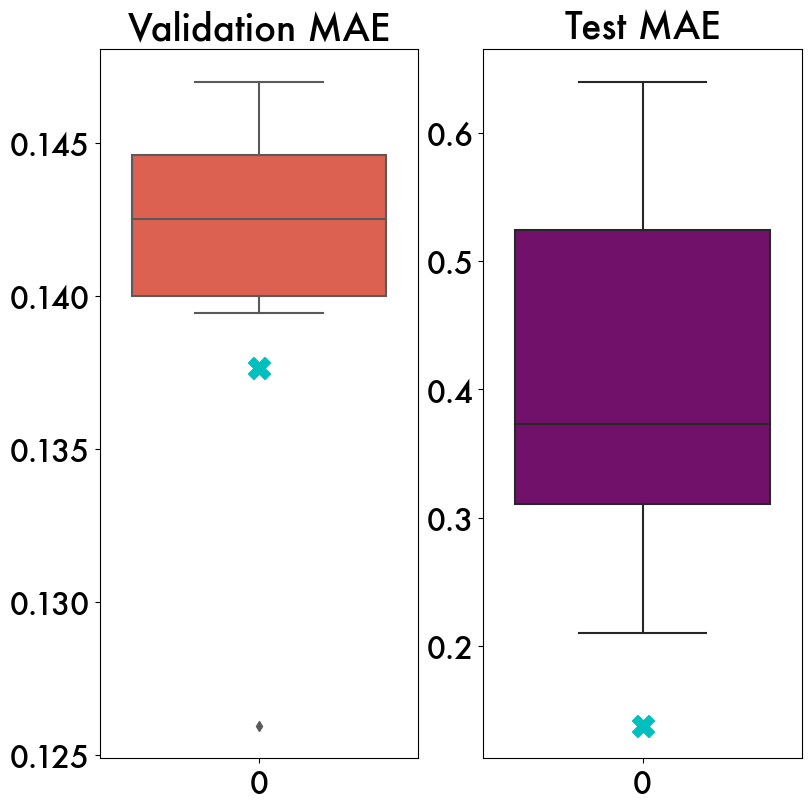

In [181]:
# temporary boxplot
# fig = plt.figure(figsize=(4,10))
# ax = plt.gca()


fig, axs = plt.subplots(1,2,figsize=(8,8), layout='constrained', sharey=False)
axs = axs.flatten()

sns.boxplot(loo_metrics['validation_MAE'].values, ax=axs[0],color=model_palettes['Model_D'])
axs[0].scatter([0], [0.137654], marker='X', s=250, c='c')
axs[0].set_title('Validation MAE')


sns.boxplot(loo_metrics['test_MAE'].values,  ax=axs[1], color=model_palettes['Model_G'])
axs[1].scatter([0], [0.137654], marker='X', s=250, c='c')
axs[1].set_title('Test MAE')


In [151]:
# Save loo metrics
loo_metrics.to_csv('../working-vars/RF-training/mlcv_spatialLOO_metrics_modG_' + desc + '.csv')

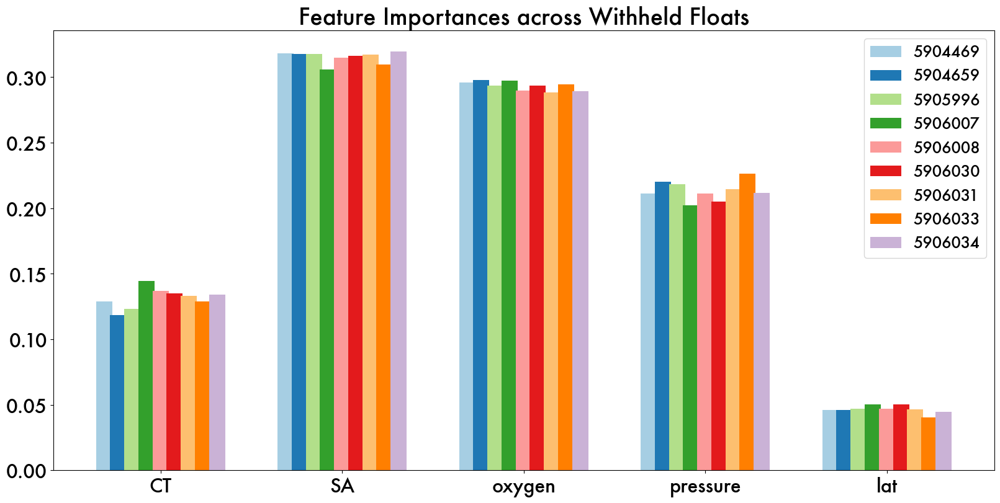

In [ ]:
# Compare feature importance across LOO iterations for a given model
fig = plt.figure(figsize=(16,8), layout='constrained')
ax = fig.gca()

barwidth=.7

xind = dict.fromkeys(wmoids)
xind[wmoids[0]] = np.arange(5)*9
for i in range(8):
    xind[wmoids[i+1]] = [x + barwidth for x in xind[wmoids[i]]]

for wmo in wmoids:
    ax.bar(xind[wmo], Mdl_holdout_5[wmo].feature_importances_, label=wmo, color=wmo_colors[wmo])

### 

# x = np.arange(5)*10  # the label locations
# width = 0.75  # the width of the bars
# multiplier = 0
ax.set_xticks(xind[wmoids[4]])
ax.set_xticklabels(var_list['Mdl_5B'])
ax.set_title('Feature Importances across Withheld Floats')
ax.legend()

In [111]:
# Test a spatial LOO model on SOGOS float:
platDF = test
Mdl = Mdl_holdout[5906008]

platDF = platDF[tvars+['profid', 'wmoid']]
cols_na = [col for col in platDF.columns if col not in ['profid', 'wmoid']]
platDF_nona = platDF.dropna(axis=0, subset=cols_na) 

platDF_scaled = scale_features(platDF, training, type='StandardScaler')
X_plat= platDF_scaled[var_list['Mdl_28t']].to_numpy()
Y_plat = Mdl.predict(X_plat)


Y_pred = rescale_target(Y_plat, training_holdout[5906008][var_predict], type='StandardScaler')

sgtest = test.dropna(axis=0, subset=cols_na).copy()
sgtest['test_prediction'] = Y_pred
sgtest['test_error'] = sgtest['test_prediction'] - sgtest[var_predict]
sgtest['test_relative_error'] = sgtest['test_error']/sgtest[var_predict]
print(np.abs(sgtest.test_error).median())


0.48465583096586684


# Comparison to ESPER/CANYON

In [103]:
desc = 'split2023'

In [104]:
float_6030 = test.copy()
for k in ['Model_A', 'Model_B', 'Model_C', 'Model_D', 'Model_E', 'Model_F', 'Model_G']:
    temp = RF_ver[4][k]['test_prediction'].values
    float_6030[k] = temp

float_6030['temperature'] = gsw.t_from_CT(float_6030.SA, float_6030.CT, float_6030.pressure)
float_6030['salinity'] = gsw.SP_from_SA(float_6030.SA, float_6030.pressure, float_6030.lon, float_6030.lat)

# Save for general use in RF-training
float_6030
float_6030.to_csv('../working-vars/RF-training/mlresult_wmo5906030_allpreds_' + desc + '.csv')

In [59]:
# Save data for CANYON
float_6030.to_csv('../working-vars/CANYON-prediction/mlresult_wmo5906030_allpreds_nov2023.csv')

# Save data for ESPER
importlib.reload(dfproc)
dfproc.DF2mat(float_6030, '../working-vars/ESPER-prediction/wmo5906030_data_nov2023.mat')

Saved to ../working-vars/ESPER-prediction/wmo5906030_data_nov2023.mat


In [63]:
# After running CANYON
dir = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/'
sogos_canyon = pd.read_csv(dir + 'CANYON-prediction/wmo5906030_MATLAB_canyon_pred_nov2023.csv')

for var in ['pressure', 'yearday', 'nitrate', 'Model_G']:
    sogos_canyon[var] = np.array(float_6030[var])

sogos_canyon['prediction_error'] = sogos_canyon.prediction - sogos_canyon.nitrate
sogos_canyon['pred_relative_error'] = sogos_canyon.prediction_error/sogos_canyon.nitrate

sogos_canyon.to_csv('../working-vars/CANYON-prediction/wmo5906030_df_with_canyon_nov2023.csv')

In [65]:
# After running ESPER
sogos_esper = pd.read_csv('../working-vars/ESPER-prediction/wmo5906030_MATLAB_esper_pred_nov2023.csv')
sogos_esper

for var in ['pressure', 'yearday', 'nitrate', 'Model_G']:
    sogos_esper[var] = np.array(float_6030[var])

sogos_esper['prediction_error'] = sogos_esper.prediction - sogos_esper.nitrate
sogos_esper['rel_pred_error'] = sogos_esper.prediction_error/sogos_esper.nitrate

sogos_esper.to_csv('../working-vars/ESPER-prediction/wmo5906030_df_with_esper_nov2023.csv')

In [1057]:
print('CANYON')
# print_error_bounds(RF_ver[4]['Model_G'], var='test_relative_error')
print_error_depths(sogos_canyon, var='rel_pred_error', pres_lim = [0,250])

CANYON
Errors between depths 0 to 250:
median abs error: 	0.04858486266772183
mean abs error 		0.05131581155092247

95% of errors fall between:
-0.1027 to 0.00154

During SOGOS between depths 0 to 250:
95% of errors fall between:
-0.0909 to -0.01198


(950.0, 0.0)

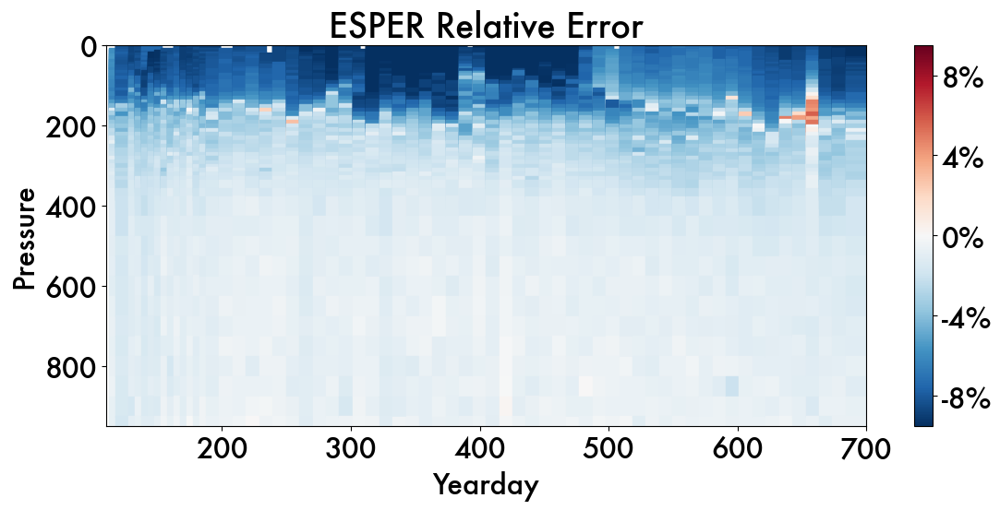

In [1009]:
# Plotting ESPER Relative Error profile maps
dat = sogos_esper

fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.rel_pred_error, cmap='RdBu_r', s=250, marker='s', vmin=-.095, vmax=.095) #vmin=-0.090, vmax=0.090) #, vmin=-2.5, vmax=2.5) # , , vmin = 24, vmax=35.0

ax.set_title('ESPER Relative Error')


ticklist = [-0.08, -0.04, 0, 0.04, 0.08] 
# ticklist = [-0.05, -0.025, 0, 0.025, 0.05]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist) # [-0.28, -0.025, 0, 0.025, 0.28]
# cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])  # Setting tick labels here
cbar.ax.set_yticklabels(['-8%', '-4%', '0%', '4%', '8%']) 


# cbar.set_label('Relative Error') 

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
# ax.set_xlim([120, 550])
# ax.set_ylim([600,0])

ax.set_xlim([110,700])
ax.set_ylim([950,0])

(950.0, 0.0)

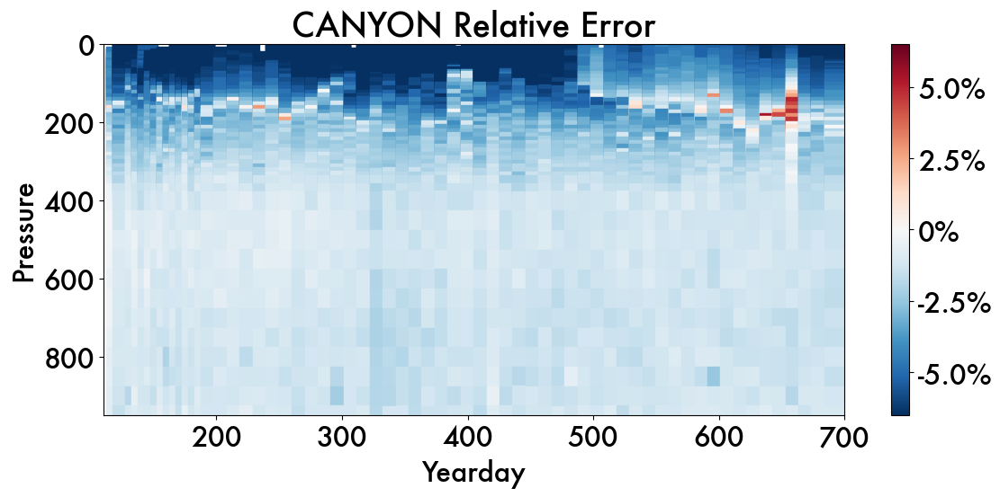

In [1001]:
# Plotting CANYON Relative Error profile maps
dat = sogos_canyon

fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.rel_pred_error, cmap='RdBu_r', s=250, marker='s', vmin=-.065, vmax=.065) #vmin=-0.065, vmax=0.065) #, vmin=-2.5, vmax=2.5) # , , vmin = 24, vmax=35.0

ax.set_title('CANYON Relative Error')

# ticklist = [-0.04, -0.02, 0, 0.02, 0.04] 
ticklist = [-0.05, -0.025, 0, 0.025, 0.05]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist) # [-0.28, -0.025, 0, 0.025, 0.28]
cbar.ax.set_yticklabels(['-5.0%', '-2.5%', '0%', '2.5%', '5.0%'])  # Setting tick labels here
# cbar.set_label('Relative Error') 

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
# ax.set_xlim([120, 550])
# ax.set_ylim([600,0])

ax.set_xlim([110,700])
ax.set_ylim([950,0])

Text(0.5, 0, 'Yearday')

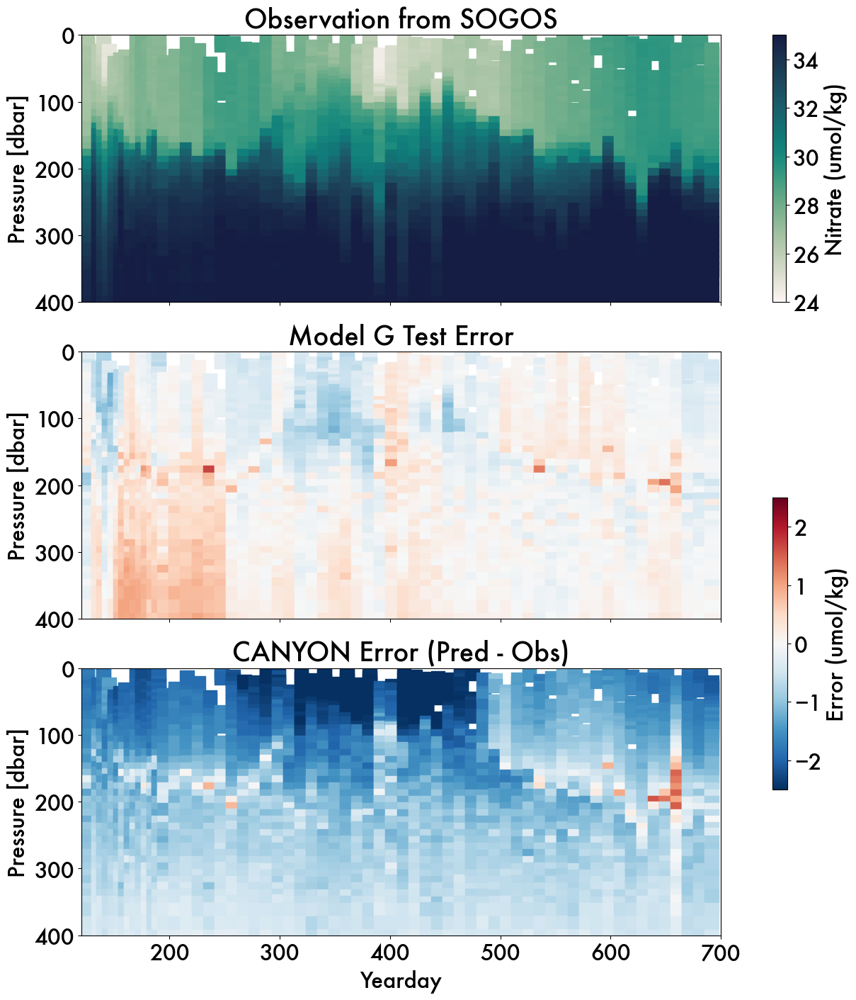

In [993]:
# * (Absolute, 3 subplots) Prediction, Obs, and Error Profiles
dat = RF_ver[4]['Model_G']

fig, axs = plt.subplots(3,1, figsize=(12,14), layout='constrained', sharex=True)
axs = axs.flatten()

sca0 = axs[0].scatter(dat.yearday, dat.pressure, c=dat.nitrate, cmap=cmo.tempo, s=200, marker='s', vmin=24, vmax=35) #, vmin=0, vmax=0.005
axs[0].set_title('Observation from SOGOS')

sca1 = axs[1].scatter(dat.yearday, dat.pressure, c=dat.test_error, cmap='RdBu_r', s=200, marker='s',vmin=-2.5, vmax=2.5) #, vmin=0, vmax=0.005
axs[1].set_title('Model G Test Error') 

sca2 = axs[2].scatter(sogos_canyon.yearday, sogos_canyon.pressure, c=sogos_canyon.prediction_error, cmap='RdBu_r', s=200, marker='s', vmin=-2.5, vmax=2.5)
axs[2].set_title('CANYON Error (Pred - Obs)')


fig.colorbar(sca0, ax=axs[0:1]).set_label('Nitrate (umol/kg)')
# fig.colorbar(sca1, ax=axs[1]).set_label('Nitrate (umol/kg)')
fig.colorbar(sca1, ax=axs[1:], shrink=0.5).set_label('Error (umol/kg)')
# fig.colorbar(sca2, ax=axs[2], shrink=0.5).set_label('Error (umol/kg)')

for ax in axs:
    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([120,700])
    ax.set_ylim([400,0])


axs[2].set_xlabel('Yearday')

# plt.savefig('../figures/canyon_err.png', dpi=300, bbox_inches='tight')

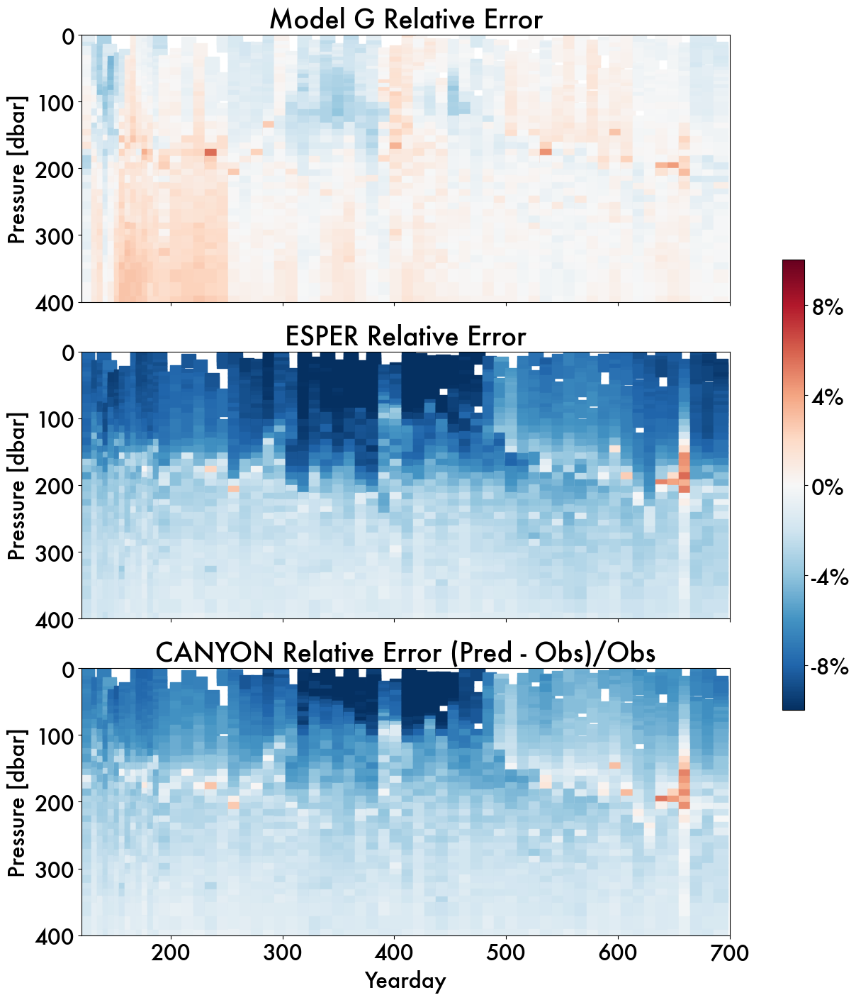

In [1040]:
# * (Absolute, 3 subplots) Prediction, Obs, and Error Profiles
# RELATIVE 
dat = RF_ver[4]['Model_G']

fig, axs = plt.subplots(3,1, figsize=(12,14), layout='constrained', sharex=True)
axs = axs.flatten()

sca0 = axs[0].scatter(dat.yearday, dat.pressure, c=dat.test_relative_error, cmap='RdBu_r', s=200, marker='s', vmin=-.10, vmax=.10) #, vmin=0, vmax=0.005
axs[0].set_title('Model G Relative Error')

sca1 = axs[1].scatter(sogos_esper.yearday, sogos_esper.pressure, c=sogos_esper.rel_pred_error, cmap='RdBu_r', s=200, marker='s',vmin=-.10, vmax=.10) #, vmin=0, vmax=0.005
axs[1].set_title('ESPER Relative Error') 

sca2 = axs[2].scatter(sogos_canyon.yearday, sogos_canyon.pressure, c=sogos_canyon.rel_pred_error, cmap='RdBu_r', s=200, marker='s', vmin=-.10, vmax=.10)
axs[2].set_title('CANYON Relative Error (Pred - Obs)/Obs')

ticklist = [-0.08, -0.04, 0, 0.04, 0.08] 
cbar = fig.colorbar(sca1, ax=axs[:], ticks=ticklist, shrink=0.5).ax.set_yticklabels(['-8%', '-4%', '0%', '4%', '8%']) 
# cbar.ax.set_yticklabels(['-8%', '-4%', '0%', '4%', '8%']) 

for ax in axs:
    ax.invert_yaxis()
    ax.set_ylabel('Pressure [dbar]')
    ax.set_xlim([120,700])
    ax.set_ylim([400,0])


axs[2].set_xlabel('Yearday')

plt.savefig('../figures/canyon_esper_rel_error_400m.png', dpi=300, bbox_inches='tight')

In [ ]:

dat_three = sogos_canyon
testerr_three = {
    "0-100": dat_three[(dat_three["pressure"] >= 0) & (dat_three["pressure"] < 100)]["prediction_error"].values,
    "100-200": dat_three[(dat_three["pressure"] >= 100) & (dat_three["pressure"] < 200)]["prediction_error"].values,
    "200-300": dat_three[(dat_three["pressure"] >= 200) & (dat_three["pressure"] < 300)]["prediction_error"].values,
    "300-400": dat_three[(dat_three["pressure"] >= 300) & (dat_three["pressure"] < 400)]["prediction_error"].values,
    "400-500": dat_three[(dat_three["pressure"] >= 400) & (dat_three["pressure"] < 500)]["prediction_error"].values,
    "500-600": dat_three[(dat_three["pressure"] >= 500) & (dat_three["pressure"] < 600)]["prediction_error"].values,
    "600-700": dat_three[(dat_three["pressure"] >= 600) & (dat_three["pressure"] < 700)]["prediction_error"].values,
    "700-800": dat_three[(dat_three["pressure"] >= 700) & (dat_three["pressure"] < 800)]["prediction_error"].values,
    "800-900": dat_three[(dat_three["pressure"] >= 800) & (dat_three["pressure"] < 900)]["prediction_error"].values,
    "900-1000": dat_three[(dat_three["pressure"] >= 900) & (dat_three["pressure"] < 1000)]["prediction_error"].values
}


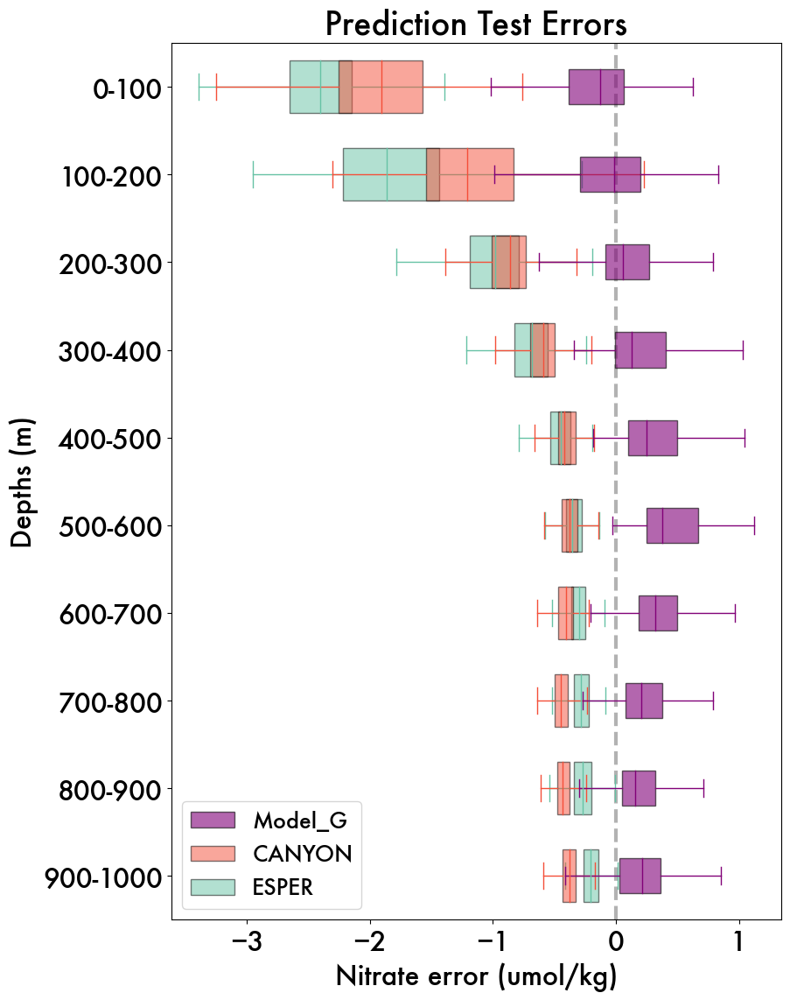

In [1067]:
# GOOD VERISON: Compare two models 


mod_one = 'Model_G'
mod_two = 'CANYON'
mod_three = 'ESPER'

dat_one = RF_ver[4][mod_one]
testerr_one = {
    "0-100": dat_one[(dat_one["pressure"] >= 0) & (dat_one["pressure"] < 100)]["test_error"].values,
    "100-200": dat_one[(dat_one["pressure"] >= 100) & (dat_one["pressure"] < 200)]["test_error"].values,
    "200-300": dat_one[(dat_one["pressure"] >= 200) & (dat_one["pressure"] < 300)]["test_error"].values,
    "300-400": dat_one[(dat_one["pressure"] >= 300) & (dat_one["pressure"] < 400)]["test_error"].values,
    "400-500": dat_one[(dat_one["pressure"] >= 400) & (dat_one["pressure"] < 500)]["test_error"].values,
    "500-600": dat_one[(dat_one["pressure"] >= 500) & (dat_one["pressure"] < 600)]["test_error"].values,
    "600-700": dat_one[(dat_one["pressure"] >= 600) & (dat_one["pressure"] < 700)]["test_error"].values,
    "700-800": dat_one[(dat_one["pressure"] >= 700) & (dat_one["pressure"] < 800)]["test_error"].values,
    "800-900": dat_one[(dat_one["pressure"] >= 800) & (dat_one["pressure"] < 900)]["test_error"].values,
    "900-1000": dat_one[(dat_one["pressure"] >= 900) & (dat_one["pressure"] < 1000)]["test_error"].values
}

dat_two = sogos_canyon
testerr_two = {
    "0-100": dat_two[(dat_two["pressure"] >= 0) & (dat_two["pressure"] < 100)]["prediction_error"].values,
    "100-200": dat_two[(dat_two["pressure"] >= 100) & (dat_two["pressure"] < 200)]["prediction_error"].values,
    "200-300": dat_two[(dat_two["pressure"] >= 200) & (dat_two["pressure"] < 300)]["prediction_error"].values,
    "300-400": dat_two[(dat_two["pressure"] >= 300) & (dat_two["pressure"] < 400)]["prediction_error"].values,
    "400-500": dat_two[(dat_two["pressure"] >= 400) & (dat_two["pressure"] < 500)]["prediction_error"].values,
    "500-600": dat_two[(dat_two["pressure"] >= 500) & (dat_two["pressure"] < 600)]["prediction_error"].values,
    "600-700": dat_two[(dat_two["pressure"] >= 600) & (dat_two["pressure"] < 700)]["prediction_error"].values,
    "700-800": dat_two[(dat_two["pressure"] >= 700) & (dat_two["pressure"] < 800)]["prediction_error"].values,
    "800-900": dat_two[(dat_two["pressure"] >= 800) & (dat_two["pressure"] < 900)]["prediction_error"].values,
    "900-1000": dat_two[(dat_two["pressure"] >= 900) & (dat_two["pressure"] < 1000)]["prediction_error"].values
}


dat_three = sogos_esper
testerr_three = {
    "0-100": dat_three[(dat_three["pressure"] >= 0) & (dat_three["pressure"] < 100)]["prediction_error"].values,
    "100-200": dat_three[(dat_three["pressure"] >= 100) & (dat_three["pressure"] < 200)]["prediction_error"].values,
    "200-300": dat_three[(dat_three["pressure"] >= 200) & (dat_three["pressure"] < 300)]["prediction_error"].values,
    "300-400": dat_three[(dat_three["pressure"] >= 300) & (dat_three["pressure"] < 400)]["prediction_error"].values,
    "400-500": dat_three[(dat_three["pressure"] >= 400) & (dat_three["pressure"] < 500)]["prediction_error"].values,
    "500-600": dat_three[(dat_three["pressure"] >= 500) & (dat_three["pressure"] < 600)]["prediction_error"].values,
    "600-700": dat_three[(dat_three["pressure"] >= 600) & (dat_three["pressure"] < 700)]["prediction_error"].values,
    "700-800": dat_three[(dat_three["pressure"] >= 700) & (dat_three["pressure"] < 800)]["prediction_error"].values,
    "800-900": dat_three[(dat_three["pressure"] >= 800) & (dat_three["pressure"] < 900)]["prediction_error"].values,
    "900-1000": dat_three[(dat_three["pressure"] >= 900) & (dat_three["pressure"] < 1000)]["prediction_error"].values
}



color_one = model_palettes['Model_G'] # sns.color_palette("Purples")[3]
color_two = model_palettes['Model_D']
color_three = model_palettes['Model_A']

# col_one = {'color':color_one, 'linewidth':1}
col_one = {'color':color_one, 'linewidth':1}
col_two = {'color':color_two, 'linewidth':1}
col_three = {'color':color_three, 'linewidth':1}

fig = plt.figure(figsize=(9,13))
# fig = plt.figure(figsize=(13,13))
ax = fig.gca()


bplot_three = ax.boxplot(testerr_three.values(), vert=False, showfliers=False, widths=0.6, 
                    patch_artist=True, boxprops={'facecolor':color_three, 'alpha':0.5, 'edgecolor':'k'},
                    medianprops= col_three,
                    capprops=col_three,
                    whiskerprops=col_three,
                    flierprops=col_three)

bplot_two = ax.boxplot(testerr_two.values(), vert=False, showfliers=False, widths=0.6, 
                    patch_artist=True, boxprops={'facecolor':color_two, 'alpha':0.5, 'edgecolor':'k'},
                    medianprops= col_two,
                    capprops=col_two,
                    whiskerprops=col_two,
                    flierprops=col_two)

bplot_one = ax.boxplot(testerr_one.values(), vert=False, showfliers=False, widths=0.4, 
                    patch_artist=True, boxprops={'facecolor':color_one, 'alpha':0.6},
                    medianprops=col_one,
                    capprops=col_one,
                    whiskerprops=col_one,
                    flierprops=col_one)


# bplot_two = ax.boxplot(testerr_two.values(), vert=False, showfliers=False, widths=0.5, 
#                     patch_artist=True, boxprops={'facecolor':'m', 'alpha':0.5, 'edgecolor':'k'},
#                     medianprops= col_two,
#                     capprops=col_two,
#                     whiskerprops=col_two,
#                     flierprops=col_two)


ax.invert_yaxis()
ax.axvline(x=0, color='k', linestyle='--', linewidth=3, alpha=0.3, zorder=0)

labels = testerr_one.keys()
plt.yticks(range(1, len(labels) + 1), labels)
plt.ylabel("Depths (m)")
plt.xlabel("Nitrate error (umol/kg)")
plt.title("Prediction Test Errors")

ax.legend([bplot_one["boxes"][0], bplot_two["boxes"][0], bplot_three["boxes"][0]], [mod_one, mod_two, mod_three], loc='lower left', fontsize=18)

plt.savefig('../figures/canyon_esper_comparison_bydepth.png', dpi=300, bbox_inches='tight')

# 8.0 GLIDER PREDICTION


## 8.0 Basic glider statistics

## 8.1 Prediction

In [153]:
file_path = '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/working-vars/glider/'
df_659 = pd.read_csv(file_path + 'df_659_tsO2corr_1101.csv')
df_660 = pd.read_csv(file_path + 'df_660_tsO2corr_1101.csv')

df_659 = df_659.replace(-np.inf, np.nan)
df_659 = df_659.replace(np.inf, np.nan)

df_660 = df_660.replace(-np.inf, np.nan)
df_660 = df_660.replace(np.inf, np.nan)

In [154]:
print('Glider 660:')
sg.print_horizontal_res(df_660)

print('\nSOGOS Float: ')
sg.print_horizontal_res(test)

# sg.print_profile_nobs(df_660)
# sg.print_vertical_res(df_660)

Glider 660:
Average horizontal distance between surfacing (km): 	1.6878626294276706

SOGOS Float: 
Average horizontal distance between surfacing (km): 	70.6397521599474


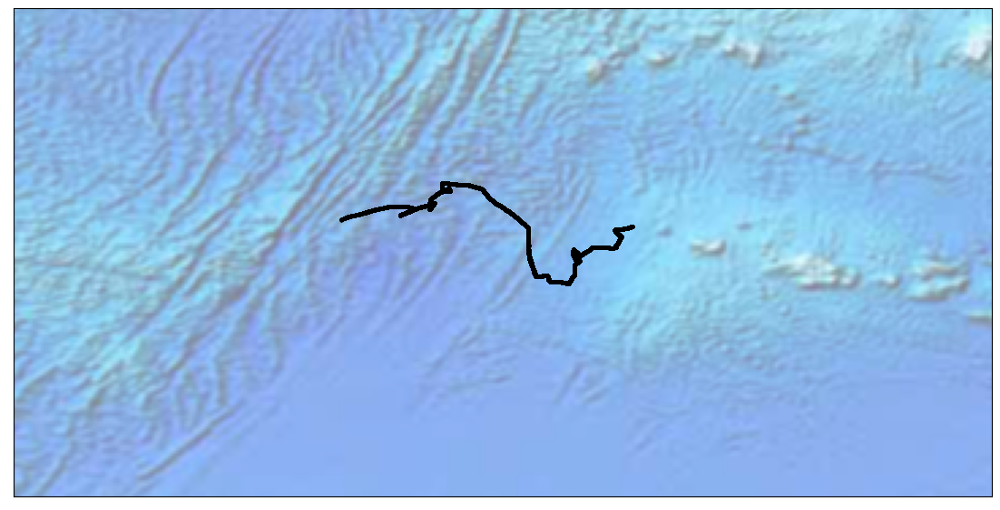

In [1042]:
fig = plt.figure(figsize=(14, 7), edgecolor='w')
m = Basemap(projection='cyl', resolution='h',
            llcrnrlat=-60, urcrnrlat=-45,
            llcrnrlon=20, urcrnrlon=50)


m.etopo(scale=0.8, alpha=0.5)

df=df_659
tag= '659'
lon = df.lon.values
lat = df.lat.values
xpt, ypt=m(lon,lat)

# m.plot(xpt, ypt, color = 'k', alpha=0.1, linewidth=2, label=tag, zorder=3)
m.scatter(xpt, ypt , color = 'k', alpha=0.1, s=3, zorder=3)

plt.show()

In [155]:
df_659['wmoid'] = np.tile(np.nan, df_659.shape[0])
df_660['wmoid'] = np.tile(np.nan, df_660.shape[0])

In [156]:
def add_yd_sinusoids(DF):
    DF['ydcos'] = [sg.get_ydsines(x)[0] for x in DF.yearday.values]
    DF['ydsin'] = [sg.get_ydsines(x)[1] for x in DF.yearday.values]

    return DF

df_659 = add_yd_sinusoids(df_659)
df_660 = add_yd_sinusoids(df_660)

In [157]:
# dav_659 = dfproc.make_diveav(df_659, mld_lim=[5,20]); print() 
# dav_660 = dfproc.make_diveav(df_660, mld_lim=[5,20])
# OBSOLETE!
# FIND DAV GLIDER CALCULATION IN sogos_mixedlayer_analysis.ipynb

number of profiles with no 10m data:  38
approx # of obs within profile that were averaged for final mlp:  4.279176201372998
number of nan mlds even where 10m exists:  77

number of profiles with no 10m data:  29
approx # of obs within profile that were averaged for final mlp:  5.404102564102564
number of nan mlds even where 10m exists:  71


In [158]:
df_659 = df_659[tvars+['profid', 'wmoid', 'bbp470', 'bbp700', 'bbp695']]
cols_na = [col for col in df_659.columns if col not in ['profid', 'wmoid', 'bbp470', 'bbp700', 'bbp695']]
df_659 = df_659.dropna(axis=0, subset=cols_na)

In [159]:
df_660 = df_660[tvars+['profid', 'wmoid', 'bbp470', 'bbp700', 'bbp695']]
cols_na = [col for col in df_660.columns if col not in ['profid', 'wmoid', 'bbp470', 'bbp700', 'bbp695']]
df_660 = df_660.dropna(axis=0, subset=cols_na)

In [160]:
# Method predict glider
def predict_glider(platDF, Mdl, var_list, var_predict='nitrate', type='StandardScaler'):

    platDF = platDF[tvars+['profid', 'wmoid']]
    cols_na = [col for col in platDF.columns if col not in ['profid', 'wmoid']]
    platDF_nona = platDF.dropna(axis=0, subset=cols_na) 

    platDF_scaled = scale_features(platDF_nona, training, type=type)

    X_plat= platDF_scaled[var_list].to_numpy()
    Y_plat = Mdl.predict(X_plat)

    # changed nov 2023, do not scale target

    # Currently scales back to *TRAINING* range. 
    # Note that RF model is trained on training data scaled standard. 
    # It spits out a number that is rescaled according to the training nitrate value.

    # Y_pred = rescale_target(Y_plat, training[var_predict], type='StandardScaler')


    return Y_plat


In [575]:
# not method version

# platDF = df_659
# Mdl = aou_standard[0]['Mdl_26t']
# var_list_mdl = var_list['Mdl_26t']


# cols_na = [col for col in platDF.columns if col not in ['profid']]
# platDF_nona = platDF.dropna(axis=0, subset=cols_na) 

# platDF_scaled = scale_features(platDF, type='StandardScaler')

# X_plat= platDF_scaled[var_list_mdl].to_numpy()
# Y_plat = Mdl.predict(X_plat)

# # Currently scales back to *TRAINING* range. 
# # Note that RF model is trained on training data scaled standard. 
# # It spits out a number that is rescaled according to the training nitrate value.

# orig = np.array(training[var_predict]).reshape(-1,1) # note
# scaled = np.array(Y_plat).reshape(-1,1)
# scaler = preprocessing.StandardScaler().fit(orig)
# temp = scaler.inverse_transform(scaled)
# df_659['nitrate_26t_training'] = temp

In [161]:
df_660['nitrate_G'] = predict_glider(df_660, RF_ver[0]['Model_G'], var_list['Model_G'])
df_659['nitrate_G'] = predict_glider(df_659, RF_ver[0]['Model_G'], var_list['Model_G'])

In [162]:
df_660

,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,spice,o2sat,ydcos,ydsin,profid,wmoid,bbp470,bbp700,bbp695,nitrate_G
4,119.510598,-51.4952,30.0253,8.070,3.646773,33.958220,327.518402,27.012310,-10.656217,-0.411330,320.416311,-0.467521,0.883982,6600000,NaN,0.000454,0.000227,0.2074,23.919690
5,119.510656,-51.4952,30.0253,9.079,3.631773,33.962220,327.685360,27.016935,-9.863941,-0.410118,320.523201,-0.467521,0.883982,6600000,NaN,0.000501,0.000227,0.2074,24.181128
6,119.510714,-51.4952,30.0254,10.088,3.612773,33.967220,327.686533,27.022739,-10.883128,-0.408624,320.658855,-0.467522,0.883981,6600000,NaN,0.000471,0.000233,0.2379,24.204558
7,119.510772,-51.4951,30.0254,11.097,3.615773,33.965220,327.512713,27.020866,-11.794115,-0.409716,320.640409,-0.467523,0.883981,6600000,NaN,0.000501,0.000240,0.2684,24.199632
8,119.510830,-51.4951,30.0254,12.106,3.612773,33.969220,327.396822,27.024322,-10.664905,-0.407211,320.653843,-0.467524,0.883980,6600000,NaN,0.000489,0.000223,0.3294,24.196119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
947960,205.873787,-51.5287,39.0112,965.631,2.114773,34.873222,182.046058,27.875646,-12.497102,0.081283,330.396795,-0.920139,-0.391592,6601013,NaN,NaN,NaN,NaN,32.267929
947961,205.873700,-51.5287,39.0112,966.645,2.114773,34.874220,182.106957,27.876441,-12.497102,0.081985,330.394220,-0.920140,-0.391591,6601013,NaN,NaN,NaN,NaN,32.267104
947963,205.873498,-51.5287,39.0112,968.672,2.114773,34.874220,182.209926,27.876441,-12.494619,0.081985,330.394226,-0.920141,-0.391587,6601013,NaN,NaN,NaN,NaN,32.268215
947964,205.873382,-51.5287,39.0112,969.685,2.114773,34.875220,182.221260,27.877237,-12.494619,0.082687,330.391651,-0.920142,-0.391586,6601013,NaN,NaN,NaN,NaN,32.237623


In [163]:
file_path = '../working-vars/nitrate-prediction/'
df_659.to_csv(file_path + 'RFpred_659_modG_' + desc + '.csv')
df_660.to_csv(file_path + 'RFpred_660_modG_' + desc + '.csv')

## Overlay original float data with prediction. 

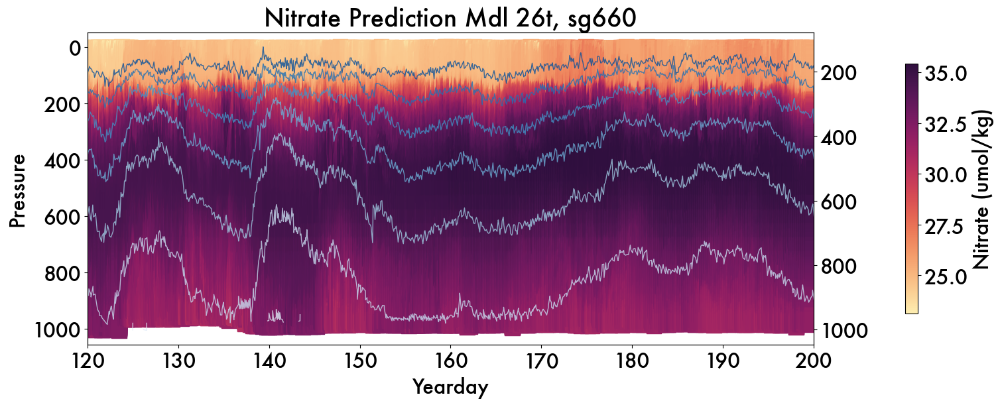

In [156]:
# Plot density with density contours
# iso_dict = isoline_660.pop('27.2')
iso_dict = isoline_659
minday = 120
maxday = 200
df = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
tag = 'Mdl 26t, sg660'


# Create the scatter plot
fig, ax1 = plt.subplots(figsize=(15,6), layout='constrained')
sca = ax1.scatter(df['yearday'], df.pressure, c=df.nitrate_26t, cmap=cmo.matter, s=270, marker='s') #, vmin = 22.5, vmax=35.0)
ax1.set_ylabel('Pressure')

fig.colorbar(sca, ax=ax1, shrink=0.8).set_label('Nitrate (umol/kg)')

ax2 = ax1.twinx()
for ind, (key, val) in enumerate(iso_dict.items()):
    # Skipping lines for dates

    # Sort the DataFrame by 'yearday' to ensure the data points are in order
    val = val.sort_values(by = 'yearday')
    xval = []; yval = []

    # Iterate over the DataFrame and build the x and y values with NaN separators
    for i in range(len(val) - 1):
        xval.append(val.iloc[i]['yearday'])
        yval.append(val.iloc[i]['pressure'])
        if val.iloc[i + 1]['yearday'] - val.iloc[i]['yearday'] > 1:
            xval.append(None)
            yval.append(None)

    # Add the last data point
    xval.append(val.iloc[-1]['yearday'])
    yval.append(val.iloc[-1]['pressure'])

    ax2.plot(xval, yval, linewidth=1, label=key, color=palette[ind], alpha=0.8)

# ax2.legend(fontsize=14)
# labelLines(ax2.get_lines(), align=False, fontsize=18)
for ax in [ax1, ax2]:
    ax.invert_yaxis()
    ax.set_xlim([minday, maxday])

ax1.set_xlabel('Yearday')
plt.title('Nitrate Prediction ' + tag)

# ax1.axvline(x=187, color='c', linestyle='--', linewidth=1, alpha=0.9, zorder=3)
# ax1.axvline(x=194, color='c', linestyle='--', linewidth=1, alpha=0.9, zorder=3)
# Display the plot
plt.show()


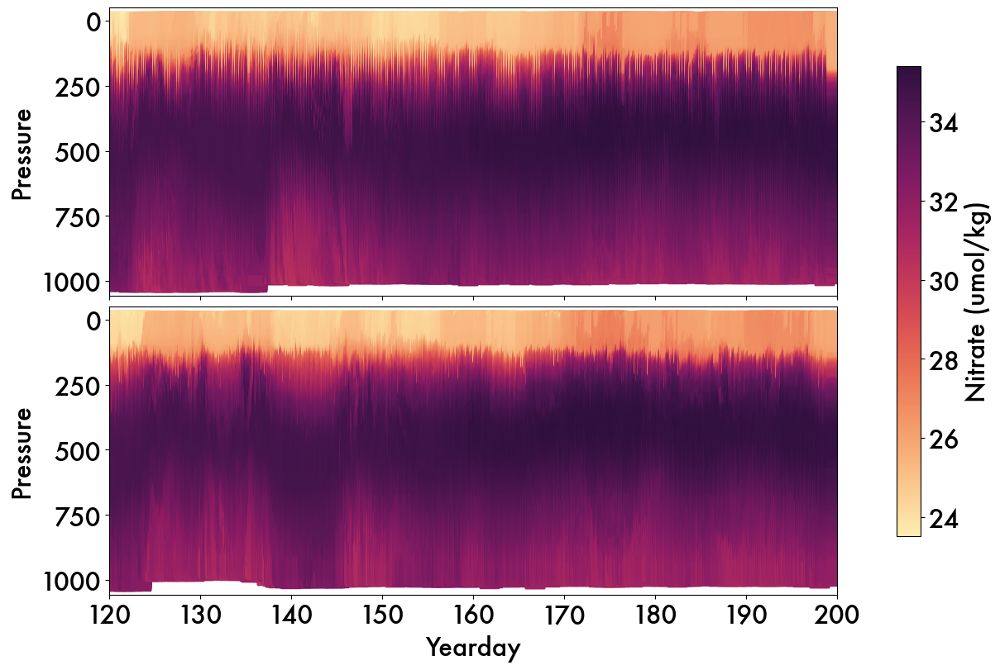

In [289]:
# Plot density with density contours
iso_dict = isoline_660
minday = 120
maxday = 200
dat_660 = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
dat_659 = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]
tag = 'Mdl 28t, sg660'


# Create the scatter plot
fig, axs = plt.subplots(2, 1, figsize=(12,8), sharex=True, layout='constrained')
axs = axs.flatten()

sca0 = axs[0].scatter(dat_659['yearday'], dat_659.pressure, c=dat_659.nitrate_28t, cmap=cmo.matter, s=270, marker='s') #, vmin = 22.5, vmax=35.0)
sca1 = axs[1].scatter(dat_660['yearday'], dat_660.pressure, c=dat_660.nitrate_28t, cmap=cmo.matter, s=270, marker='s') #, vmin = 22.5, vmax=35.0)

ax.set_ylabel('Pressure')
 
fig.colorbar(sca0, ax=axs[:], shrink=0.8).set_label('Nitrate (umol/kg)')

for ax in axs:
    ax.invert_yaxis()
    ax.set_xlim([minday, maxday])
    ax.set_ylabel('Pressure')

axs[1].set_xlabel('Yearday')
# plt.title('Nitrate Prediction ' + tag)

# Display the plot
plt.show()

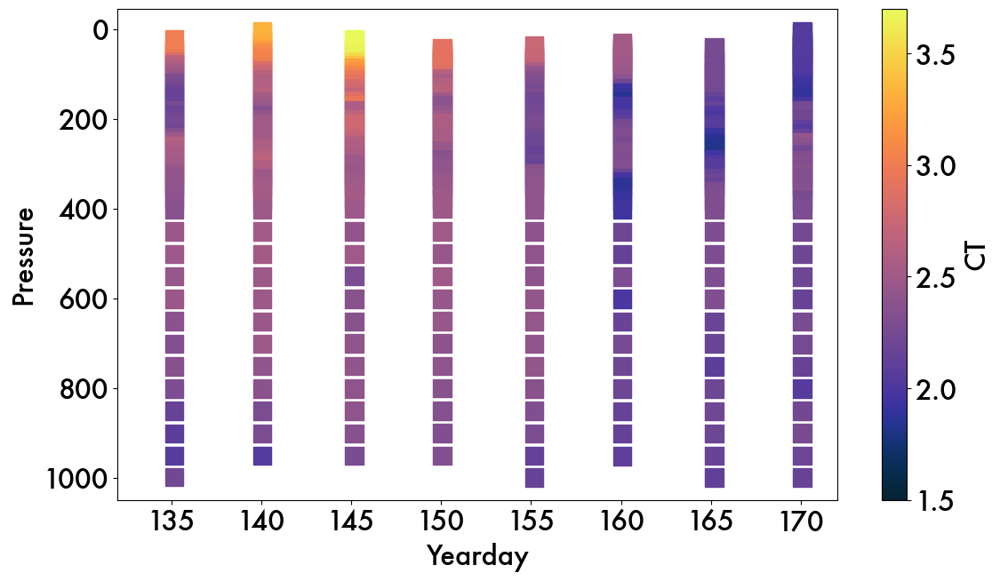

(800.0, 0.0)

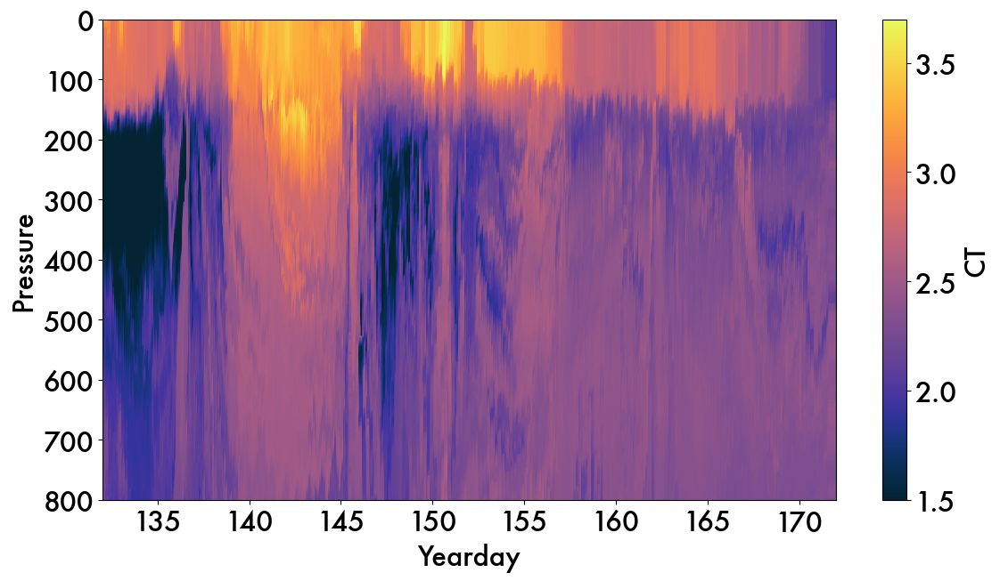

In [1165]:
# Float with glider
minday = 132
maxday = 172

# First plot float data
dat = test[(test.yearday <maxday) & (test.yearday > minday)]

fig  = plt.figure(figsize=(12,7), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.CT, cmap=cmo.thermal, s=220, marker='s', vmin=1.5, vmax=3.7) #, marker='s')
# ax.set_title('Float CT')

# ticklist = [1.5, 2.0, 2.5, 3.0, 3.5]
cbar = plt.colorbar(sca, ax=ax, ticks=ticklist).set_label('CT')
# cbar.set_yticklabels([1.5, 2.0, 2.5, 3.0, 3.5])

# plt.style.use("dark_background")

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
plt.show()

######################
# Plot Glider

dat = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
# tag = '26t, glider 659'

fig  = plt.figure(figsize=(12,7), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.CT, cmap=cmo.thermal, s=100, marker='s', vmin=1.5, vmax=3.7)
# ax.set_title('Model ' + tag )

plt.colorbar(sca, ax=ax).set_label('CT')

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([800,0])





(800.0, 0.0)

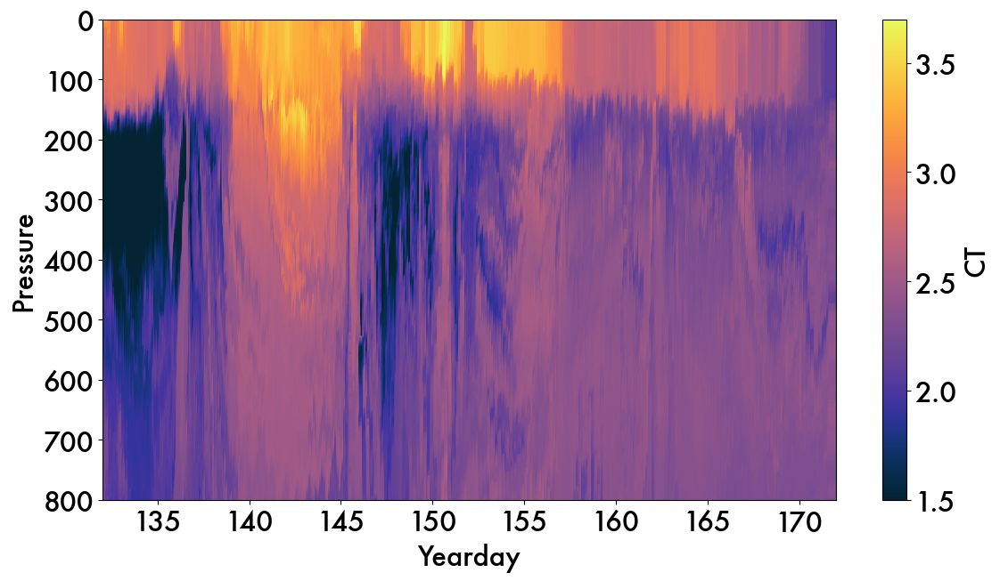

In [1164]:
# * Glider CT profile
minday = 132
maxday = 172

dat = df_660[(df_660.yearday <maxday) & (df_660.yearday > minday)]
# tag = '26t, glider 659'

fig  = plt.figure(figsize=(12,7), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.CT, cmap=cmo.thermal, s=100, marker='s', vmin=1.5, vmax=3.7)
# ax.set_title('Model ' + tag )

plt.colorbar(sca, ax=ax).set_label('CT')

ax.invert_yaxis()
ax.set_ylabel('Pressure')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([800,0])

(800.0, 0.0)

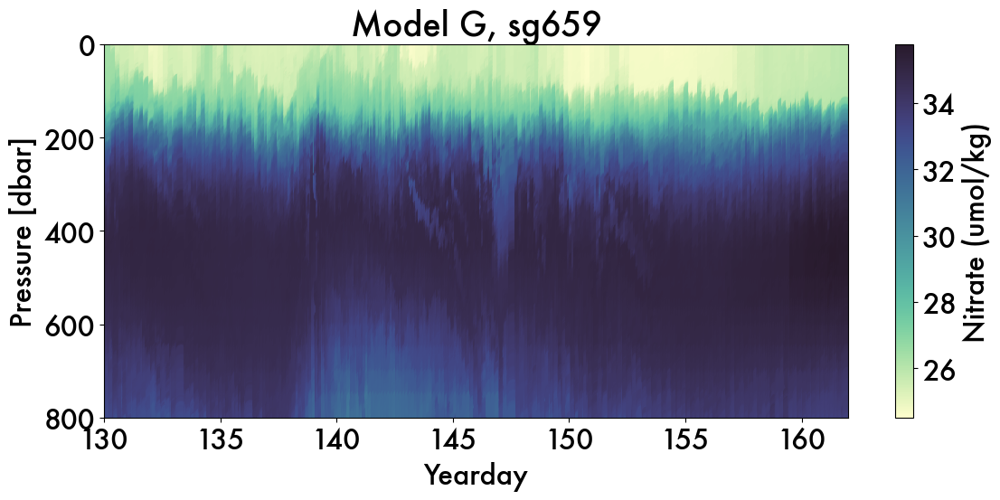

In [1054]:
# * Glider prediction nitrate profile
minday = 130
maxday = 162

dat = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]
tag = 'Model G, sg659'


fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.nitrate_G, cmap=cmo.deep, s=50) #, vmin=1.5, vmax=3.6) #, marker='s')
ax.set_title(tag )

plt.colorbar(sca, ax=ax).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([800,0])


# Glider ML Statistics

In [99]:
len(sg.list_profile_DFs(df_659))

912

In [1160]:
importlib.reload(dfproc)

<module 'sgmod_DFproc' from '/Users/sangminsong/Library/CloudStorage/OneDrive-UW/Code/SOGOS-ML/scripts/sgmod_DFproc.py'>

In [900]:
dav_659 = dfproc.make_diveav(df_659) # from 7 to 13

number of profiles with no 10m data:  59
approx # of obs within profile that were averaged for final mlp:  1.9273153575615474


In [1161]:
dav_659 = dfproc.make_diveav(df_659) # from 5 to 15 dbar

number of profiles with no 10m data:  41
approx # of obs within profile that were averaged for final mlp:  1.9380022962112515


In [901]:
dav_660 = dfproc.make_diveav(df_660)

number of profiles with no 10m data:  81
approx # of obs within profile that were averaged for final mlp:  2.1917659804983747


In [923]:
# Make new dataframe that is only the upper DF in the mixed layer 

# now in dfproc
# mldf_659 = pd.DataFrame()

# for i, prof in enumerate(dfproc.list_profile_DFs(df_659)):
#     mlp = dav_659.mld[i]
#     if mlp != np.nan:
#         upperprof = prof[prof.pressure<mlp].copy()

#         mlp_array = np.tile(mlp, upperprof.shape[0])
#         upperprof['mld'] = mlp_array
#         mldf_659 = pd.concat([mldf_659, upperprof], ignore_index=True)

mldf_659 = dfproc.make_mldf(df_659, dav_659)

,yearday,lat,lon,pressure,CT,SA,oxygen,sigma0,log_buoyancy,spice,...,mncos,mnsin,month,profid,wmoid,bbp470,bbp700,bbp695,nitrate_G,mld
0,119.616270,-51.4817,30.0739,4.035,3.565758,33.985030,330.053918,26.900568,-12.977491,-0.534645,...,-0.500000,0.866025,4,6590002,NaN,0.000469,0.000200,0.4636,24.152435,104.940
1,119.616328,-51.4817,30.0739,5.044,3.565758,33.986034,330.290852,26.901363,-12.977491,-0.533936,...,-0.500000,0.866025,4,6590002,NaN,0.000457,0.000190,0.4697,24.154595,104.940
2,119.616357,-51.4817,30.0739,6.053,3.565758,33.986034,330.425390,26.901363,-15.191113,-0.533936,...,-0.500000,0.866025,4,6590002,NaN,0.000445,0.000180,0.4758,24.154742,104.940
3,119.616385,-51.4817,30.0740,7.062,3.564758,33.986034,330.587267,26.901458,-12.440718,-0.534042,...,-0.500000,0.866025,4,6590002,NaN,0.000492,0.000213,0.5246,24.153960,104.940
4,119.616414,-51.4817,30.0740,8.070,3.563758,33.987034,330.744297,26.902345,-11.236404,-0.533441,...,-0.500000,0.866025,4,6590002,NaN,0.000475,0.000216,0.4758,24.151830,104.940
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46593,206.065014,-51.7020,38.9939,139.262,1.799758,34.098034,324.583938,27.139991,-10.434721,-0.621782,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000110,0.1464,28.013817,144.309
46594,206.064898,-51.7020,38.9939,140.271,1.796758,34.101032,324.048930,27.142603,-11.141427,-0.619929,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000120,0.1342,28.089606,144.309
46595,206.064782,-51.7021,38.9939,141.280,1.797758,34.102030,323.554817,27.143326,-10.872650,-0.619146,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000110,0.1464,28.106280,144.309
46596,206.064667,-51.7021,38.9939,142.290,1.796758,34.106033,323.131232,27.146590,-10.455206,-0.616424,...,-0.866025,-0.500000,7,6590911,NaN,0.000363,0.000120,0.1464,28.159023,144.309


In [924]:
nitrate_variance = []
mlpres = []
for prof in dfproc.list_profile_DFs(mldf_659):
    nitrate_variance.append(np.std(prof.nitrate_G))
    mlpres.append(prof.mld.mean())
nitrate_variance

[0.09848078691261018,
 0.11487833957309397,
 0.1051250345358102,
 0.11846076340140953,
 0.12185091045700784,
 0.1079588292703983,
 0.16362988242031207,
 0.1632790932337243,
 0.28268706122987025,
 0.2275748244040579,
 0.20490237502660086,
 0.2786992247278719,
 0.1692528024319526,
 0.17307103672487772,
 0.1191949995972077,
 0.267868272806021,
 0.24507364460642347,
 0.18796303086978278,
 0.1474224910244779,
 0.10362655199896308,
 0.17178699060268998,
 0.14930821366532152,
 0.11204975768793025,
 0.13155926671527624,
 0.1611756878256817,
 0.08477269693176528,
 0.12278457328929006,
 0.15405754991372397,
 0.25437436050647416,
 0.2685994042474995,
 0.25648674650185416,
 0.10516561142999757,
 0.22168392944595142,
 0.22894930508031175,
 0.28217977546125683,
 0.18768459118165787,
 0.2225643367902136,
 0.20694145654383572,
 0.2037341781978109,
 0.24718290502059362,
 0.22193420439996453,
 0.21445419224964726,
 0.22131775083854027,
 0.17160213163422583,
 0.25363783731491685,
 0.24042243793193216,
 0

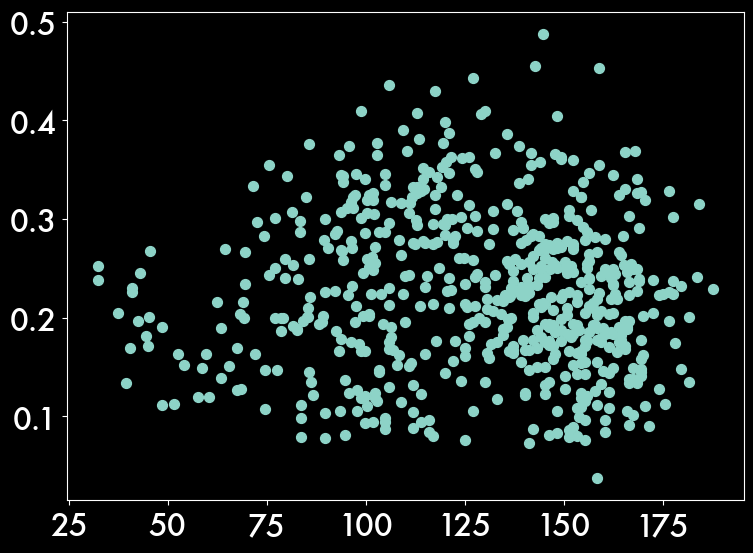

In [928]:
fig = plt.figure(figsize=(8,6), layout='tight')
ax = fig.gca()

ax.scatter(mlpres, nitrate_variance, s=50) #, vmin=1.5, vmax=3.6) #, marker='s')

(200.0, 0.0)

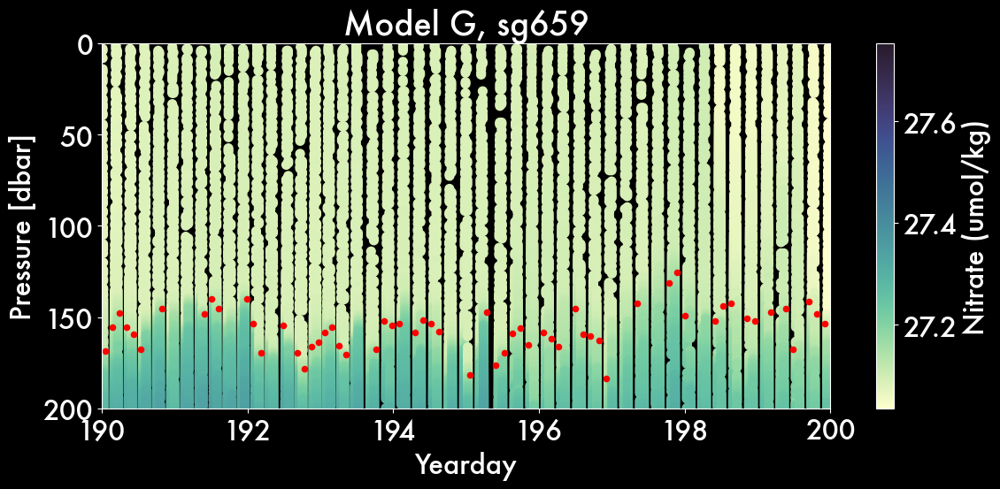

In [904]:
# * Preidction, Obs, and Error Profiles
minday = 190
maxday = 200

dat = df_659[(df_659.yearday <maxday) & (df_659.yearday > minday)]
tag = 'Model G, sg659'


fig  = plt.figure(figsize=(12,6), tight_layout=True)
ax = plt.gca()
sca = ax.scatter(dat.yearday, dat.pressure, c=dat.sigma0, cmap=cmo.deep, s=50) #, vmin=1.5, vmax=3.6) #, marker='s')
ax.set_title(tag )

ax.scatter(dav_659.yearday, dav_659.mld, color='r', s=20)

plt.colorbar(sca, ax=ax).set_label('Nitrate (umol/kg)')

ax.invert_yaxis()
ax.set_ylabel('Pressure [dbar]')
ax.set_xlabel('Yearday')
ax.set_xlim([minday, maxday])
ax.set_ylim([200,0])



In [930]:
dav_659.to_csv('../working-vars/glider/mld_659_1101.csv')
dav_660.to_csv('../working-vars/glider/mld_660_1101.csv')